# 농산물 데이터를 활용한 예측 모델

목차\
주제

1.1 주제\
1.2 주제설명\
1.3 선정배경
전처리

분석

3.1 EDA분석

모델링

4.1 SVM\
4.2 LightGBM\
4.3 LSTM

결론

5.1 모델평가\
5.2 실패\
5.3 느낀점\
5.4 참조문헌


1. 주제
1.1 주제

농산물 가격 예측

1.2 주제 설명

날씨와 유가를 적용하여 일정 기간 후의 농산물 가격을 예측하는 모델을 개발한다.

1.3 선정 배경

농가 소득 진작을 위해서는 안정된 농산물 가격이 중요하다. 하지만, 현실에서는 생산량, 날씨, 유가 등의 다양한 요인들에 의해 농산물 가격이 요동치게 된다. 그렇기에 정부에서는 수매나 생산량 조절등을 통해 가격을 통제하려고 한다. 하지만, 미래 가격을 예측하는 것은 쉽지 않은 일이다. 그렇기에 농산물 가격을 예측하여 안정된 농산물 가격을 만들도록 정부와 농가에 많은 도움을 주고자 함에 목적이 있다.


1.4 사용 데이터셋

1. 2016.01.01~2020.09.28 전국 농산물 도매 가격

2. 2016.01.01~2020.09.28 주산지별 농업기상관측 데이터

3. 2016.01.01~2020.09.28 원유, 경유 데이터


# 2. 전처리 및 외부데이터 합치기

## 외부데이터 합치기- 날씨, 원유

In [ ]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import xml.etree.ElementTree as ET
import json
import requests
import urllib
import urllib.request
import datetime
import folium
import os
import datetime

file_list = os.listdir('C:\JanbogoProject\JangbogoProject\data\\2019_data')
path = 'C:\JanbogoProject\JangbogoProject\data\\2019_data'

df = pd.read_csv('C:\JanbogoProject\JangbogoProject\develop\\target_pum_kind.csv')

In [ ]:
df1 = df.drop('Unnamed: 0',axis=1)
df2 = df1.drop('SAN_NM', axis = 1)
df2.SALEDATE.unique()
df3 = df2.groupby(['SALEDATE','PUM_NM','KIND_NM','DAN_NM'])['TOT_QTY','TOT_AMT'].sum().reset_index()

#날짜 데이터 동일화
df1.SALEDATE = df1.SALEDATE.apply(lambda x: str(x) if '-' not in str(x) else str(x).replace('-',''))

#2019년 데이터만 뽑아내기
df_2019 = df1[df1.SALEDATE.apply(lambda x : True if x[:4] == '2019' else False)]

unique_pum = [
    '배추', '무', '양파', '건고추','마늘',
    '대파', '얼갈이배추', '양배추', '깻잎',
    '시금치', '미나리', '당근',
    '파프리카', '새송이', '팽이버섯', '토마토',
]

unique_kind = [
    '청상추', '백다다기', '애호박', '캠벨얼리', '샤인마스캇'
]

joosan_dict = dict()

# 품종별 주산지 mapping
for pum in unique_pum :
    pum_df = df_2019[df_2019['PUM_NM']==pum]
    joosan_list = pum_df.groupby(['SAN_NM'])['TOT_QTY'].sum().sort_values(ascending=False).index
    for i in range(10) :
        if joosan_list[i][-1] in ['군','구','도','시'] : # 국산만 골라내기
            joosan_dict[pum] = joosan_list[i]
            break

# 품종별 주산지 mapping
for pum in unique_kind :
    pum_df = df_2019[df_2019['KIND_NM']==pum]
    joosan_list = pum_df.groupby(['SAN_NM'])['TOT_QTY'].sum().sort_values(ascending=False).index
    for i in range(10) :
        if joosan_list[i][-1] in ['군','구','도','시'] : # 국산만 골라내기
            joosan_dict[pum] = joosan_list[i]
            break
            
joosan_dict

### 컬럼 추가 및 합치기

In [ ]:
y = [] #위도
x = [] #경도

Kakao_ServiceKey = open('Kakao_ServiceKey.txt', 'r').read()
# print(Kakao_ServiceKey)
headers = {"Authorization":'KakaoAK ' + Kakao_ServiceKey}
for san in tqdm(joosan_dict.values()) :
    # print(san)
    url = 'https://dapi.kakao.com/v2/local/search/address.json?query=' + san
    result = json.loads(str(requests.get(url, headers=headers).text))
    # print(result)
    match_first = result['documents'][0]['address']
    y.append(float(match_first['y'])) #위도
    x.append(float(match_first['x'])) #경도
joosan_xy = pd.DataFrame({'SAN_NM' : joosan_dict.values(), 'y' : y, 'x' : x}).reset_index()

joosan_xy

In [ ]:
# 농업 기상 관측 지점 데이터
stn_info = pd.read_csv('C:\JanbogoProject2\JangbogoProject\data\RDA_SPOT_INFO_.csv')
# stn_info
stn_info['관측시작일'] = pd.to_datetime(stn_info['관측시작일'])
stn_info = stn_info[stn_info['관측시작일'].dt.year<=2015]

stn_info

# 주산지별로 농업기상관측지점과 거리 기준으로 mapping
y_san = joosan_xy['y']
x_san = joosan_xy['x']
y_stn = stn_info['위도']
x_stn = stn_info['경도']
code_dict = dict()

for y_san, x_san, san_name in zip(joosan_xy['y'], joosan_xy['x'], joosan_xy['SAN_NM']) :
    min_distance = 1000 #임의로 초기값 설정
    for y_stn, x_stn, stn_code in zip(stn_info['위도'], stn_info['경도'], stn_info['지점코드']) :
        distance = ((y_san-y_stn)**2 + (x_san-x_stn)**2)**0.5 #거리
        if distance < min_distance :
            min_distance = distance 
            stn_nearby = str(stn_code)
    code_dict[san_name] = stn_nearby
    
# 농업기상관측지점 및 산지 분포 시각화
stn_location = stn_info[['지점명','위도', '경도']]
san_location = joosan_xy

map = folium.Map(location = [36, 128], zoom_start =7)

# 농업기상관측지점 분포 (파랑)
for index in stn_location.index:
    stn_latitude = stn_location.loc[index,"위도"]
    stn_longtitude = stn_location.loc[index,"경도"]
    stn_tooltip = stn_location.loc[index,'지점명']
    folium.Marker([stn_latitude, stn_longtitude], popup = '('+str(stn_latitude)+', '+str(stn_longtitude)+')', tooltip = stn_tooltip).add_to(map) 

# 산지 분포 (빨강)    
for index in san_location.index:    
    san_latitude = san_location.loc[index,"y"]
    san_longtitude = san_location.loc[index,"x"]
    san_tooltip = san_location.loc[index,'SAN_NM']    
    folium.Marker([san_latitude, san_longtitude], popup = '('+str(san_latitude)+', '+str(san_longtitude)+')', tooltip = san_tooltip, icon = folium.Icon(color = 'red')).add_to(map)
    
map

In [ ]:
# 농업기상데이터 API - 월별 일 기본 관측데이터 조회
CropWeather_ServiceKey = open('CropWeather_ServiceKey.txt', 'r').read()
year_list = ['2015','2016', '2017', '2018', '2019', '2020']
month_list = ['01','02','03','04','05','06','07','08','09','10','11','12']
weather = pd.DataFrame()
first_run = 0
code_list = code_dict.values() # 주산지에 mapping 된 지점에 대해서만 조회
year_error, month_error, stn_code_error, url_error, f_obs_date_error = [],[],[],[],[]
colname_dict = dict()

for stn_code in tqdm(code_list) :
    for year in year_list :
        for month in month_list :
            url = 'http://apis.data.go.kr/1390802/AgriWeather/WeatherObsrInfo/GnrlWeather/getWeatherMonDayList?'
            params = {
                'serviceKey' : CropWeather_ServiceKey, #인증키
                'Page_No' : '1', # 페이지 번호
                'Page_Size' : '31', # 한 페이지 결과 수(1~100) (31일 이내 전체 표기)
                'search_Year' : year, # 관측년도
                'search_Month' : month, #관측월
                'obsr_Spot_Code' : stn_code # 관측지점코드
            }
            
            # url에 params 적용하기(붙이기)
            for key, value in zip(params.keys(), params.values()):
                if key == 'serviceKey' :
                    url = url + key +'=' + value
                else :
                    url = url + '&' + key + '=' + value
            
            try :
                response = urllib.request.urlopen(url).read()
                response_string = ET.fromstring(response)

                # response - header(0) / body(1) - ...items(3) - item(0) 
                items = response_string[1][3]

                if first_run == 0 :
                    for i in items[0] :
                        colname_dict[i.tag] = [] # {'no' : [], 'stn_Code' : [], ...} 
                        first_run += 1

                # 일자별로 반복 실행
                num_days = len(items) #28 or 30 or 31
                for index in range(num_days) : 
                    # 해당하는 리스트에 원소 넣기
                    for i in items[index] :
                        colname_dict[i.tag].append(i.text)
            except :
                year_error.append(year)
                month_error.append(month)
                stn_code_error.append(stn_code)
                url_error.append(url)
                f_obs_date_error.append(stn_info[stn_info['지점코드']==stn_code].reset_index()['관측시작일'][0])
               
            
# DataFrame에 값 채워넣기             
for col in colname_dict.keys() :
    weather[col] = colname_dict[col]
    
# 에러 발생한 요청 모음    
error = pd.DataFrame({'year': year_error, 
                      'month': month_error,
                      'stn_code': stn_code_error,
                      'url': url_error,  
                      '관측시작일': f_obs_date_error})

error

In [ ]:
# 중복 제거
weather = pd.read_csv('C:\JanbogoProject2\JangbogoProject\data\weather_op.csv')
weather

weather[weather.stn_Code.apply(lambda x : True if len(x) < 10 else False)]

# dtype변환(object --> float)
for col in weather.columns[4:] :
    weather[col] = weather[col].astype(float)

### 전처리

In [ ]:
# 30일씩 12쿼터로 나누어서 평균 기온, 평균 습도, 누적 강수량, 이상 기후 누적 일수 등 추가

In [ ]:
first_date = datetime.datetime.strptime('2020-09-28', '%Y-%m-%d') - datetime.timedelta(360)
date_list = [] 
for delta in range(360) :
    date = first_date + datetime.timedelta(days = delta)
    date = datetime.datetime.strftime(date, '%Y-%m-%d')
    date_list.append(date)
date_df = pd.DataFrame({'date' : date_list})
train = pd.read_csv('C:\JanbogoProject2\JangbogoProject\data\\train.csv')
train2 = pd.concat([date_df, train], sort = False).reset_index(drop=True) #2015~2020-09-28

In [ ]:
def weather_feature(temp_df, train2, date_df, allweather, pum, joosan_dict, code_dict, quater_days=30, num_quaters=12) :
    # 2015년도 일자 추가
    temp_df = train2[['date',f'{pum}_거래량(kg)', f'{pum}_가격(원/kg)']]
    
    # 품종과 주산지 날씨 mapping
    joosanji = joosan_dict[pum] # 품종, 품목 : 주산지 매칭 딕셔너리
    joosan_code = code_dict[joosanji] #주산지 : 관측소 코드 매칭 딕셔너리
    joosan_weather = allweather[allweather['stn_Code']==joosan_code].reset_index(drop=True) # 관측소별 날씨데이터
    try: 
        end_index = np.where(joosan_weather['date']=='2020-09-28')[0][0]
    except:
        print(joosan_weather['date'])
        # end_index = np.where(joosan_weather['date']=='2020-09-27')[0][0]
        print('Out of index!!!!!!!!!!!!','pum')
        return
        # end_index = np.where(joosan_weather['date']=='2020-09-27')[0][0]
    joosan_weather = joosan_weather.iloc[:end_index+1] #2020-09-28 까지만 자르기
    temp_df = temp_df.merge(joosan_weather, on='date', how='left')

    # weather feature 추가
    col_list = temp_df.columns[6:]
    for num in range(1,num_quaters+1) :
        for index in range(360, len(temp_df)) :
            temp_quater_df = temp_df.iloc[index-quater_days*num : index-quater_days*(num-1)] #
            quater_temp = temp_quater_df['temp']
            temp_df.loc[index, f'rain_sum_{num}q'] = temp_quater_df['rain'].sum() # 누적 강수량
            temp_df.loc[index, f'heavy_rain_count_{num}q'] = np.where(temp_quater_df['rain']>90, 1, 0).sum() # 평균 강수량 90mm 이상 누적 일수
            temp_df.loc[index, f'low_temp_count_{num}q'] = np.where(quater_temp<5, 1, 0).sum() # 일평균 기온 5도 이하 누적 일수
            temp_df.loc[index, f'middle_temp_count_{num}q'] = np.where(((quater_temp>15)&(quater_temp<22)), 1, 0).sum() # 일평균 기온 15~22도 누적 일수
            temp_df.loc[index, f'high_temp_count_{num}q'] = np.where(quater_temp>32, 1, 0).sum() # 일평균 기온 32도 이상 누적 일수
            for col in col_list :
                temp_df.loc[index, f'avg_{col}_{num}q'] = temp_quater_df[col].mean() # 각 기상 요소의 평균값
                
                drop_col_list = temp_df.columns[3:19]
    temp_df = temp_df.drop(drop_col_list, 1).reset_index(drop=True)
    temp_df = temp_df.iloc[360:].reset_index(drop=True)
    
    return temp_df

In [ ]:
# weather_feature 함수 예시
pum_df_list = []
for pum in tqdm(unique_pum):
    print(pum)
    temp_df = train[['date',f'{pum}_거래량(kg)', f'{pum}_가격(원/kg)']]
    temp_pum_df = weather_feature(temp_df, train2, date_df, weather, pum, joosan_dict, code_dict, quater_days=30, num_quaters=12)
    pum_df_list.append(temp_pum_df)
    print(pum,'done!!!!!')
    print('--------------------')
    
# weather_feature 함수 예시
for kind in tqdm(unique_kind):
    print()
    temp_df = train[['date',f'{kind}_거래량(kg)', f'{kind}_가격(원/kg)']]
    temp_kind_df = weather_feature(temp_df, train2, date_df, weather, kind, joosan_dict, code_dict, quater_days=30, num_quaters=12)
    
    pum_df_list.append(temp_kind_df)
    print(kind,'done!!!!!')
    print('--------------------')
    
pum_df_list2  = pum_df_list

In [ ]:
# 품종 품목별로 뽑아낸 날씨 데이터를 모두 합치기 및 컬럼 명 변경
unique_pum_kind = [
    '배추', '무', '양파', '건고추','마늘',
    '대파', '얼갈이배추', '양배추', '깻잎',
    '시금치', '미나리', '당근',
    '파프리카', '새송이', '팽이버섯', '토마토',
    '청상추', '백다다기', '애호박', '캠벨얼리', '샤인마스캇'
]
# test = pd.concat(pum_df_list, axis = 0)
# # # pum_df_list[20]

def col_name_change(col_list,unique_pum_kind,index):
    result = col_list[:2]
    for i in range(2,len(col_list)):
        temp = col_list[i] + '_' + unique_pum_kind[index]
        result.append(temp) 
    return result

for i in range(len(pum_df_list2)):
    pum_df_list2[i].columns = col_name_change(list(pum_df_list2[i].columns),unique_pum_kind,i)

test = pum_df_list2[0]

for i in tqdm(range(0,len(pum_df_list2)-1)):
    print(pum_df_list2[i+1].shape, i+1)
    # pum_df_list[i+1].columns = col_name_change(list(pum_df_list[i+1].columns),unique_pum_kind,i+1)
    temp_merge= pd.merge(test, pum_df_list2[i+1], on = 'date', how = 'left')
    test = temp_merge

test

pum_df_list[4]

test.columns

pum_df_list[0].shape
test.shape
crude_data = pd.read_csv('final_crude_data.csv', index_col= 0)

final_merge= pd.merge(test, crude_data, on = 'date', how = 'left')

final_merge.to_csv('final_data.csv', index = None)

# 3. 분석

## EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib
from matplotlib import font_manager, rc
import platform
if platform.system()=="Windows":
    font_name=font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
else:    
    rc('font', family='AppleGothic')
matplotlib.rcParams['axes.unicode_minus']=False

import warnings
warnings.filterwarnings("ignore")

### EDA 전처리

In [2]:
# EDA 분석

train=pd.read_csv("train.csv")
train.head()



train["date_2"]=pd.to_datetime(train["date"])

train.info()  # 데이터 타임 형식으로 변환  # nan값 없음.

# 연, 월 데이터 추가
train["date_년"]=train["date_2"].dt.strftime("%Y")
train["date_월"]=train["date_2"].dt.strftime("%m")

train.info() # 연, 월 데이터 추가


# 년월 데이터 추가
train["date_년월"]=train['date_년']+train['date_월'].astype(str)

train["date_월"]=train["date_월"].astype(int)

# 기술통계

train.describe()



# 년, 월, 년월로 거래량과 가격 분리
a_list=train.columns
tra_list=a_list[a_list.str.contains("거래량")],"date_월"
tra_list
pri_list=a_list[a_list.str.contains("가격")]
pri_list

pri_month_list=pd.concat([train[pri_list],train["date_월"],train["date_년"],train["date_년월"]],axis=1)
pri_month_list.head(2)

tra_month_list=pd.concat([train[tra_list[0]],train["date_월"],train["date_년"],train["date_년월"]],axis=1)
tra_month_list.head(2)

tra_mon_year=tra_month_list.groupby(["date_년","date_월","date_년월"]).mean().reset_index()
tra_mon_year.head(2) 

pri_mon_year=pri_month_list.groupby(["date_년","date_월","date_년월"]).mean().reset_index()
pri_mon_year.head(2)

apc=pri_month_list.groupby(["date_년","date_월","date_년월"]).mean()
apc.columns

pri_month_list.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1733 entries, 0 to 1732
Data columns (total 45 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            1733 non-null   object        
 1   요일              1733 non-null   object        
 2   배추_거래량(kg)      1733 non-null   float64       
 3   배추_가격(원/kg)     1733 non-null   float64       
 4   무_거래량(kg)       1733 non-null   float64       
 5   무_가격(원/kg)      1733 non-null   float64       
 6   양파_거래량(kg)      1733 non-null   float64       
 7   양파_가격(원/kg)     1733 non-null   float64       
 8   건고추_거래량(kg)     1733 non-null   float64       
 9   건고추_가격(원/kg)    1733 non-null   float64       
 10  마늘_거래량(kg)      1733 non-null   float64       
 11  마늘_가격(원/kg)     1733 non-null   float64       
 12  대파_거래량(kg)      1733 non-null   float64       
 13  대파_가격(원/kg)     1733 non-null   float64       
 14  얼갈이배추_거래량(kg)   1733 non-null   float64       
 15  얼갈이배

Index(['배추_가격(원/kg)', '무_가격(원/kg)', '양파_가격(원/kg)', '건고추_가격(원/kg)',
       '마늘_가격(원/kg)', '대파_가격(원/kg)', '얼갈이배추_가격(원/kg)', '양배추_가격(원/kg)',
       '깻잎_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)', '당근_가격(원/kg)',
       '파프리카_가격(원/kg)', '새송이_가격(원/kg)', '팽이버섯_가격(원/kg)', '토마토_가격(원/kg)',
       '청상추_가격(원/kg)', '백다다기_가격(원/kg)', '애호박_가격(원/kg)', '캠벨얼리_가격(원/kg)',
       '샤인마스캇_가격(원/kg)', 'date_월', 'date_년', 'date_년월'],
      dtype='object')

### EDA 시각화

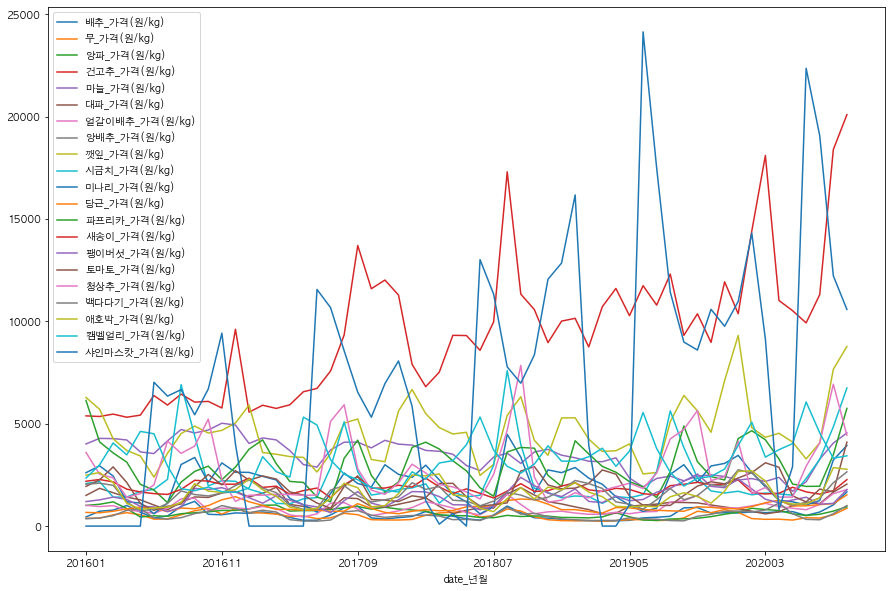

In [3]:
# 년월 데이터 전체 가격 꺽은선 그래프
pri_mon_year.plot(x="date_년월", y=['배추_가격(원/kg)', '무_가격(원/kg)', '양파_가격(원/kg)', '건고추_가격(원/kg)',
       '마늘_가격(원/kg)', '대파_가격(원/kg)', '얼갈이배추_가격(원/kg)', '양배추_가격(원/kg)',
       '깻잎_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)', '당근_가격(원/kg)',
       '파프리카_가격(원/kg)', '새송이_가격(원/kg)', '팽이버섯_가격(원/kg)', '토마토_가격(원/kg)',
       '청상추_가격(원/kg)', '백다다기_가격(원/kg)', '애호박_가격(원/kg)', '캠벨얼리_가격(원/kg)',
       '샤인마스캇_가격(원/kg)'] ,figsize=(15,10))

plt.show()

In [4]:
# 상관분석

train_cor=train.corr() 
train_cor.head(2)

pri_month_list_corr=pri_month_list.corr()

tra_month_list_corr=tra_month_list.corr()

Text(0.5, 1.0, '채소 가격 HeatMap')

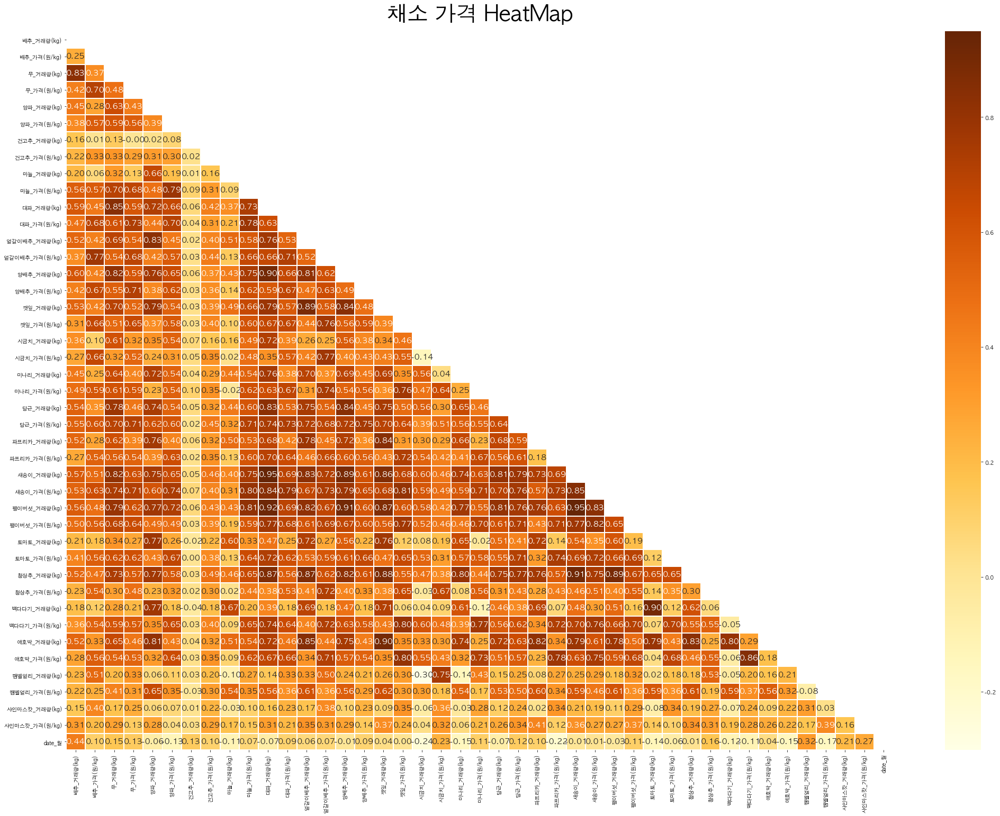

In [5]:
# 전체 히트맵 데이터
plt.figure(figsize=(35,25))


mask_s = np.triu(np.ones_like(train_cor, dtype = bool))

sns.heatmap(train_cor, annot=True, fmt=".2f", linewidths=1, mask=mask_s, cmap='YlOrBr', annot_kws={"size": 15}) # 모든 변수간의 관계가 모두 나옴. 그러나 아래 위로 대칭이기 때문에 모두 나올 필요없음.
plt.title('채소 가격 HeatMap', fontsize =40, pad = 20)

Text(0.5, 1.0, '채소 가격 HeatMap')

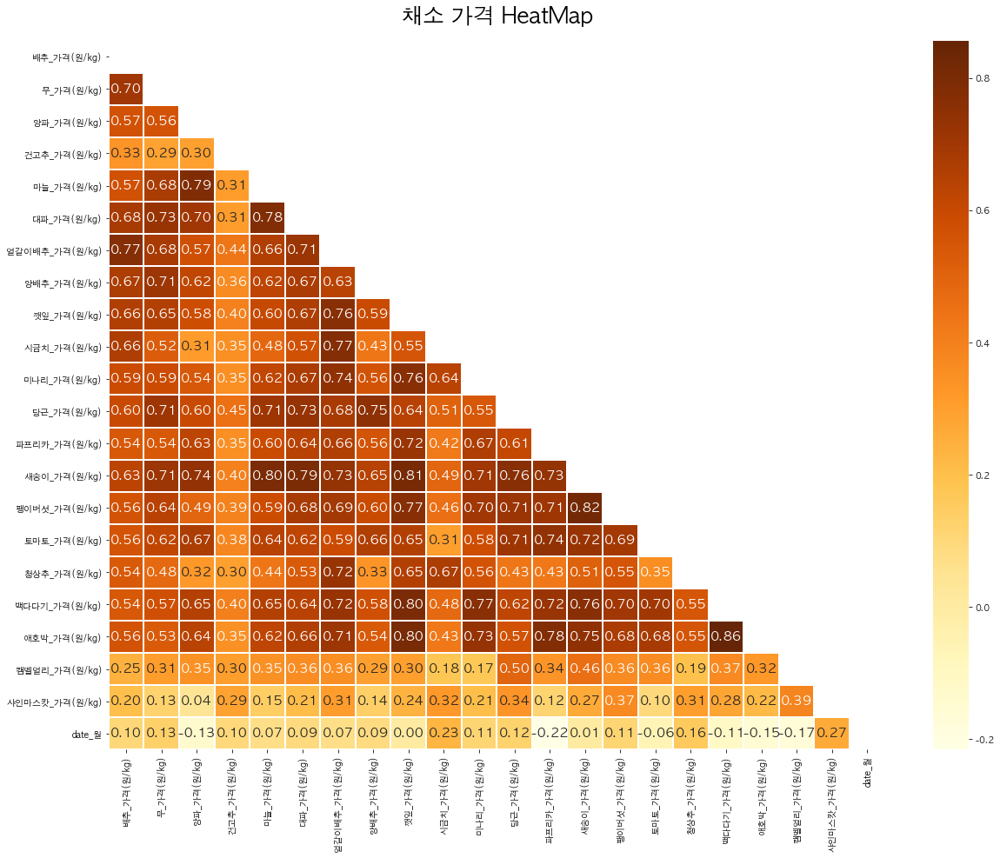

In [6]:
# 채소 가격 히트맵
plt.figure(figsize=(20,15))


mask_s = np.triu(np.ones_like(pri_month_list_corr, dtype = bool))

sns.heatmap(pri_month_list_corr, annot=True, fmt=".2f", linewidths=1, mask=mask_s, cmap='YlOrBr', annot_kws={"size": 15}) # 모든 변수간의 관계가 모두 나옴. 그러나 아래 위로 대칭이기 때문에 모두 나올 필요없음.
plt.title('채소 가격 HeatMap', fontsize =25, pad = 20)

Text(0.5, 1.0, '채소 거래량 HeatMap')

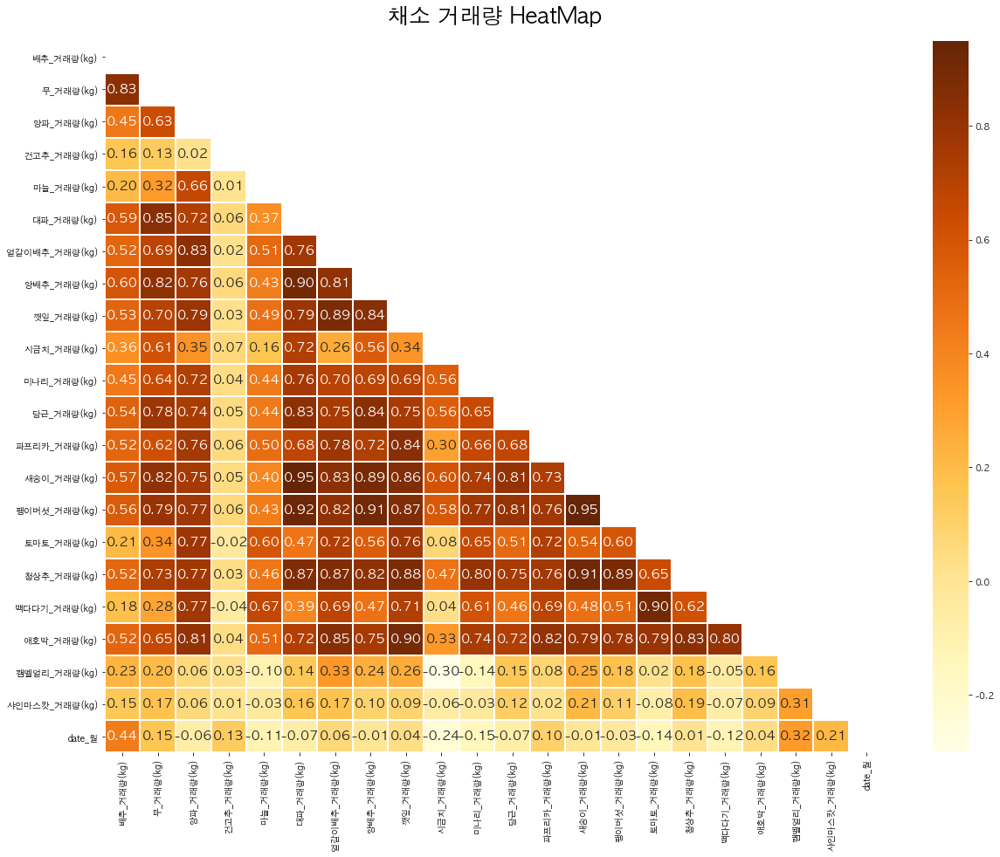

In [7]:
# 채소 거래량 히트맵
plt.figure(figsize=(20,15))


mask_s = np.triu(np.ones_like(tra_month_list_corr, dtype = bool))

sns.heatmap(tra_month_list_corr, annot=True, fmt=".2f", linewidths=1, mask=mask_s, cmap='YlOrBr', annot_kws={"size": 15}) # 모든 변수간의 관계가 모두 나옴. 그러나 아래 위로 대칭이기 때문에 모두 나올 필요없음.
plt.title('채소 거래량 HeatMap', fontsize =25, pad = 20)

In [8]:
# 박스플랏
tra_mon_year.columns

Index(['date_년', 'date_월', 'date_년월', '배추_거래량(kg)', '무_거래량(kg)', '양파_거래량(kg)',
       '건고추_거래량(kg)', '마늘_거래량(kg)', '대파_거래량(kg)', '얼갈이배추_거래량(kg)',
       '양배추_거래량(kg)', '깻잎_거래량(kg)', '시금치_거래량(kg)', '미나리_거래량(kg)', '당근_거래량(kg)',
       '파프리카_거래량(kg)', '새송이_거래량(kg)', '팽이버섯_거래량(kg)', '토마토_거래량(kg)',
       '청상추_거래량(kg)', '백다다기_거래량(kg)', '애호박_거래량(kg)', '캠벨얼리_거래량(kg)',
       '샤인마스캇_거래량(kg)'],
      dtype='object')

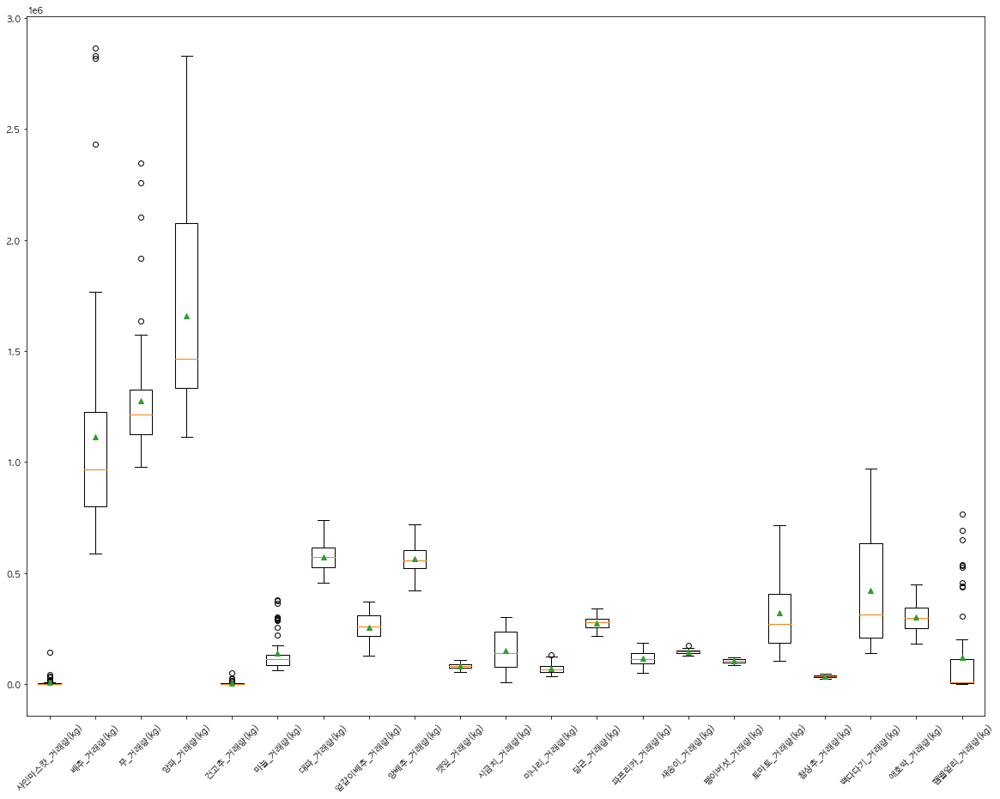

In [9]:
plt.figure(figsize=(20,15))
plt.boxplot([tra_mon_year.iloc[:,23],tra_mon_year.iloc[:,3],tra_mon_year.iloc[:,4],tra_mon_year.iloc[:,5],tra_mon_year.iloc[:,6],
            tra_mon_year.iloc[:,7],tra_mon_year.iloc[:,8],tra_mon_year.iloc[:,9],tra_mon_year.iloc[:,10],tra_mon_year.iloc[:,11],
            tra_mon_year.iloc[:,12],tra_mon_year.iloc[:,13],tra_mon_year.iloc[:,14],tra_mon_year.iloc[:,15],tra_mon_year.iloc[:,16],
            tra_mon_year.iloc[:,17],tra_mon_year.iloc[:,18],tra_mon_year.iloc[:,19],tra_mon_year.iloc[:,20],tra_mon_year.iloc[:,21],
            tra_mon_year.iloc[:,22]],labels=[ '샤인마스캇_거래량(kg)','배추_거래량(kg)', '무_거래량(kg)', '양파_거래량(kg)',
       '건고추_거래량(kg)', '마늘_거래량(kg)', '대파_거래량(kg)', '얼갈이배추_거래량(kg)',
       '양배추_거래량(kg)', '깻잎_거래량(kg)', '시금치_거래량(kg)', '미나리_거래량(kg)', '당근_거래량(kg)',
       '파프리카_거래량(kg)', '새송이_거래량(kg)', '팽이버섯_거래량(kg)', '토마토_거래량(kg)',
       '청상추_거래량(kg)', '백다다기_거래량(kg)', '애호박_거래량(kg)', '캠벨얼리_거래량(kg)'], showmeans=True)
plt.xticks(rotation=45)
plt.show()

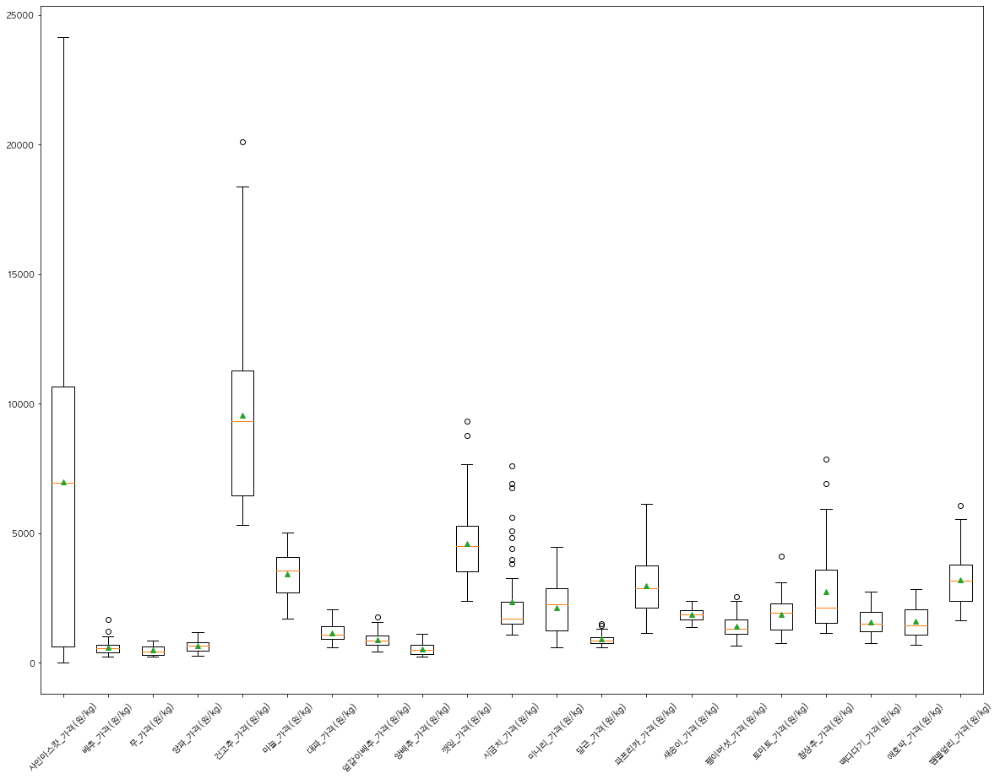

In [10]:
plt.figure(figsize=(20,15))
plt.boxplot([pri_mon_year.iloc[:,23],pri_mon_year.iloc[:,3],pri_mon_year.iloc[:,4],pri_mon_year.iloc[:,5],pri_mon_year.iloc[:,6],
            pri_mon_year.iloc[:,7],pri_mon_year.iloc[:,8],pri_mon_year.iloc[:,9],pri_mon_year.iloc[:,10],pri_mon_year.iloc[:,11],
            pri_mon_year.iloc[:,12],pri_mon_year.iloc[:,13],pri_mon_year.iloc[:,14],pri_mon_year.iloc[:,15],pri_mon_year.iloc[:,16],
            pri_mon_year.iloc[:,17],pri_mon_year.iloc[:,18],pri_mon_year.iloc[:,19],pri_mon_year.iloc[:,20],pri_mon_year.iloc[:,21],
            pri_mon_year.iloc[:,22]],labels=[ '샤인마스캇_가격(원/kg)','배추_가격(원/kg)', '무_가격(원/kg)', '양파_가격(원/kg)',
       '건고추_가격(원/kg)', '마늘_가격(원/kg)', '대파_가격(원/kg)', '얼갈이배추_가격(원/kg)',
       '양배추_가격(원/kg)', '깻잎_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)',
       '당근_가격(원/kg)', '파프리카_가격(원/kg)', '새송이_가격(원/kg)', '팽이버섯_가격(원/kg)',
       '토마토_가격(원/kg)', '청상추_가격(원/kg)', '백다다기_가격(원/kg)', '애호박_가격(원/kg)',
       '캠벨얼리_가격(원/kg)'], showmeans=True)
plt.xticks(rotation=45)
plt.show()

### 이상치 제거

In [11]:
train_nout=train.copy()

from collections import Counter


# 이상치 제거

def detect_outliers(df, n, features): 
    outlier_indices = [] 
    for col in features: 
        Q1 = np.percentile(df[col], 25) 
        Q3 = np.percentile(df[col], 75) 
        IQR = Q3 - Q1 
        outlier_step = 1.5 * IQR 
        outlier_list_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step)].index 
        outlier_indices.extend(outlier_list_col) 
    outlier_indices = Counter(outlier_indices) 
    multiple_outliers = list(k for k, v in outlier_indices.items() if v > n) 
    return multiple_outliers



Outliers_to_drop = detect_outliers(train_nout, 2, ['배추_거래량(kg)', '배추_가격(원/kg)', '무_거래량(kg)', '무_가격(원/kg)',
       '양파_거래량(kg)', '양파_가격(원/kg)', '건고추_거래량(kg)', '건고추_가격(원/kg)',
       '마늘_거래량(kg)', '마늘_가격(원/kg)', '대파_거래량(kg)', '대파_가격(원/kg)',
       '얼갈이배추_거래량(kg)', '얼갈이배추_가격(원/kg)', '양배추_거래량(kg)', '양배추_가격(원/kg)',
       '깻잎_거래량(kg)', '깻잎_가격(원/kg)', '시금치_거래량(kg)', '시금치_가격(원/kg)',
       '미나리_거래량(kg)', '미나리_가격(원/kg)', '당근_거래량(kg)', '당근_가격(원/kg)',
       '파프리카_거래량(kg)', '파프리카_가격(원/kg)', '새송이_거래량(kg)', '새송이_가격(원/kg)',
       '팽이버섯_거래량(kg)', '팽이버섯_가격(원/kg)', '토마토_거래량(kg)', '토마토_가격(원/kg)',
       '청상추_거래량(kg)', '청상추_가격(원/kg)', '백다다기_거래량(kg)', '백다다기_가격(원/kg)',
       '애호박_거래량(kg)', '애호박_가격(원/kg)', '캠벨얼리_거래량(kg)', '캠벨얼리_가격(원/kg)',
       '샤인마스캇_거래량(kg)', '샤인마스캇_가격(원/kg)'])


# 이상치를 확인
train_nout.loc[Outliers_to_drop]


train_nout_comp = train_nout.drop(Outliers_to_drop, axis = 0).reset_index(drop=True)


train_nout_comp.head(2)



pri_month_list_nout=pd.concat([train_nout_comp[pri_list],train_nout_comp["date_월"],train_nout_comp["date_년"],train_nout_comp["date_년월"]],axis=1)
pri_month_list_nout.head(2)

tra_month_list_nout=pd.concat([train_nout_comp[tra_list[0]],train_nout_comp["date_월"],train_nout_comp["date_년"],train_nout_comp["date_년월"]],axis=1)
tra_month_list_nout.head(2)

tra_mon_year_nout=tra_month_list_nout.groupby(["date_년","date_월","date_년월"]).mean().reset_index()
tra_mon_year_nout.head(2)

pri_mon_year_nout=pri_month_list_nout.groupby(["date_년","date_월","date_년월"]).mean().reset_index()

apc_nout=pri_month_list_nout.groupby(["date_년","date_월"]).mean()
apc.columns

Index(['배추_가격(원/kg)', '무_가격(원/kg)', '양파_가격(원/kg)', '건고추_가격(원/kg)',
       '마늘_가격(원/kg)', '대파_가격(원/kg)', '얼갈이배추_가격(원/kg)', '양배추_가격(원/kg)',
       '깻잎_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)', '당근_가격(원/kg)',
       '파프리카_가격(원/kg)', '새송이_가격(원/kg)', '팽이버섯_가격(원/kg)', '토마토_가격(원/kg)',
       '청상추_가격(원/kg)', '백다다기_가격(원/kg)', '애호박_가격(원/kg)', '캠벨얼리_가격(원/kg)',
       '샤인마스캇_가격(원/kg)'],
      dtype='object')

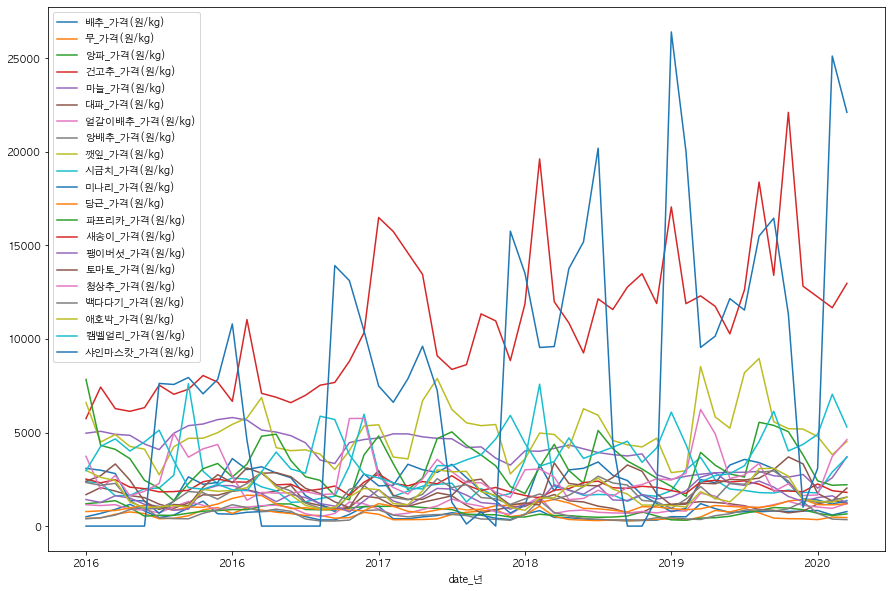

In [12]:
# 이상치 제거한 년별 꺽은선 데이터
pri_mon_year_nout.plot(x="date_년", y=['배추_가격(원/kg)', '무_가격(원/kg)', '양파_가격(원/kg)', '건고추_가격(원/kg)',
       '마늘_가격(원/kg)', '대파_가격(원/kg)', '얼갈이배추_가격(원/kg)', '양배추_가격(원/kg)',
       '깻잎_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)', '당근_가격(원/kg)',
       '파프리카_가격(원/kg)', '새송이_가격(원/kg)', '팽이버섯_가격(원/kg)', '토마토_가격(원/kg)',
       '청상추_가격(원/kg)', '백다다기_가격(원/kg)', '애호박_가격(원/kg)', '캠벨얼리_가격(원/kg)',
       '샤인마스캇_가격(원/kg)'] ,figsize=(15,10))
# plt.annotate("배추 최대가격",xy=(10,10),xytext=(20,100))
plt.show()

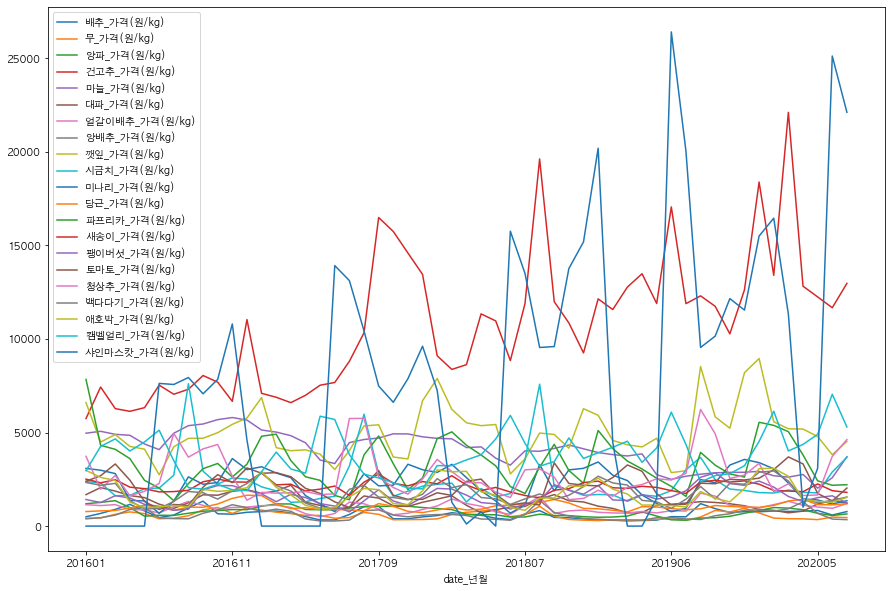

In [13]:
# 이상치 제거 년월 꺽은선 그래프
pri_mon_year_nout.plot(x="date_년월", y=['배추_가격(원/kg)', '무_가격(원/kg)', '양파_가격(원/kg)', '건고추_가격(원/kg)',
       '마늘_가격(원/kg)', '대파_가격(원/kg)', '얼갈이배추_가격(원/kg)', '양배추_가격(원/kg)',
       '깻잎_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)', '당근_가격(원/kg)',
       '파프리카_가격(원/kg)', '새송이_가격(원/kg)', '팽이버섯_가격(원/kg)', '토마토_가격(원/kg)',
       '청상추_가격(원/kg)', '백다다기_가격(원/kg)', '애호박_가격(원/kg)', '캠벨얼리_가격(원/kg)',
       '샤인마스캇_가격(원/kg)'] ,figsize=(15,10))
# plt.annotate("배추 최대가격",xy=(10,10),xytext=(20,100))
plt.show()

In [14]:
# 가장 변동성이 높은 품목을 추림

def cal_vix(low, high):
    vix=(high-(low+1))/(low+1)*100 # 0값이 있어 숫자를 1 더해줌
    return vix

cal_vix(pri_mon_year_nout['배추_가격(원/kg)'].min(),pri_mon_year_nout['배추_가격(원/kg)'].max())

inc_list={}
for i in range(3,23):
    inc_list[pri_mon_year_nout.columns[i]]=cal_vix(int(pri_mon_year_nout.iloc[:,i].min()),int(pri_mon_year_nout.iloc[:,i].max()))
    

inc_list
# 양배추, 시금치, 미나리, 파프리카, 새송이, 당근

{'배추_가격(원/kg)': 367.719298245614,
 '무_가격(원/kg)': 273.59154929577466,
 '양파_가격(원/kg)': 329.746835443038,
 '건고추_가격(원/kg)': 284.50704225352115,
 '마늘_가격(원/kg)': 186.09467455621302,
 '대파_가격(원/kg)': 207.475317348378,
 '얼갈이배추_가격(원/kg)': 249.70178926441352,
 '양배추_가격(원/kg)': 402.5735294117647,
 '깻잎_가격(원/kg)': 226.77854797519154,
 '시금치_가격(원/kg)': 499.2913385826772,
 '미나리_가격(원/kg)': 428.4040995607613,
 '당근_가격(원/kg)': 128.71012482662968,
 '파프리카_가격(원/kg)': 475.55066079295153,
 '새송이_가격(원/kg)': 87.35936465916612,
 '팽이버섯_가격(원/kg)': 272.3821989528796,
 '토마토_가격(원/kg)': 314.9270482603816,
 '청상추_가격(원/kg)': 349.3150684931507,
 '백다다기_가격(원/kg)': 221.72489082969432,
 '애호박_가격(원/kg)': 266.3107947805457,
 '캠벨얼리_가격(원/kg)': 272.21341785525624}

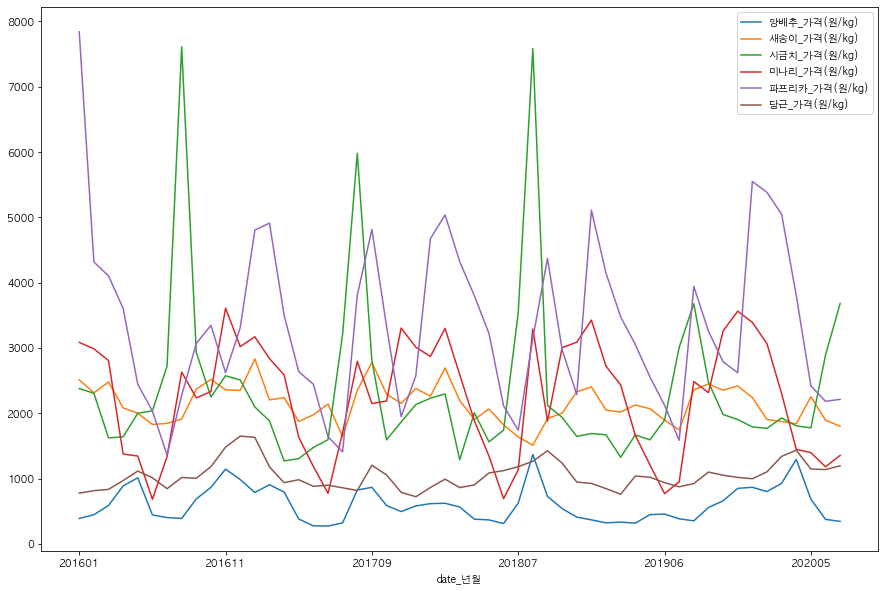

In [15]:
pri_mon_year_nout.plot(x="date_년월", y=[ '양배추_가격(원/kg)', '새송이_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)',
       '파프리카_가격(원/kg)', '당근_가격(원/kg)'] ,figsize=(15,10))
# plt.annotate("배추 최대가격",xy=(10,10),xytext=(20,100))
plt.show()

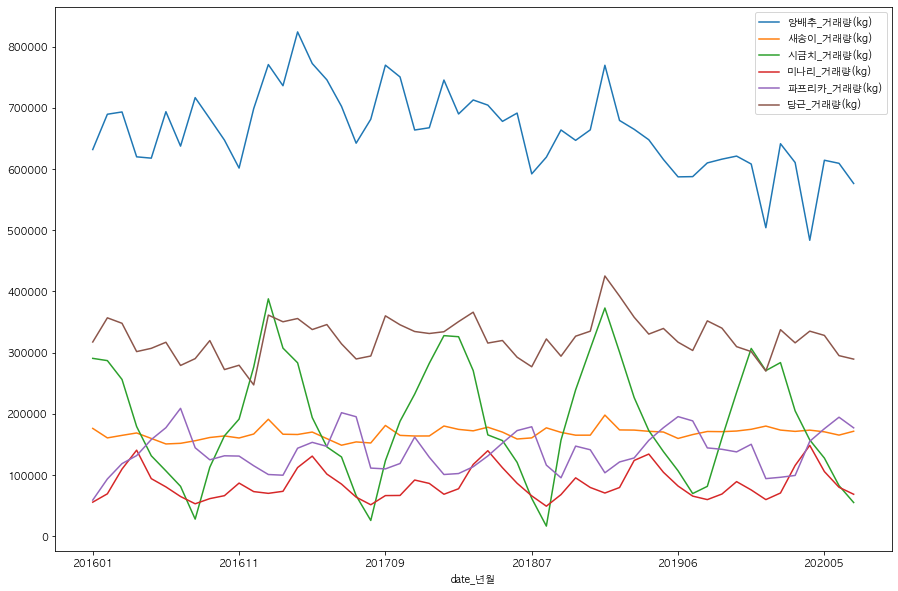

In [16]:
tra_mon_year_nout.plot(x="date_년월", y=[ '양배추_거래량(kg)', '새송이_거래량(kg)', '시금치_거래량(kg)', '미나리_거래량(kg)',
       '파프리카_거래량(kg)', '당근_거래량(kg)'] ,figsize=(15,10))
# plt.annotate("배추 최대가격",xy=(10,10),xytext=(20,100))
plt.show()

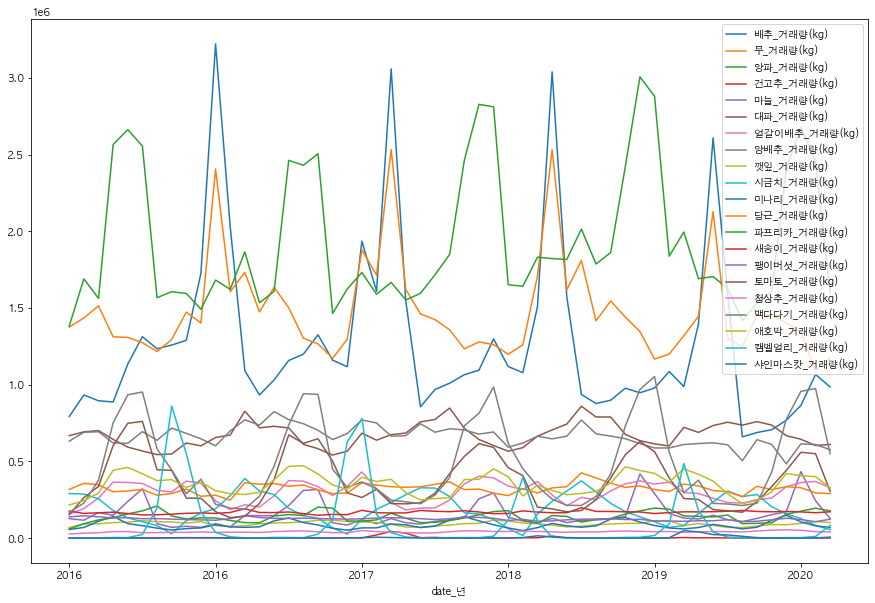

In [17]:
tra_mon_year_nout.plot(x="date_년", y=['배추_거래량(kg)', '무_거래량(kg)', '양파_거래량(kg)', '건고추_거래량(kg)', '마늘_거래량(kg)',
       '대파_거래량(kg)', '얼갈이배추_거래량(kg)', '양배추_거래량(kg)', '깻잎_거래량(kg)',
       '시금치_거래량(kg)', '미나리_거래량(kg)', '당근_거래량(kg)', '파프리카_거래량(kg)',
       '새송이_거래량(kg)', '팽이버섯_거래량(kg)', '토마토_거래량(kg)', '청상추_거래량(kg)',
       '백다다기_거래량(kg)', '애호박_거래량(kg)', '캠벨얼리_거래량(kg)', '샤인마스캇_거래량(kg)'] ,figsize=(15,10))

plt.show()

### 상관분석

In [18]:
train_cor_nout=train_nout_comp.corr() 
train_cor_nout

# 상관분석, 상관관계 높은 데이터 추출

pri_month_list_corr_nout=pri_month_list_nout.corr()

tra_month_list_corr_nout=tra_month_list_nout.corr()



s=pri_month_list_corr_nout.unstack()

df = pd.DataFrame(s[s < 1].sort_values(ascending=False), columns=['corr'])
df.style.background_gradient(cmap='viridis')

s=tra_month_list_corr_nout.unstack()

df = pd.DataFrame(s[s < 1].sort_values(ascending=False), columns=['corr'])
df.style.background_gradient(cmap='viridis')

Text(0.5, 1.0, '채소 가격 HeatMap')

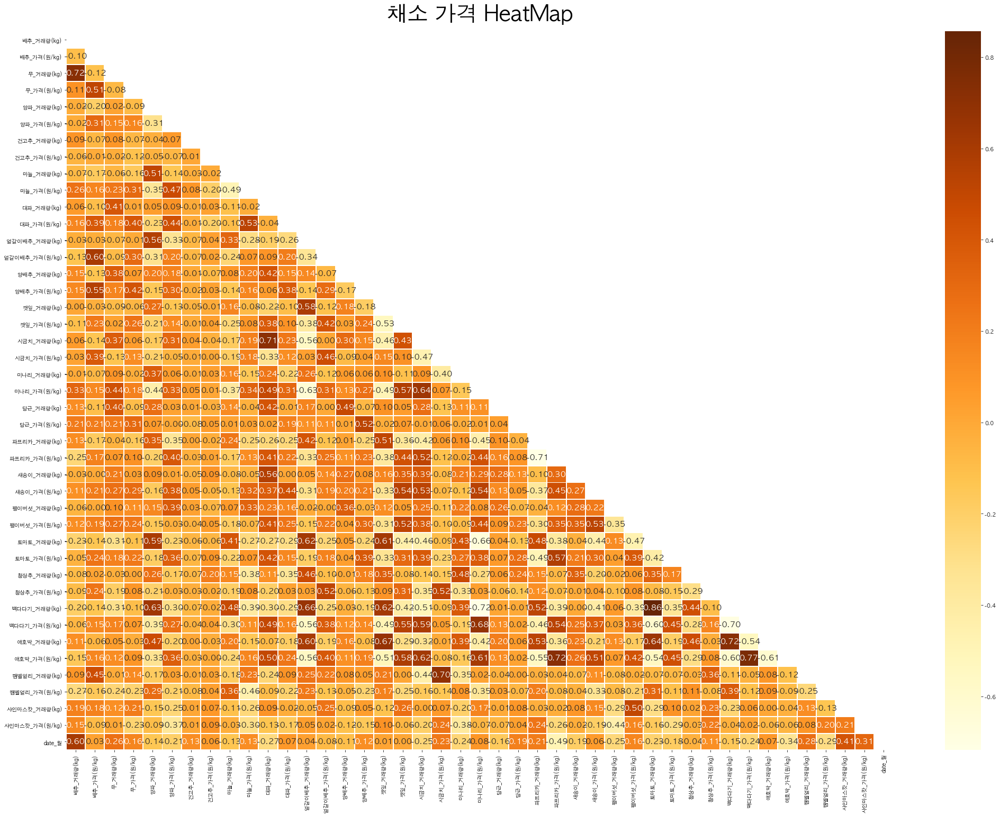

In [22]:
plt.figure(figsize=(35,25))


mask_s = np.triu(np.ones_like(train_cor_nout, dtype = bool))

sns.heatmap(train_cor_nout, annot=True, fmt=".2f", linewidths=1, mask=mask_s, cmap='YlOrBr', annot_kws={"size": 15}) # 모든 변수간의 관계가 모두 나옴. 그러나 아래 위로 대칭이기 때문에 모두 나올 필요없음.
plt.title('채소 가격 HeatMap', fontsize =40, pad = 20)

Text(0.5, 1.0, '채소 가격 HeatMap')

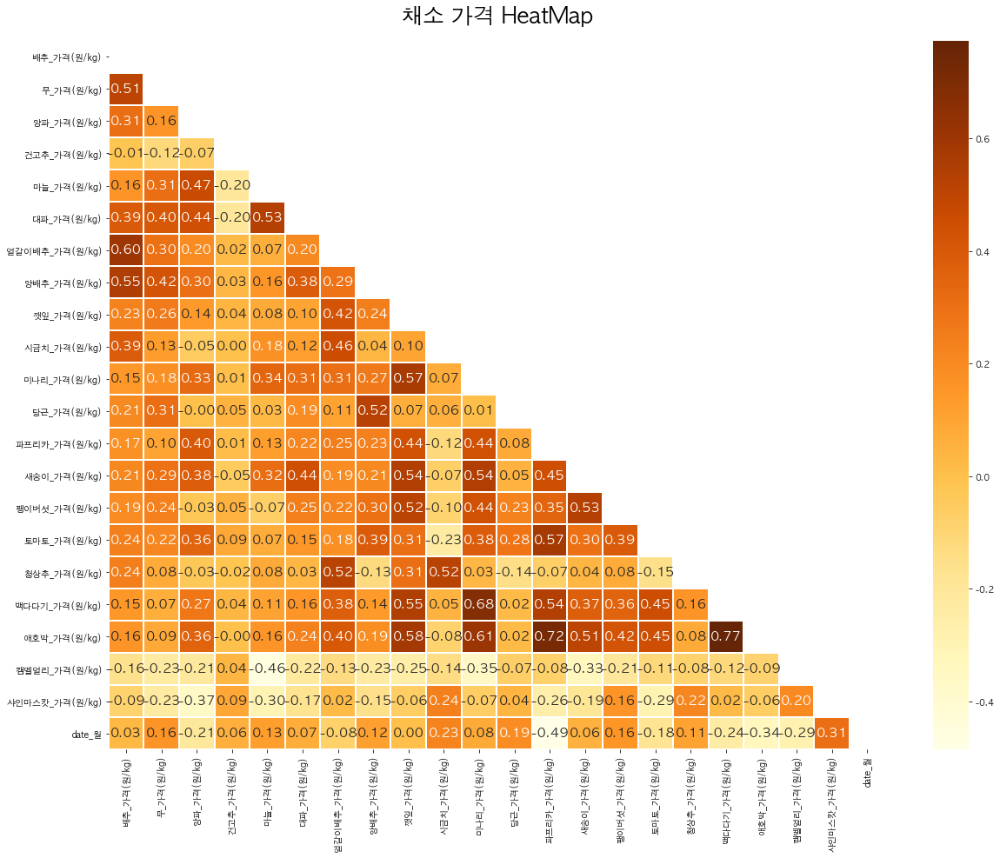

In [20]:
plt.figure(figsize=(20,15))


mask_s = np.triu(np.ones_like(pri_month_list_corr_nout, dtype = bool))

sns.heatmap(pri_month_list_corr_nout, annot=True, fmt=".2f", linewidths=1, mask=mask_s, cmap='YlOrBr', annot_kws={"size": 15}) # 모든 변수간의 관계가 모두 나옴. 그러나 아래 위로 대칭이기 때문에 모두 나올 필요없음.
plt.title('채소 가격 HeatMap', fontsize =25, pad = 20)

Text(0.5, 1.0, '채소 거래량 HeatMap')

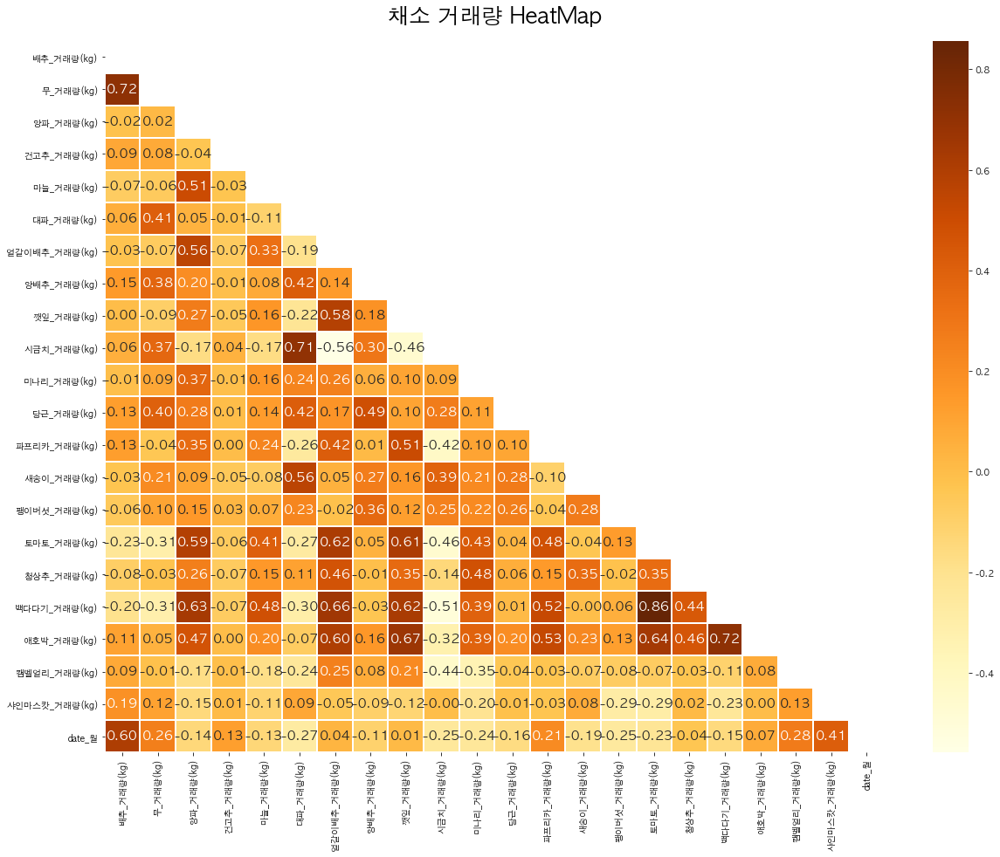

In [21]:
plt.figure(figsize=(20,15))


mask_s = np.triu(np.ones_like(tra_month_list_corr_nout, dtype = bool))

sns.heatmap(tra_month_list_corr_nout, annot=True, fmt=".2f", linewidths=1, mask=mask_s, cmap='YlOrBr', annot_kws={"size": 15}) # 모든 변수간의 관계가 모두 나옴. 그러나 아래 위로 대칭이기 때문에 모두 나올 필요없음.
plt.title('채소 거래량 HeatMap', fontsize =25, pad = 20)

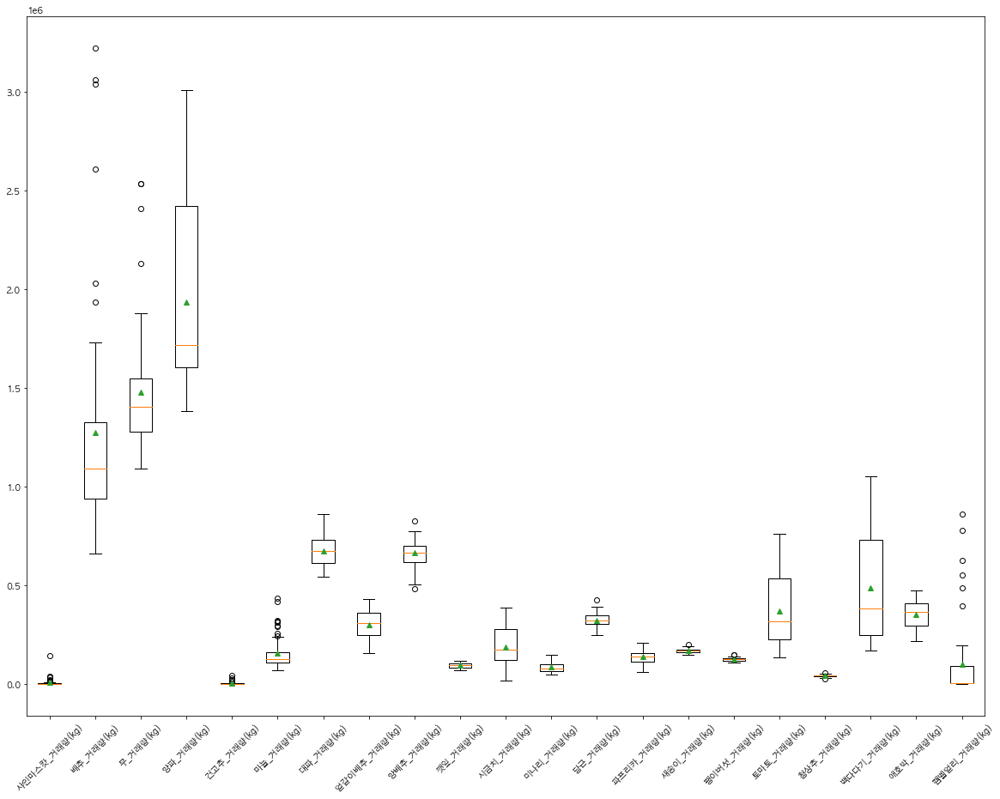

In [23]:
# 박스플랏
plt.figure(figsize=(20,15))
plt.boxplot([tra_mon_year.iloc[:,23],tra_mon_year_nout.iloc[:,3],tra_mon_year_nout.iloc[:,4],tra_mon_year_nout.iloc[:,5],tra_mon_year_nout.iloc[:,6],
            tra_mon_year_nout.iloc[:,7],tra_mon_year_nout.iloc[:,8],tra_mon_year_nout.iloc[:,9],tra_mon_year_nout.iloc[:,10],tra_mon_year_nout.iloc[:,11],
            tra_mon_year_nout.iloc[:,12],tra_mon_year_nout.iloc[:,13],tra_mon_year_nout.iloc[:,14],tra_mon_year_nout.iloc[:,15],tra_mon_year_nout.iloc[:,16],
            tra_mon_year_nout.iloc[:,17],tra_mon_year_nout.iloc[:,18],tra_mon_year_nout.iloc[:,19],tra_mon_year_nout.iloc[:,20],tra_mon_year_nout.iloc[:,21],
            tra_mon_year_nout.iloc[:,22]],labels=[ '샤인마스캇_거래량(kg)','배추_거래량(kg)', '무_거래량(kg)', '양파_거래량(kg)',
       '건고추_거래량(kg)', '마늘_거래량(kg)', '대파_거래량(kg)', '얼갈이배추_거래량(kg)',
       '양배추_거래량(kg)', '깻잎_거래량(kg)', '시금치_거래량(kg)', '미나리_거래량(kg)', '당근_거래량(kg)',
       '파프리카_거래량(kg)', '새송이_거래량(kg)', '팽이버섯_거래량(kg)', '토마토_거래량(kg)',
       '청상추_거래량(kg)', '백다다기_거래량(kg)', '애호박_거래량(kg)', '캠벨얼리_거래량(kg)'], showmeans=True)
plt.xticks(rotation=45)
plt.show()

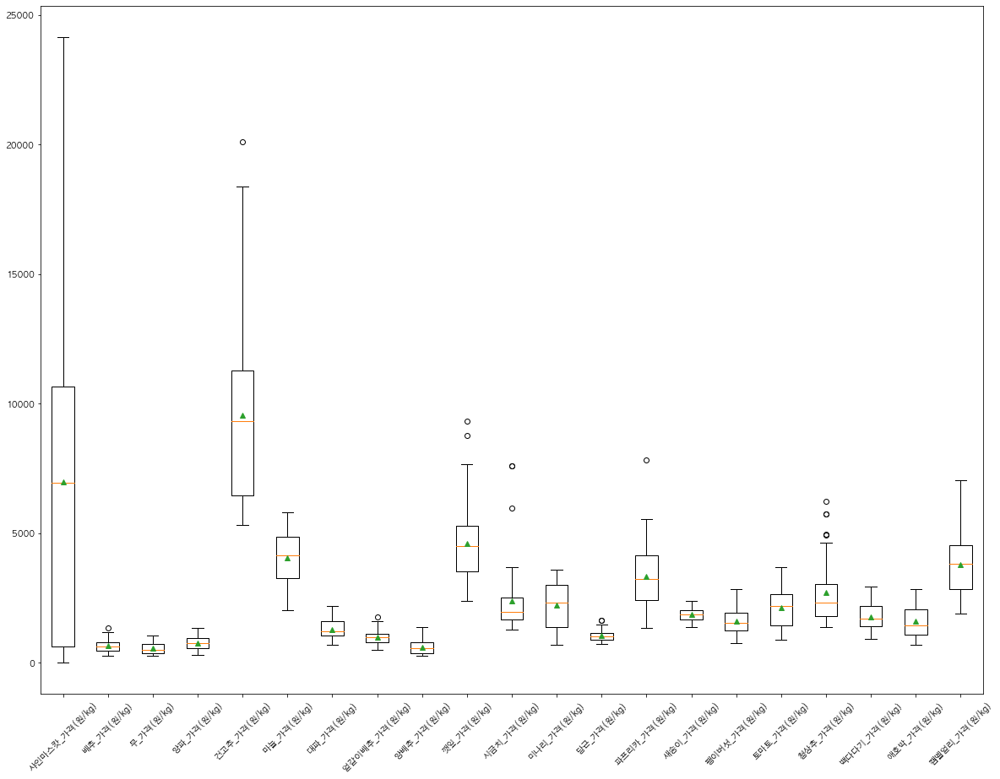

In [24]:
plt.figure(figsize=(20,15))
plt.boxplot([pri_mon_year.iloc[:,23],pri_mon_year_nout.iloc[:,3],pri_mon_year_nout.iloc[:,4],pri_mon_year_nout.iloc[:,5],pri_mon_year.iloc[:,6],
            pri_mon_year_nout.iloc[:,7],pri_mon_year_nout.iloc[:,8],pri_mon_year_nout.iloc[:,9],pri_mon_year_nout.iloc[:,10],pri_mon_year.iloc[:,11],
            pri_mon_year_nout.iloc[:,12],pri_mon_year_nout.iloc[:,13],pri_mon_year_nout.iloc[:,14],pri_mon_year_nout.iloc[:,15],pri_mon_year.iloc[:,16],
            pri_mon_year_nout.iloc[:,17],pri_mon_year_nout.iloc[:,18],pri_mon_year_nout.iloc[:,19],pri_mon_year_nout.iloc[:,20],pri_mon_year.iloc[:,21],
            pri_mon_year_nout.iloc[:,22]],labels=[ '샤인마스캇_가격(원/kg)','배추_가격(원/kg)', '무_가격(원/kg)', '양파_가격(원/kg)',
       '건고추_가격(원/kg)', '마늘_가격(원/kg)', '대파_가격(원/kg)', '얼갈이배추_가격(원/kg)',
       '양배추_가격(원/kg)', '깻잎_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)',
       '당근_가격(원/kg)', '파프리카_가격(원/kg)', '새송이_가격(원/kg)', '팽이버섯_가격(원/kg)',
       '토마토_가격(원/kg)', '청상추_가격(원/kg)', '백다다기_가격(원/kg)', '애호박_가격(원/kg)',
       '캠벨얼리_가격(원/kg)'], showmeans=True)
plt.xticks(rotation=45)
plt.show()

In [25]:
tra_mon_year_nout.head(2)

,date_년,date_월,date_년월,배추_거래량(kg),무_거래량(kg),양파_거래량(kg),건고추_거래량(kg),마늘_거래량(kg),대파_거래량(kg),얼갈이배추_거래량(kg),...,당근_거래량(kg),파프리카_거래량(kg),새송이_거래량(kg),팽이버섯_거래량(kg),토마토_거래량(kg),청상추_거래량(kg),백다다기_거래량(kg),애호박_거래량(kg),캠벨얼리_거래량(kg),샤인마스캇_거래량(kg)
0,2016,1,201601,792327.015000,1376010.43,1.382490e+06,1198.920000,126870.060000,667476.265,156221.025000,...,317453.730000,59176.605,176285.095000,138428.040000,152403.55,26827.065000,167379.31,216396.490000,2342.050000,0.0
1,2016,2,201602,932983.233333,1434456.16,1.689355e+06,1405.626667,116430.426667,692544.920,192579.086667,...,356951.733333,93656.380,160767.526667,145466.086667,263805.96,31912.293333,228270.84,244047.586667,1840.053333,0.0


In [27]:
# plotly 애니메이션으로 년도별 가격 변동 모습 

import plotly.express as px
import plotly.graph_objs as go

pri_mon_year_nout.T.head(2)

In [ ]:
fig = px.bar(pri_mon_year_nout, x="date_년", y="배추_가격(원/kg)")
fig.show()

In [ ]:
fig = px.line(pri_mon_year_nout, x="date_년월", y=["배추_가격(원/kg)"])
fig.show()

In [ ]:
fig = px.line(pri_mon_year_nout, x="date_년월", y=[ '양배추_가격(원/kg)', '새송이_가격(원/kg)', '시금치_가격(원/kg)', '미나리_가격(원/kg)',
       '파프리카_가격(원/kg)', '당근_가격(원/kg)'] )
fig.show()

In [ ]:
fig = px.line(tra_mon_year_nout, x="date_년월", y=[ '양배추_거래량(kg)', '새송이_거래량(kg)', '시금치_거래량(kg)', '미나리_거래량(kg)',
       '파프리카_거래량(kg)', '당근_거래량(kg)']  )
fig.show()

In [ ]:
fig=px.bar(pri_mon_year_nout, x="date_월", y=['배추_가격(원/kg)'], animation_frame="date_년", animation_group="date_월")
fig.update_layout(transition = {'duration': 10000})
fig.show()

In [ ]:
import plotly.graph_objects as go
fig = go.Figure(
   data=[go.Bar(y=pri_mon_year_nout["배추_가격(원/kg)"], x=pri_mon_year_nout["date_년월"])],
   layout_title_text="채소 가격")
# fig.update_layout( legend=dict(
#         x=0,
#         y=1.0,
#         bgcolor='rgba(155, 155, 155, 0)',
#         bordercolor='rgba(155, 155, 155, 0)'
#     ))

fig.show()

# 여기에 날씨랑 해서 같이 넣어도 괜찮을듯 싶음.

# 4. 모델링

## 4.1 SVM

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

# 경고 끄기
pd.set_option('mode.chained_assignment', None)
warnings.filterwarnings(action='ignore')

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

# 데이터 불러오기
df = pd.read_csv('train.csv')

# 불필요한 열 제거
df.drop(['date'], axis=1, inplace=True)

df

,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),마늘_거래량(kg),...,청상추_거래량(kg),청상추_가격(원/kg),백다다기_거래량(kg),백다다기_가격(원/kg),애호박_거래량(kg),애호박_가격(원/kg),캠벨얼리_거래량(kg),캠벨얼리_가격(원/kg),샤인마스캇_거래량(kg),샤인마스캇_가격(원/kg)
0,금요일,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,토요일,80860.0,329.0,80272.0,360.0,122787.5,1281.0,3.0,11000.0,15019.0,...,5125.0,9235.0,434.0,2109.0,19159.0,2414.0,880.0,2014.0,0.0,0.0
2,일요일,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,월요일,1422742.5,478.0,1699653.7,382.0,2315079.0,1235.0,699.0,4464.0,141638.0,...,38525.5,7631.0,500702.0,2046.0,620539.0,2018.0,2703.8,3885.0,0.0,0.0
4,화요일,1167241.0,442.0,1423482.3,422.0,2092960.1,1213.0,1112.6,4342.0,126207.8,...,32615.0,6926.0,147638.0,2268.0,231958.0,2178.0,8810.0,2853.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1728,목요일,1856965.0,1839.0,2055640.0,990.0,2281429.2,990.0,2818.4,19101.0,134359.9,...,50730.0,4509.0,282212.3,3001.0,313139.7,3426.0,504242.6,3620.0,283196.9,10940.0
1729,금요일,1880095.5,1789.0,1879261.0,1011.0,2074513.0,955.0,1887.1,23095.0,126926.0,...,54322.0,4178.0,312214.8,2999.0,362741.0,3357.0,479683.1,3618.0,303779.6,10844.0
1730,토요일,1661090.9,1760.0,1709385.7,1075.0,2089081.2,961.0,959.0,22510.0,110357.7,...,61213.0,3770.0,327395.8,3065.0,390361.2,3092.0,521493.8,3691.0,313295.7,10636.0
1731,일요일,25396.0,3066.0,38222.0,1139.0,18240.0,1056.0,60.0,22333.0,620.0,...,144.0,4076.0,285.0,3707.0,2464.0,3252.0,21717.0,3567.0,9734.0,10699.0


### 데이터 전처리

In [29]:
# 요일 범주형 -> 라벨인코딩 처리
le = LabelEncoder()
le.fit(df.iloc[:, 0])
df['요일']=le.transform(df.iloc[:, 0])

df

,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),마늘_거래량(kg),...,청상추_거래량(kg),청상추_가격(원/kg),백다다기_거래량(kg),백다다기_가격(원/kg),애호박_거래량(kg),애호박_가격(원/kg),캠벨얼리_거래량(kg),캠벨얼리_가격(원/kg),샤인마스캇_거래량(kg),샤인마스캇_가격(원/kg)
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5,80860.0,329.0,80272.0,360.0,122787.5,1281.0,3.0,11000.0,15019.0,...,5125.0,9235.0,434.0,2109.0,19159.0,2414.0,880.0,2014.0,0.0,0.0
2,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,1422742.5,478.0,1699653.7,382.0,2315079.0,1235.0,699.0,4464.0,141638.0,...,38525.5,7631.0,500702.0,2046.0,620539.0,2018.0,2703.8,3885.0,0.0,0.0
4,6,1167241.0,442.0,1423482.3,422.0,2092960.1,1213.0,1112.6,4342.0,126207.8,...,32615.0,6926.0,147638.0,2268.0,231958.0,2178.0,8810.0,2853.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1728,1,1856965.0,1839.0,2055640.0,990.0,2281429.2,990.0,2818.4,19101.0,134359.9,...,50730.0,4509.0,282212.3,3001.0,313139.7,3426.0,504242.6,3620.0,283196.9,10940.0
1729,0,1880095.5,1789.0,1879261.0,1011.0,2074513.0,955.0,1887.1,23095.0,126926.0,...,54322.0,4178.0,312214.8,2999.0,362741.0,3357.0,479683.1,3618.0,303779.6,10844.0
1730,5,1661090.9,1760.0,1709385.7,1075.0,2089081.2,961.0,959.0,22510.0,110357.7,...,61213.0,3770.0,327395.8,3065.0,390361.2,3092.0,521493.8,3691.0,313295.7,10636.0
1731,4,25396.0,3066.0,38222.0,1139.0,18240.0,1056.0,60.0,22333.0,620.0,...,144.0,4076.0,285.0,3707.0,2464.0,3252.0,21717.0,3567.0,9734.0,10699.0


In [30]:
# 데이터 MinMaxScaler정규화 
minmax = MinMaxScaler()
minmax.fit(df.iloc[:, :])
df.iloc[:, :]=minmax.transform(df.iloc[:, :])

df

,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),마늘_거래량(kg),...,청상추_거래량(kg),청상추_가격(원/kg),백다다기_거래량(kg),백다다기_가격(원/kg),애호박_거래량(kg),애호박_가격(원/kg),캠벨얼리_거래량(kg),캠벨얼리_가격(원/kg),샤인마스캇_거래량(kg),샤인마스캇_가격(원/kg)
0,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
1,0.833333,0.015520,0.0658,0.020797,0.264706,0.024437,0.6405,0.000007,0.064389,0.013751,...,0.060900,0.511068,0.000197,0.398376,0.023032,0.356152,0.000590,0.08056,0.000000,0.000000
2,0.666667,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
3,0.500000,0.273068,0.0956,0.440354,0.280882,0.460735,0.6175,0.001690,0.026130,0.129684,...,0.457792,0.422302,0.227365,0.386475,0.745976,0.297728,0.001814,0.15540,0.000000,0.000000
4,1.000000,0.224029,0.0884,0.368802,0.310294,0.416530,0.6065,0.002690,0.025416,0.115556,...,0.387559,0.383287,0.067041,0.428410,0.278846,0.321334,0.005911,0.11412,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1728,0.166667,0.356409,0.3678,0.532584,0.727941,0.454038,0.4950,0.006813,0.111809,0.123020,...,0.602816,0.249530,0.128151,0.566868,0.376438,0.505459,0.338341,0.14480,0.740842,0.273500
1729,0.000000,0.360848,0.3578,0.486887,0.743382,0.412859,0.4775,0.004562,0.135188,0.116213,...,0.645499,0.231212,0.141775,0.566490,0.436066,0.495279,0.321862,0.14472,0.794687,0.271100
1730,0.833333,0.318814,0.3520,0.442875,0.790441,0.415758,0.4805,0.002318,0.131764,0.101044,...,0.727384,0.208633,0.148668,0.578957,0.469269,0.456182,0.349917,0.14764,0.819581,0.265900
1731,0.666667,0.004874,0.6132,0.009903,0.837500,0.003630,0.5280,0.000145,0.130728,0.000568,...,0.001711,0.225567,0.000129,0.700227,0.002962,0.479788,0.014572,0.14268,0.025464,0.267475


In [31]:
# date 를 제외한 컬럼 (날짜 빼고 다)
# (['요일','배추_거래량(kg)', ~ , '샤인마스캇_가격(원/kg)'])
input_col_list = df.iloc[:, :].columns

# 21가지 '가격(원/kg)' 컬럼만 추출 (가격만 컬럼만 다 뽑음)
# (['배추_가격(원/kg)', '무_가격(원/kg)', ~ , '캠벨얼리_가격(원/kg)', '샤인마스캇_가격(원/kg)'])
label_col_list = df.iloc[:, 2::2].columns


window_size = 14 # 인코더 시퀀스 길이
label_len = len(label_col_list) #21
features_len = len(input_col_list) #43

### 데이터 세트 분할

In [32]:
# 데이터 세트 분할 
# 훈련, 검증, 테스트 데이터 세트 (80, 10, 10) 
n = len(df) #1733
train_df = df[0:int(n*0.8)] #(1386, 44)
val_df = df[int(n*0.8):int(n*0.9)] #(173, 44)
test_df = df[int(n*0.9):] #(174, 44)
num_features = df.shape[1] #44

# x_train / y_train
# 입력값과 출력값으로 분리
train_X, train_y = train_df.iloc[:, :features_len*window_size], train_df.loc[:,label_col_list[1]]
val_X, val_y = val_df.iloc[:, :features_len*window_size], val_df.loc[:,label_col_list[1]]
test_X, test_y = test_df.iloc[:, :features_len*window_size], test_df.loc[:,label_col_list[1]]

### 모델

In [33]:
from sklearn.svm import SVR, SVC 
import sklearn.metrics as mt
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

In [34]:
# 모델
svm_clf=SVR(kernel='linear')

# 하이퍼 파라미터 튜닝(그리드 서치)
def svm_param_selection(x, y, nfolds):
    svm_parameters=[{'kernel':['rbf'],
                     'gamma':[0.00001, 0.0001, 0.001, 0.01, 0.1, 1],
                     'C':[0.001,0.01,1,10,100,1000] }]
    
    clf = GridSearchCV(svm_clf, svm_parameters, cv=nfolds)
    clf.fit(x, y)
    print(clf.best_params_)
    
    return clf.best_params_ # 모델 리턴

In [35]:
# best_params_을 이용하여 최적의 파라미터 확인
best_params_ = svm_param_selection(train_X, train_y.values.ravel(), 10)

{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}


In [36]:
# 최적의 파라미터로 학습
clf = SVR(C= 1000, gamma= 0.001)
clf.fit(train_X, train_y.values.ravel())

SVR(C=1000, gamma=0.001)

### 추론 및 평가

In [37]:
# 추론
svm_pred=clf.predict(test_X)

# 평가(MAE)
socre = mean_absolute_error(test_y, svm_pred)
print('MAE: ', socre)

MAE:  0.05859121666150401


In [38]:
# 평가(r2_score)
score = r2_score(test_y, svm_pred)
#r2_score(train_X, train_y)
#score = clf.score(train_X, train_y)
print('R-squared: ', score)

R-squared:  0.8990260812321076


### 예측 데이터 시각화(실제 VS 예측)

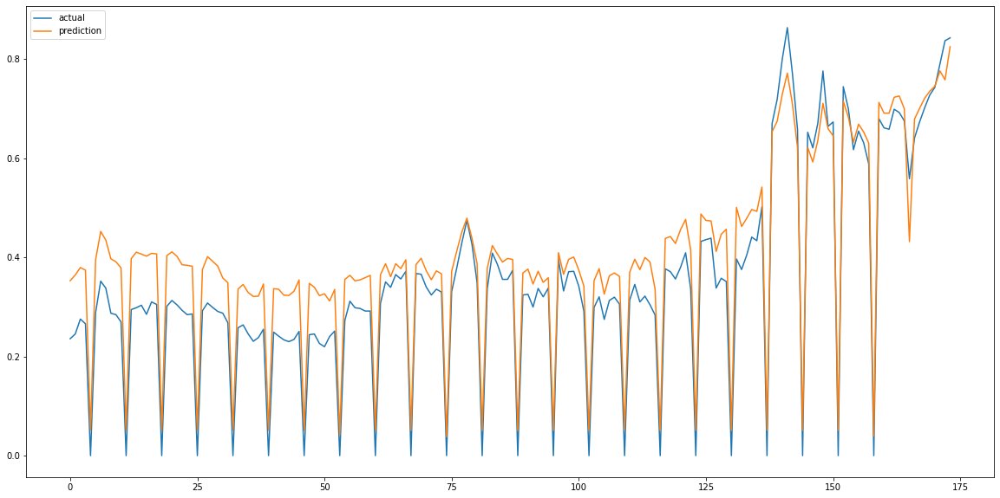

In [39]:
# 예측 데이터 시각화 + 정확도
plt.figure(figsize=(20, 10))

plt.plot(np.array(test_y), label='actual')
plt.plot(svm_pred, label='prediction')
plt.legend()
plt.show()

In [ ]:
# 전체 데이터 예측 시각화 + 정확도

배추_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.04266366073220018
R-squared:  0.7162433034628315


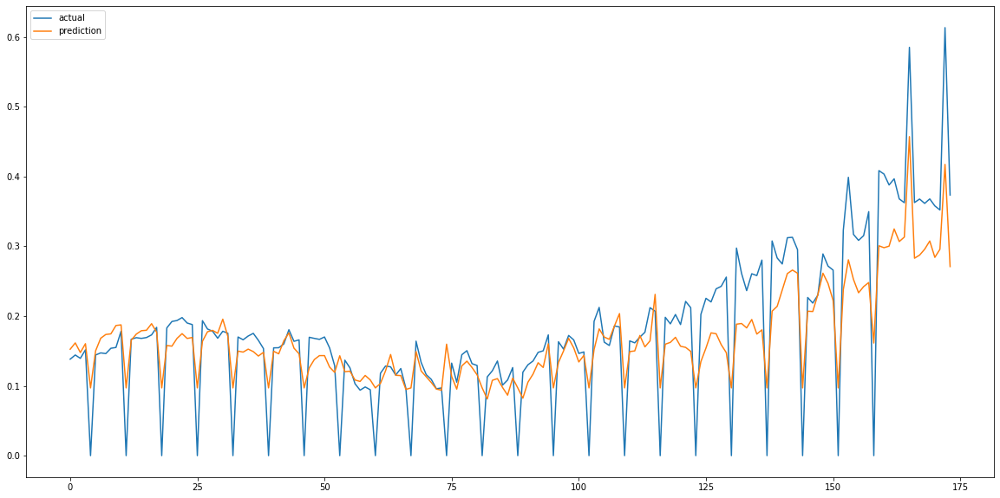

무_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.05859121666150401
R-squared:  0.8990260812321076


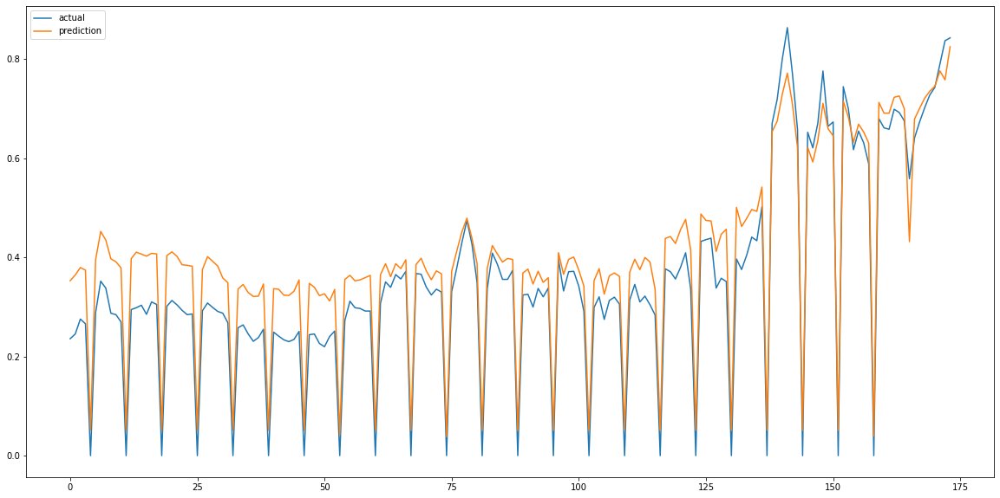

양파_가격(원/kg) 예측 모델 
{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.029842270158003472
R-squared:  0.9173403936082376


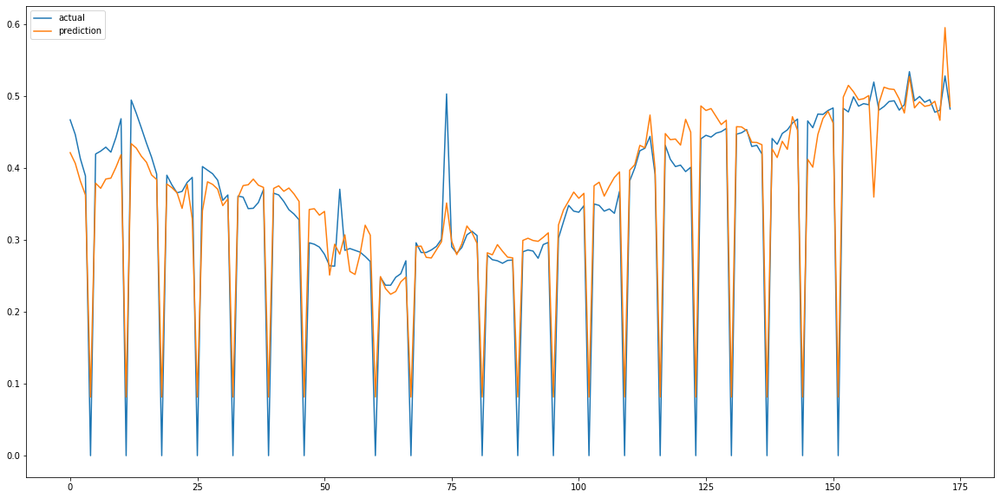

건고추_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.026355166697151582
R-squared:  0.5274899455544221


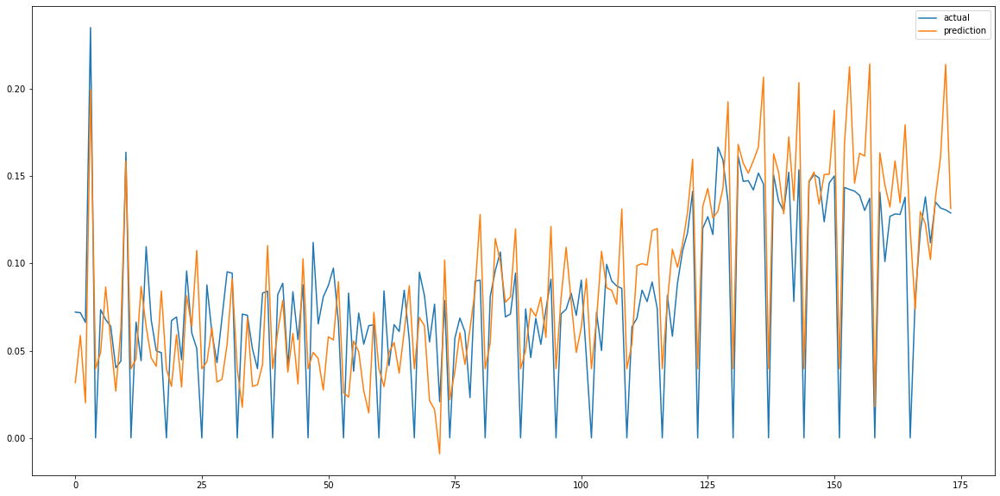

마늘_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.05934453711356769
R-squared:  0.924848615034876


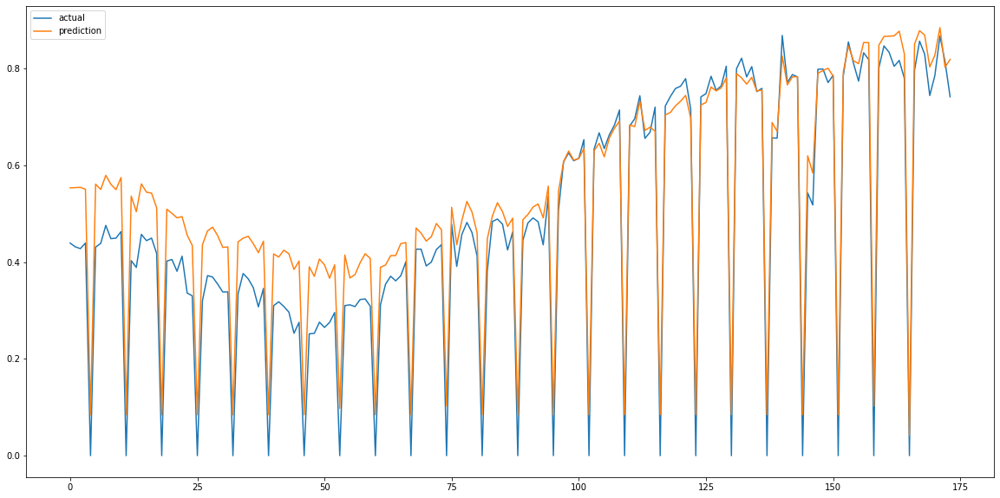

대파_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.03789263783695803
R-squared:  0.9492584970252165


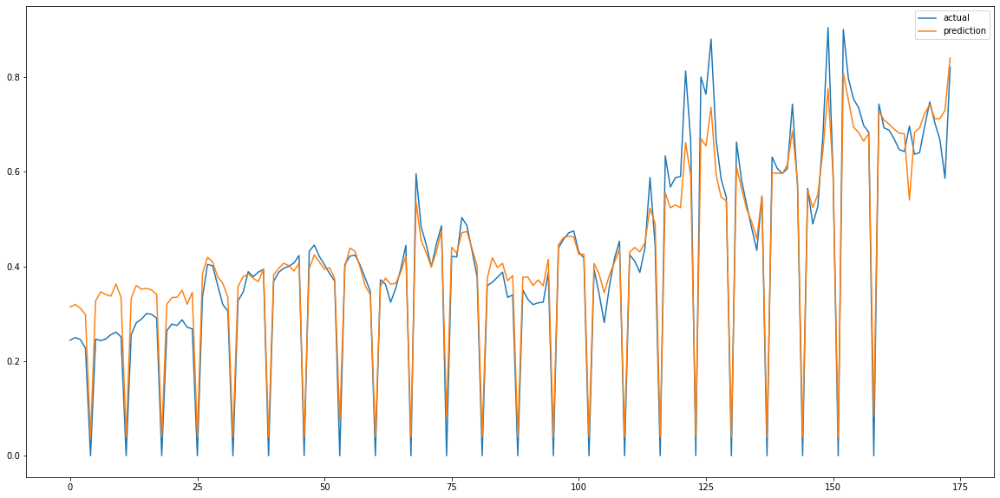

얼갈이배추_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}
MAE:  0.03737066112670943
R-squared:  0.9570599391152161


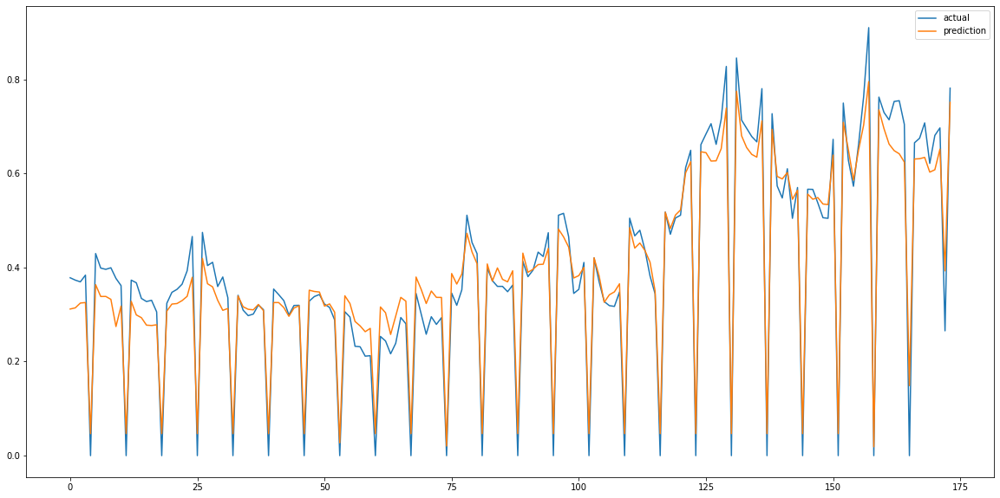

양배추_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.0616304203963525
R-squared:  0.9224531429301186


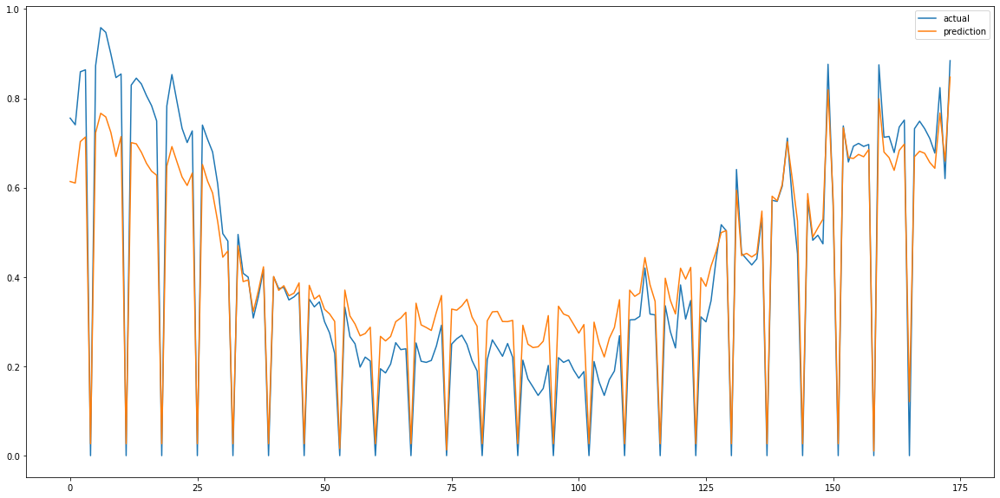

깻잎_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.05534825855838666
R-squared:  0.9084041449485942


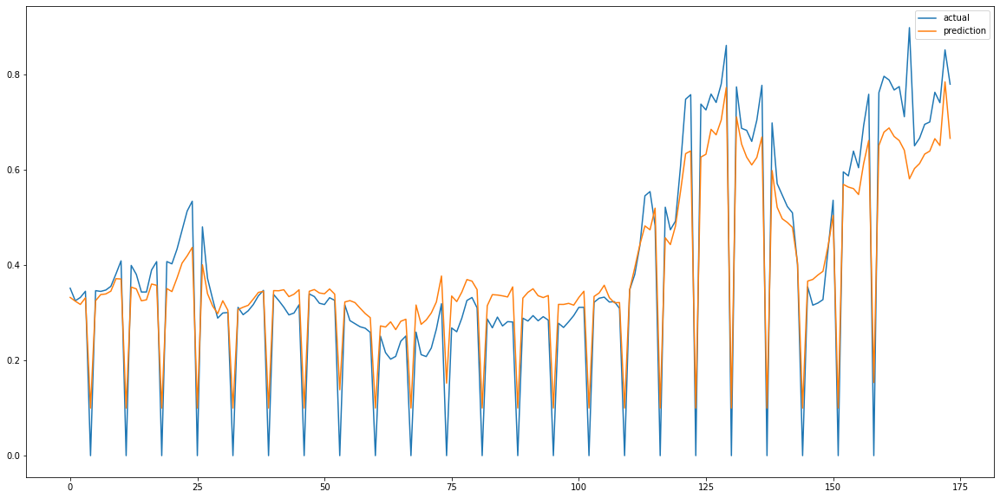

시금치_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.038401771868946624
R-squared:  0.9136216429408868


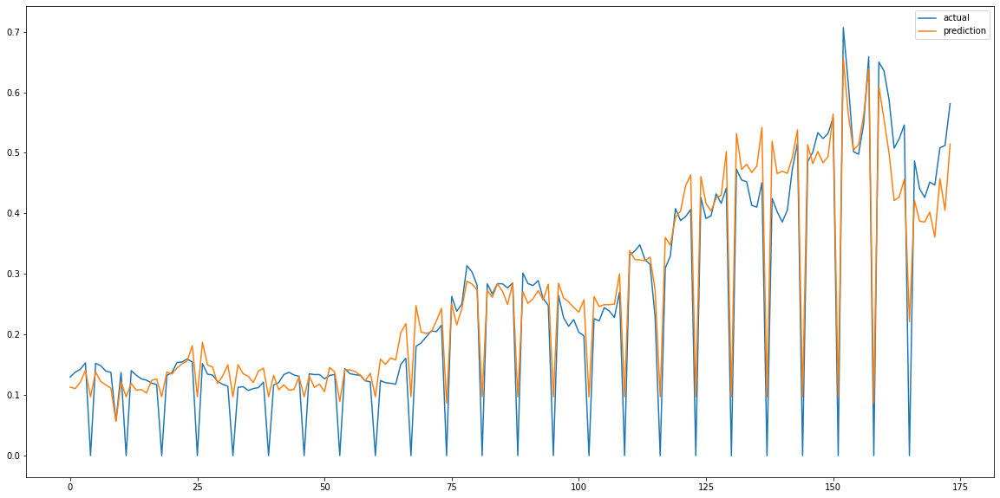

미나리_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}
MAE:  0.05322669100980126
R-squared:  0.9023018375985544


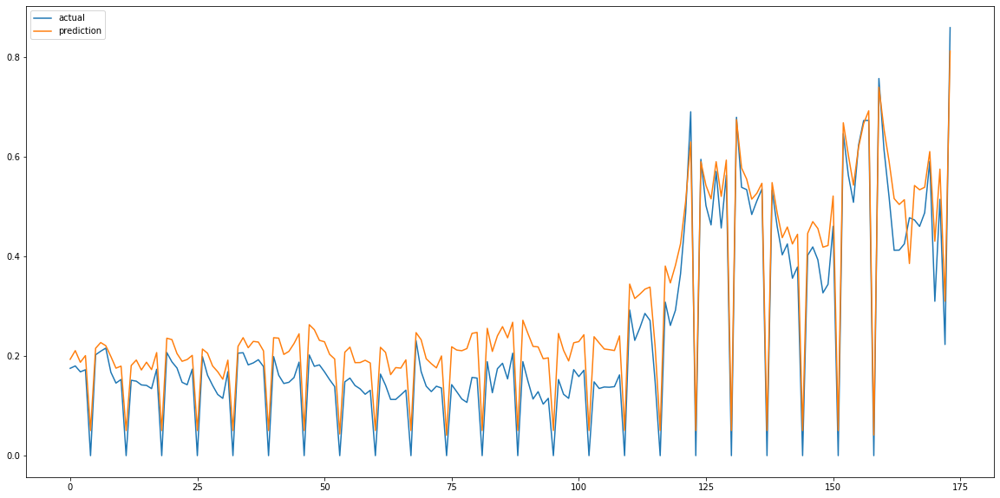

당근_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.032411915563570724
R-squared:  0.8551935668543085


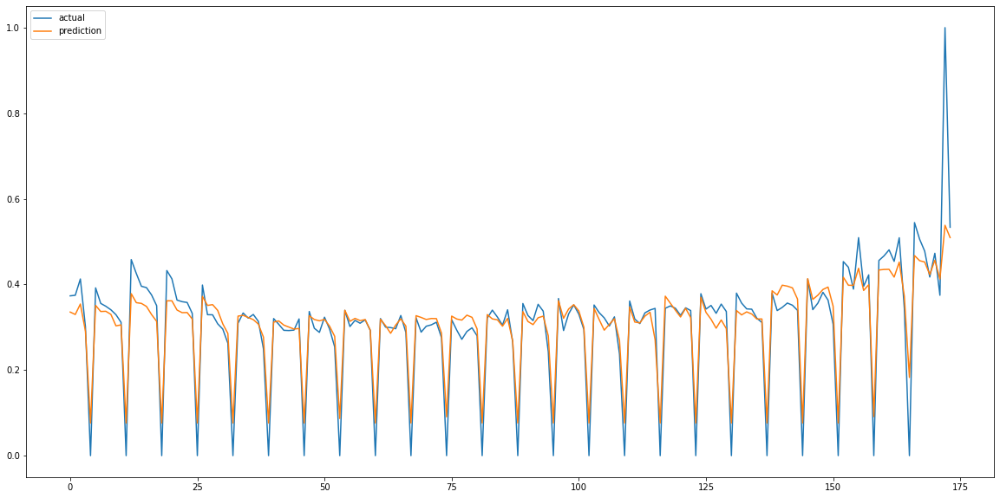

파프리카_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.03319520386408478
R-squared:  0.9387593149967353


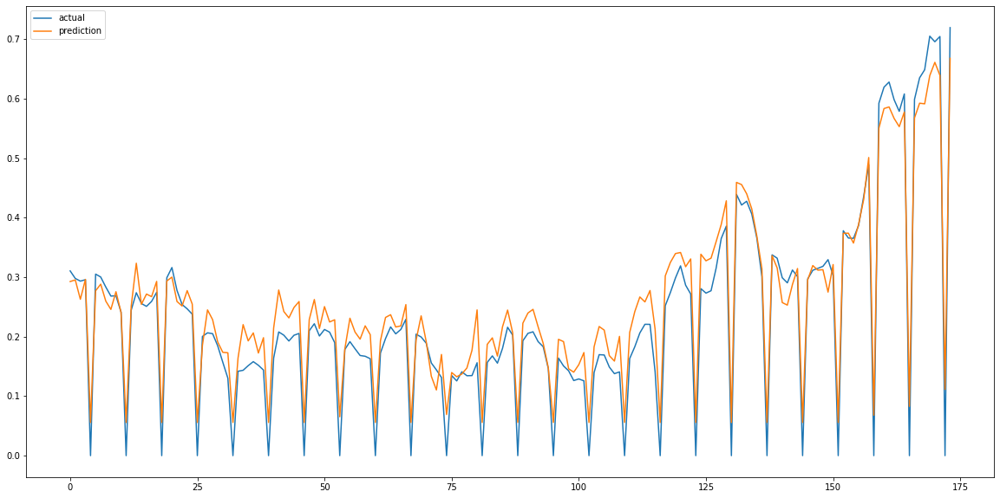

새송이_가격(원/kg) 예측 모델 
{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}
MAE:  0.05942816711618338
R-squared:  0.8706922251425502


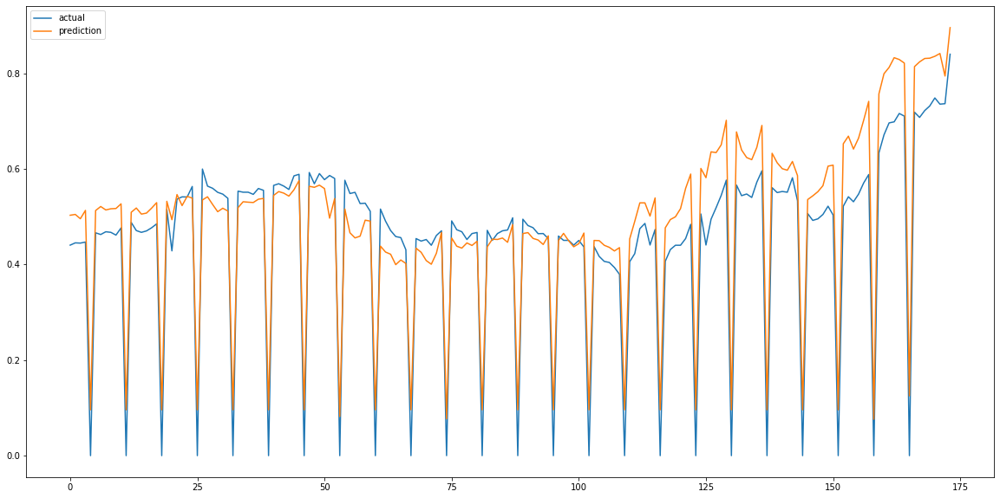

팽이버섯_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.058330574783545586
R-squared:  0.8193741359141038


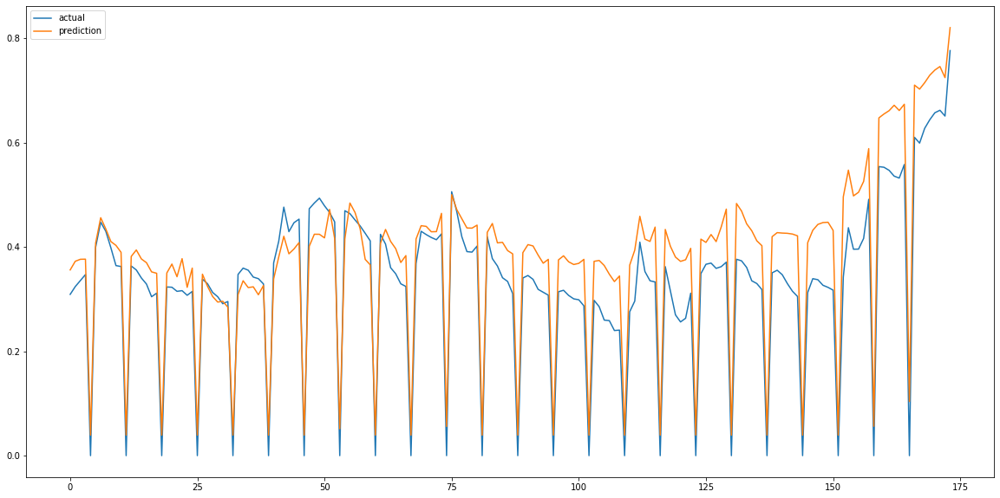

토마토_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.059346770536677876
R-squared:  0.8227415902834162


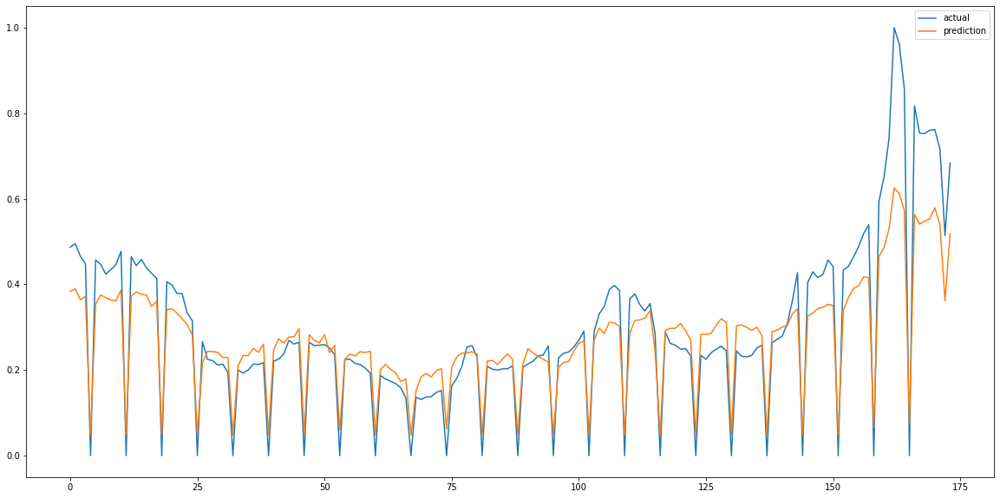

청상추_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.0565821179978386
R-squared:  0.8511032900096817


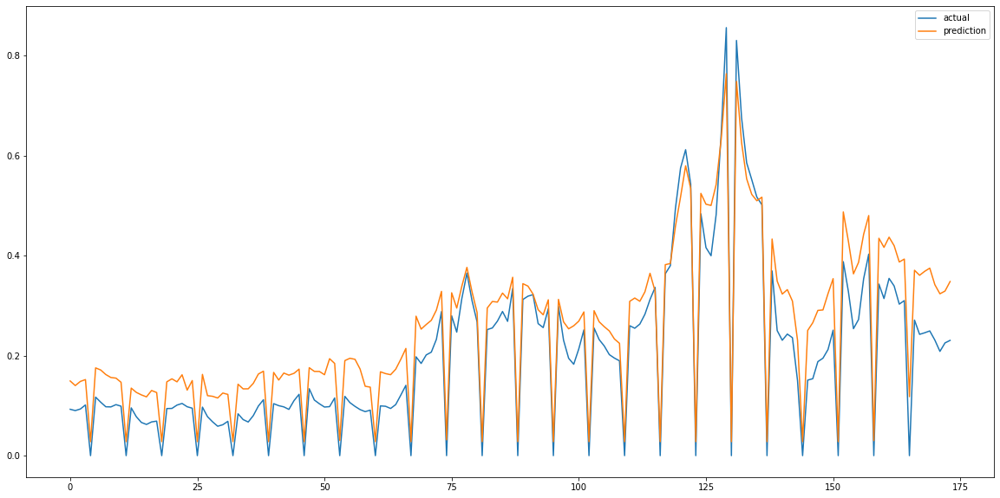

백다다기_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.05728588909989675
R-squared:  0.8725254164091647


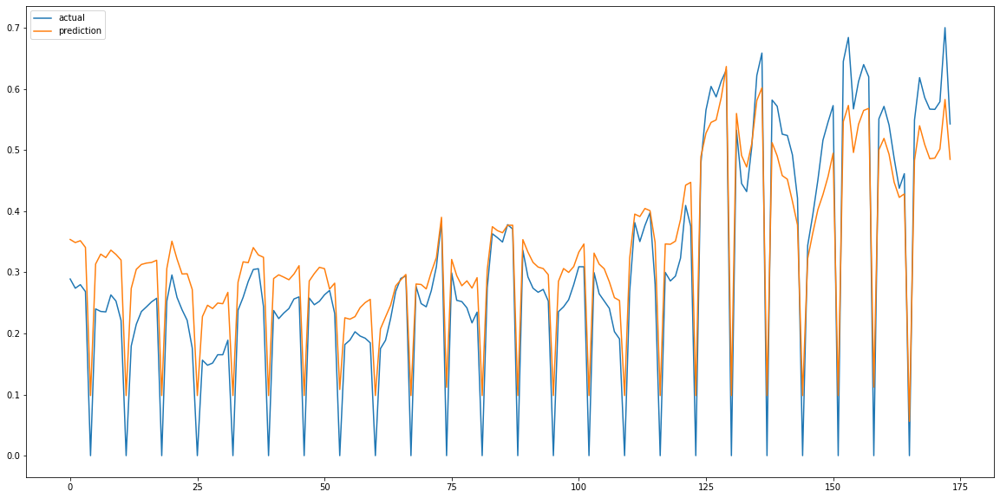

애호박_가격(원/kg) 예측 모델 
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
MAE:  0.035866072706215425
R-squared:  0.9137969636923832


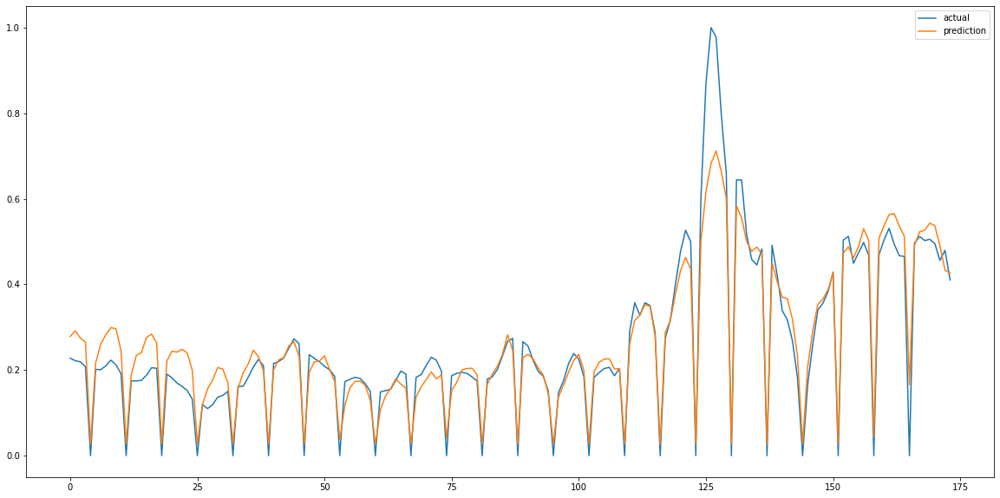

캠벨얼리_가격(원/kg) 예측 모델 
{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}
MAE:  0.027718727972452964
R-squared:  0.8533549742288247


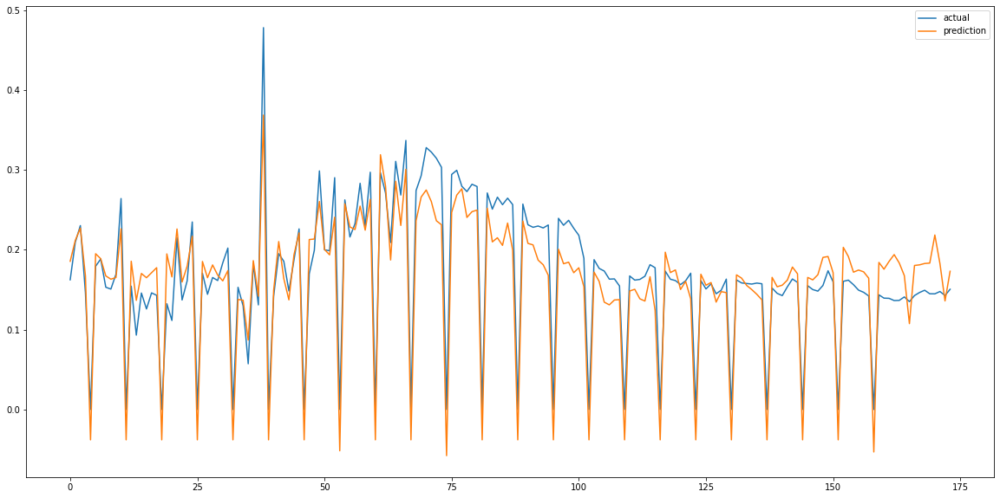

샤인마스캇_가격(원/kg) 예측 모델 
{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
MAE:  0.053779006212465376
R-squared:  0.9440454743098647


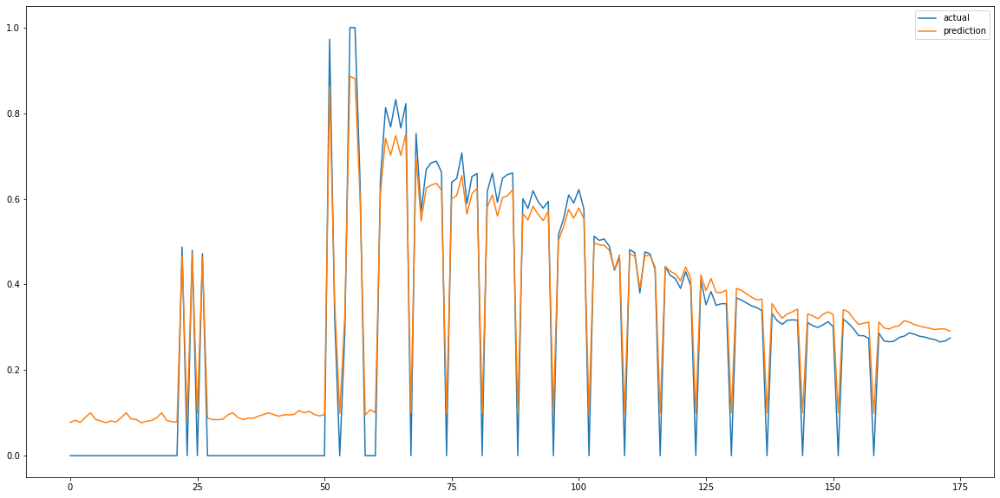

In [40]:
for col in label_col_list:
    print("="*100)
    print("{0} 예측 모델 ".format(col))
    print("="*100)
    
    train_X, train_y = train_df.iloc[:, :features_len*window_size], train_df.loc[:,col]
    val_X, val_y = val_df.iloc[:, :features_len*window_size], val_df.loc[:,col]
    test_X, test_y = test_df.iloc[:, :features_len*window_size], test_df.loc[:,col]
    
    svm_clf=SVR(kernel='linear')
    # best_params_을 이용하여 최적의 파라미터 확인
    best_params_ = svm_param_selection(train_X, train_y.values.ravel(), 10)

    # 최적의 파라미터로 학습
    clf = SVR(C= 1000, gamma= 0.001)
    clf.fit(train_X, train_y.values.ravel())



    # 추론
    svm_pred=clf.predict(test_X)

    # 평가(MAE)
    socre = mean_absolute_error(test_y, svm_pred)
    print('MAE: ', socre)

    # 평가(r2_score)
    score = r2_score(test_y, svm_pred)
    #r2_score(train_X, train_y)
    #score = clf.score(train_X, train_y)
    print('R-squared: ', score)



    # 예측 데이터 시각화 
    plt.figure(figsize=(20, 10))

    plt.plot(np.array(test_y), label='actual')
    plt.plot(svm_pred, label='prediction')
    plt.legend()
    plt.show()

## 4.2 Lightgbm

In [43]:
import pandas as pd
import numpy as np
#import lightgbm
from tqdm import tqdm # 진행률 프로세스 바 ""
import warnings # 워닝 경고

from sklearn.model_selection import cross_validate, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score

import graphviz
import matplotlib.pyplot as plt

#from google.colab import drive
#drive.mount('/content/drive')

# 경고 끄기
pd.set_option('mode.chained_assignment', None)
warnings.filterwarnings(action='ignore')

### 전처리

In [ ]:
def preprocessing(temp_df, pum, len_lag) :
    # p_lag, q_lag 추가
    for lag in range(1,len_lag+1) :
        temp_df[f'p_lag_{lag}'] = -1
        temp_df[f'q_lag_{lag}'] = -1
        for index in range(lag, len(temp_df)) :
            temp_df.loc[index, f'p_lag_{lag}'] = temp_df[f'{pum}_가격(원/kg)'][index-lag] #1일전, 2일전, ... 가격을 feature로 추가
            temp_df.loc[index, f'q_lag_{lag}'] = temp_df[f'{pum}_거래량(kg)'][index-lag] #1일전, 2일전, ... 거래량을 feature로 추가

    # month 추가
    temp_df['date'] = pd.to_datetime(temp_df['date'])
    temp_df['month'] = temp_df['date'].dt.month

    # 예측 대상(1w,2w,4w) 추가 - 이게 정확하게 먼지 모르겠음..(target 변수??)
    for week in ['1_week','2_week','4_week'] :
        temp_df[week] = 0
        n_week = int(week[0])
        for index in range(len(temp_df)) :
            try : temp_df[week][index] = temp_df[f'{pum}_가격(원/kg)'][index+7*n_week]
            except : continue

    # 불필요한 column 제거        
    temp_df = temp_df.drop(['date',f'{pum}_거래량(kg)',f'{pum}_가격(원/kg)'], axis=1)
    
    return temp_df

In [ ]:
train = pd.read_csv('train.csv')
train

# preprocessing 함수 예시
pum = '배추'
temp_df = train[['date',f'{pum}_거래량(kg)', f'{pum}_가격(원/kg)_{pum}']]
preprocessing(temp_df, pum, len_lag=28)

### 학습

In [ ]:
def nmae(week_answer, week_submission):
    answer = week_answer.to_numpy()
    target_idx = np.where(answer!=0)
    true = answer[target_idx]
    pred = week_submission[target_idx]
    score = np.mean(np.abs(true-pred)/true)
    
    return score

# score 점수를 계산한다. 트루값과, 예측값의 점수는 NMAE로 계산한다.
def at_nmae(pred, dataset):
    y_true = dataset.get_label()
    week_1_answer = y_true[0::3]
    week_2_answer = y_true[1::3]
    week_4_answer = y_true[2::3]
    
    week_1_submission = pred[0::3]
    week_2_submission = pred[1::3]
    week_4_submission = pred[2::3]
    
    score1 = nmae(week_1_answer, week_1_submission)
    score2 = nmae(week_2_answer, week_2_submission)
    score4 = nmae(week_4_answer, week_4_submission)
    
    score = (score1+score2+score4)/3
    
    return 'score', score, False

In [ ]:
# 모델을 돌리는 함수 생성
# 파라미터 정의
def model_train(x_train, y_train, x_valid, y_valid) :
    params = {'learning_rate': 0.01, 
              'max_depth': 6, 
              'boosting': 'gbdt', 
              'objective': 'regression',  
              'is_training_metric': True, 
              'num_leaves': 100, 
              'feature_fraction': 0.8, 
              'bagging_fraction': 0.8, 
              'bagging_freq': 5, 
              'seed':42,
              'num_threads':8
             }
# 모델의 밸리데이션 세팅과 얼리스탑 세팅 등을 한다.
    model = lightgbm.train(params, 
                   train_set = lightgbm.Dataset(data = x_train, label = y_train),
                   num_boost_round = 10000, 
                   valid_sets = lightgbm.Dataset(data = x_valid, label = y_valid), 
                   init_model = None, 
                   early_stopping_rounds = 100,
                   feval = at_nmae,
                   verbose_eval = True
                   
                    )
    
    return model

### 품목 및 품종별 모델 학습

In [ ]:
unique_pum = [
    '배추', '무', '양파', '건고추','마늘',
    '대파', '얼갈이배추', '양배추', '깻잎',
    '시금치', '미나리', '당근',
    '파프리카', '새송이', '팽이버섯', '토마토',
]

unique_kind = [
    '청상추', '백다다기', '애호박', '캠벨얼리', '샤인마스캇'
]

# 품목, 품종별 데이터가 1,2,4 주의 데이터를 모델링하여 model_dict에 집어넣는다.
model_dict = {}
split = 28 #validation

for pum in tqdm(unique_pum + unique_kind):
    # 품목 품종별 전처리
    temp_df = train[['date',f'{pum}_거래량(kg)', f'{pum}_가격(원/kg)_{pum}']]
    temp_df = preprocessing(temp_df, pum, len_lag=28)
    
    # 주차별(1,2,4w) 학습
    for week_num in [1,2,4] : # for week_num in [1,2,4]
        x = temp_df[temp_df[f'{week_num}_week']>0].iloc[:,:-3]  
        #60 컬럼중 예측 해야하는 y라벨에 대해서 y라벨을 의미하는 1주,2주,4주의 데이터를 잘라내어 y값에 넣어준다. 0값 제거
        y = temp_df[temp_df[f'{week_num}_week']>0][f'{week_num}_week']
        n=len(x)
        n=len(y)
        
        #train, test split
        x_train = x[:-split] 
        y_train = y[:-split]



        x_valid = x[-split:]
        y_valid = y[-split:]
        
        model_dict[f'{pum}_model_{week_num}'] = model_train(x_train, y_train, x_valid, y_valid)

In [ ]:
model_dict

## 4.3 CNN+LSTM

In [28]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import tensorflow as tf 

# 범주형 수치형 인코딩 및 정규화 
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

from math import sqrt
from matplotlib import pyplot

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

keras = tf.keras

# 한글 표기를 위한 처리
import matplotlib
import matplotlib.pyplot as plt

from matplotlib import font_manager, rc
import platform
if platform.system()=="Windows":
    font_name=font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
matplotlib.rcParams['axes.unicode_minus']=False

import warnings
warnings.filterwarnings("ignore")

In [29]:
# 데이터 로드
df = pd.read_csv('train.csv')
df.head()

# 불러온 데이터 카피 
cp_df = df.copy()

cp_df.shape

(1733, 44)

### 간단한 EDA 시각화

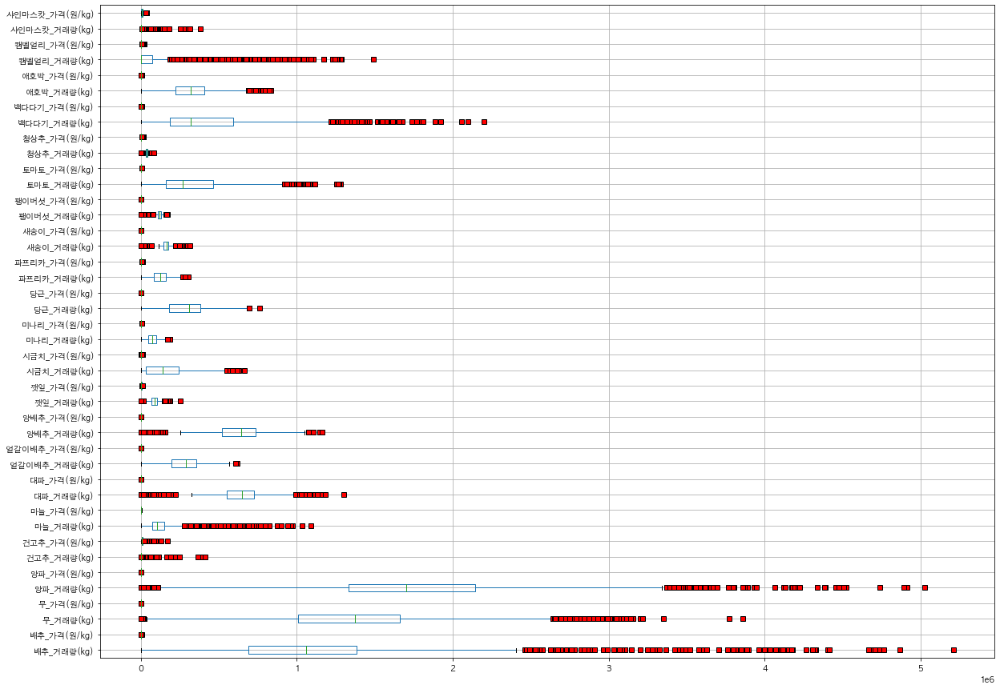

In [30]:
# 이상치 확인
df[df.columns].boxplot(figsize=(20, 15)
                                    , vert=False
                                    , flierprops=dict(markerfacecolor='r', marker='s'))
plt.show()

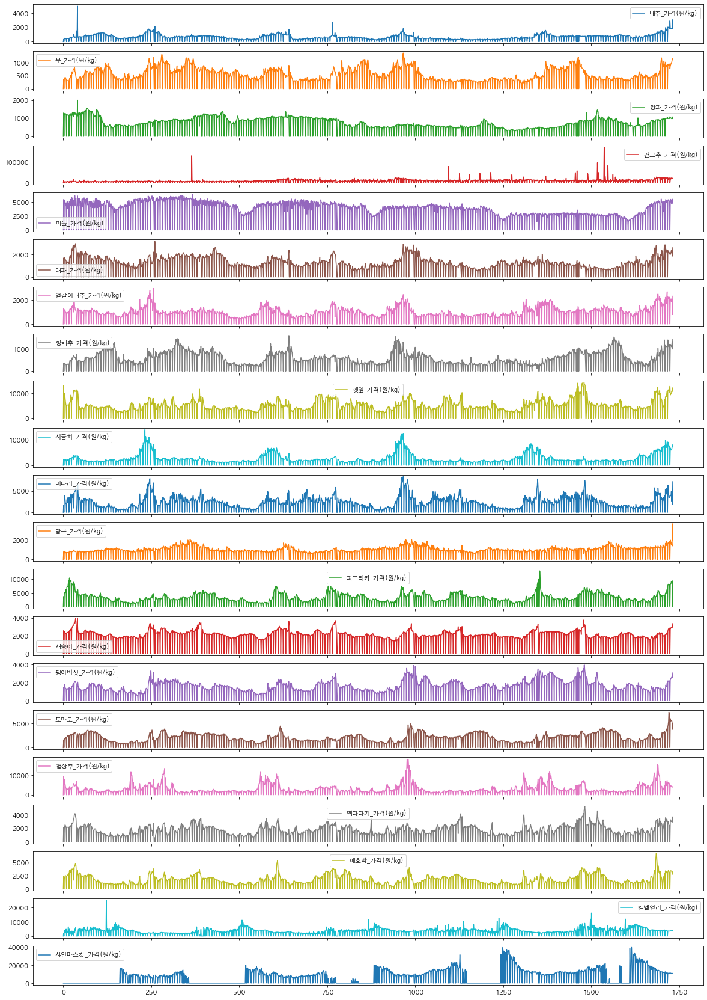

In [31]:
# 품목별 가격
df.iloc[:, 3::2].plot(figsize=(20, 30), subplots=True)
plt.show()

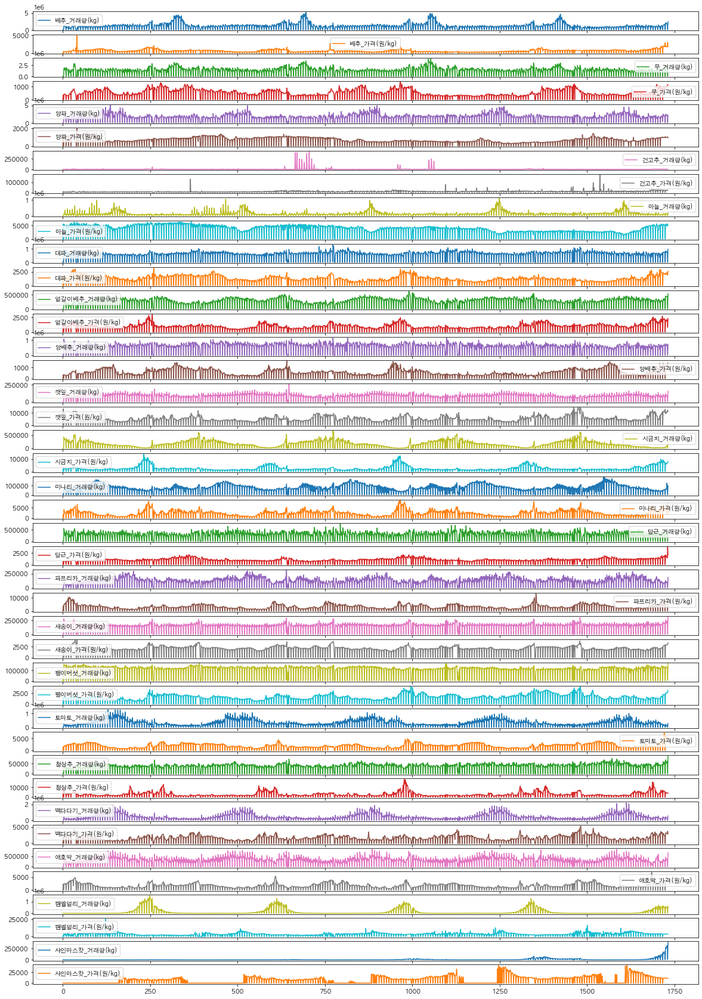

In [32]:
# 품목별 거래량
df.iloc[:, 2::1].plot(figsize=(20, 30), subplots=True)
plt.show()

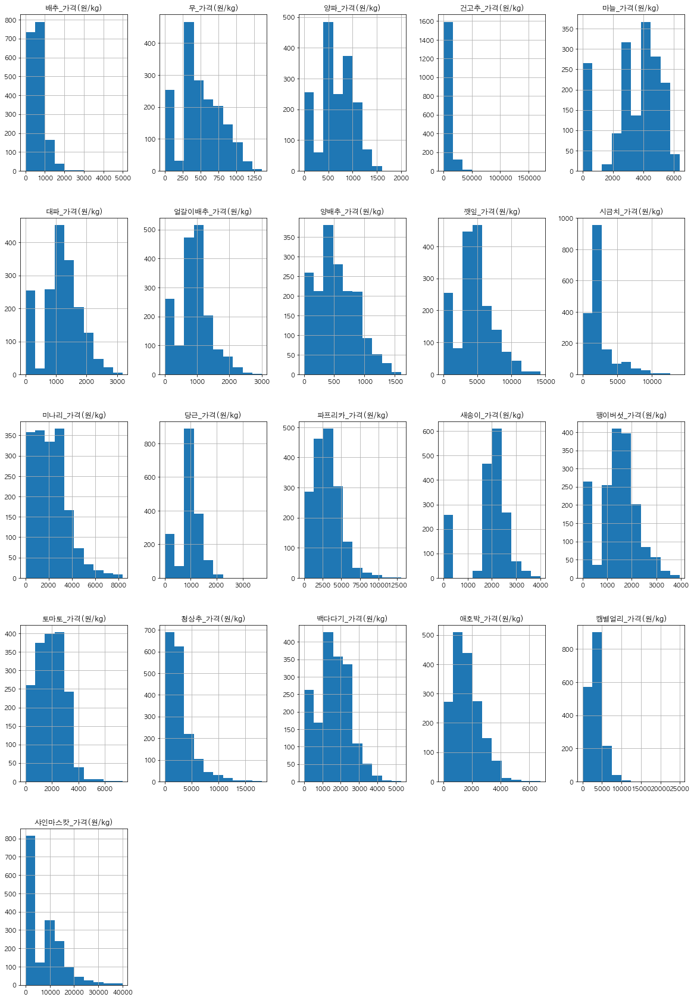

In [33]:
df.iloc[:,3::2].hist(figsize=(20, 30))
plt.show()

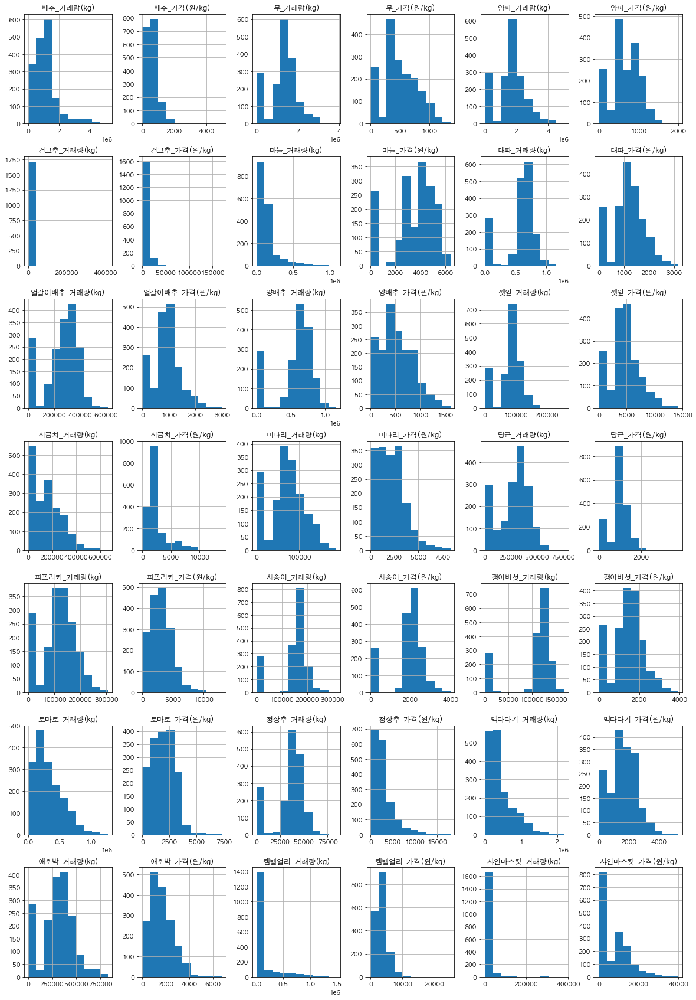

In [34]:
# 거래량
df.iloc[:,2::1].hist(figsize=(20, 30))
plt.show()

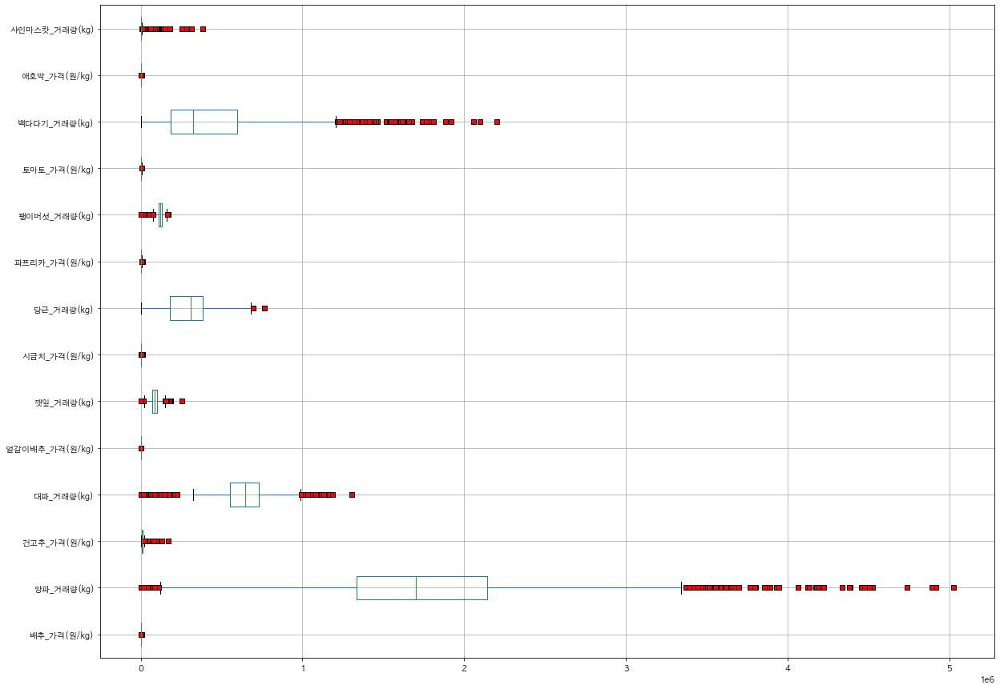

In [35]:
# 이상치 확인
cp_df.iloc[:,3::3].boxplot(figsize=(20, 15)
                                    , vert=False
                                    , flierprops=dict(markerfacecolor='r', marker='s'))
plt.show()

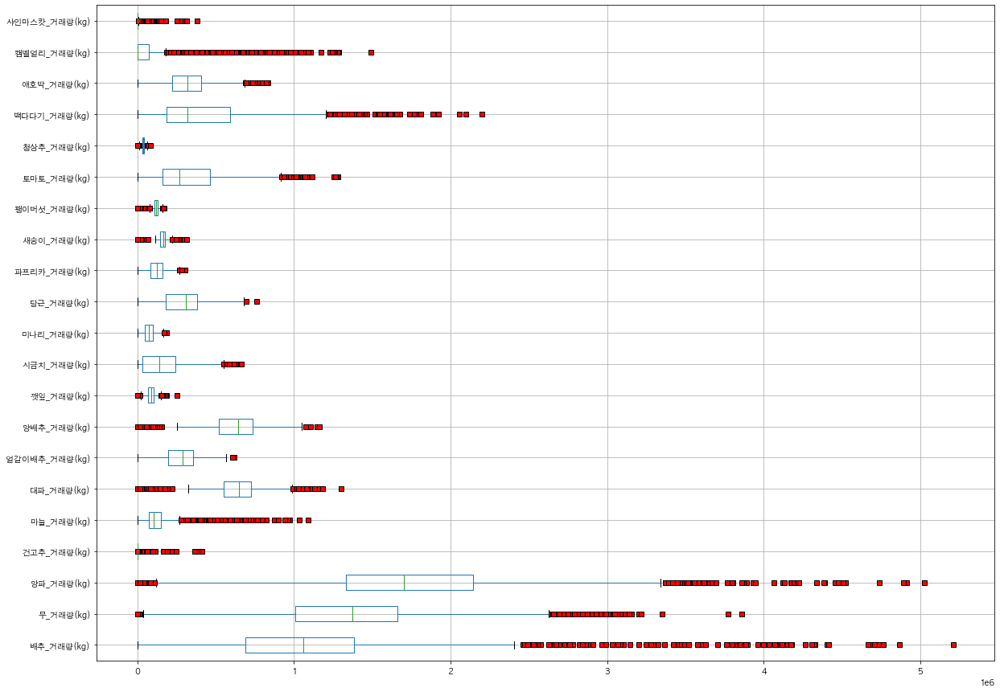

In [36]:
# 이상치 확인
cp_df.iloc[:, ::2].boxplot(figsize=(20, 15)
                                    , vert=False
                                    , flierprops=dict(markerfacecolor='r', marker='s'))
plt.show()

### 전처리

In [37]:
# 요일 범주형 > 라벨인코딩 처리
le = LabelEncoder()
le.fit(cp_df.iloc[:, 1])
cp_df['요일']=le.transform(cp_df.iloc[:, 1])

cp_df.head(5)

,date,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),...,청상추_거래량(kg),청상추_가격(원/kg),백다다기_거래량(kg),백다다기_가격(원/kg),애호박_거래량(kg),애호박_가격(원/kg),캠벨얼리_거래량(kg),캠벨얼리_가격(원/kg),샤인마스캇_거래량(kg),샤인마스캇_가격(원/kg)
0,2016-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2016-01-02,5,80860.0,329.0,80272.0,360.0,122787.5,1281.0,3.0,11000.0,...,5125.0,9235.0,434.0,2109.0,19159.0,2414.0,880.0,2014.0,0.0,0.0
2,2016-01-03,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2016-01-04,3,1422742.5,478.0,1699653.7,382.0,2315079.0,1235.0,699.0,4464.0,...,38525.5,7631.0,500702.0,2046.0,620539.0,2018.0,2703.8,3885.0,0.0,0.0
4,2016-01-05,6,1167241.0,442.0,1423482.3,422.0,2092960.1,1213.0,1112.6,4342.0,...,32615.0,6926.0,147638.0,2268.0,231958.0,2178.0,8810.0,2853.0,0.0,0.0


In [38]:
# MinMaxScaler 정규화 
minmax = MinMaxScaler()
minmax.fit(cp_df.iloc[:, 1:])
cp_df.iloc[:, 1:]=minmax.transform(cp_df.iloc[:, 1:])

# train set => date 를 제외 
input_col_list = cp_df.iloc[:, 1:].columns 
# ytrain set => date 요일 거래량을 제외 하고 가격 컬럼만 추출 
label_col_list = cp_df.iloc[:, 3::2].columns

print(cp_df.shape)
print("label_col_list", len(label_col_list))
print("input_col_list", len(input_col_list))

(1733, 44)
label_col_list 21
input_col_list 43


In [39]:
cp_df.head(5)

,date,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),...,청상추_거래량(kg),청상추_가격(원/kg),백다다기_거래량(kg),백다다기_가격(원/kg),애호박_거래량(kg),애호박_가격(원/kg),캠벨얼리_거래량(kg),캠벨얼리_가격(원/kg),샤인마스캇_거래량(kg),샤인마스캇_가격(원/kg)
0,2016-01-01,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0
1,2016-01-02,0.833333,0.015520,0.0658,0.020797,0.264706,0.024437,0.6405,0.000007,0.064389,...,0.060900,0.511068,0.000197,0.398376,0.023032,0.356152,0.000590,0.08056,0.0,0.0
2,2016-01-03,0.666667,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0
3,2016-01-04,0.500000,0.273068,0.0956,0.440354,0.280882,0.460735,0.6175,0.001690,0.026130,...,0.457792,0.422302,0.227365,0.386475,0.745976,0.297728,0.001814,0.15540,0.0,0.0
4,2016-01-05,1.000000,0.224029,0.0884,0.368802,0.310294,0.416530,0.6065,0.002690,0.025416,...,0.387559,0.383287,0.067041,0.428410,0.278846,0.321334,0.005911,0.11412,0.0,0.0


In [40]:
cp_df.tail(171)

,date,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),...,청상추_거래량(kg),청상추_가격(원/kg),백다다기_거래량(kg),백다다기_가격(원/kg),애호박_거래량(kg),애호박_가격(원/kg),캠벨얼리_거래량(kg),캠벨얼리_가격(원/kg),샤인마스캇_거래량(kg),샤인마스캇_가격(원/kg)
1562,2020-04-11,0.833333,0.089733,0.1516,0.268704,0.266176,0.420752,0.3890,0.000769,0.235231,...,0.658856,0.101439,0.360195,0.268417,0.447859,0.207731,0.002087,0.14584,0.000000,0.000000
1563,2020-04-12,0.666667,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
1564,2020-04-13,0.500000,0.190172,0.1442,0.375246,0.288971,0.441939,0.4195,0.000762,0.073497,...,0.726262,0.117100,0.646575,0.240083,0.828459,0.201387,0.002004,0.17928,0.000000,0.000000
1565,2020-04-14,1.000000,0.162019,0.1472,0.256864,0.352206,0.433595,0.4235,0.000234,0.067767,...,0.653828,0.106918,0.355132,0.235927,0.502671,0.200944,0.003240,0.18832,0.000000,0.000000
1566,2020-04-15,0.333333,0.163314,0.1462,0.332413,0.338235,0.456438,0.4290,0.001702,0.063974,...,0.628424,0.097786,0.350223,0.235172,0.493940,0.209649,0.004723,0.15300,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1728,2020-09-24,0.166667,0.356409,0.3678,0.532584,0.727941,0.454038,0.4950,0.006813,0.111809,...,0.602816,0.249530,0.128151,0.566868,0.376438,0.505459,0.338341,0.14480,0.740842,0.273500
1729,2020-09-25,0.000000,0.360848,0.3578,0.486887,0.743382,0.412859,0.4775,0.004562,0.135188,...,0.645499,0.231212,0.141775,0.566490,0.436066,0.495279,0.321862,0.14472,0.794687,0.271100
1730,2020-09-26,0.833333,0.318814,0.3520,0.442875,0.790441,0.415758,0.4805,0.002318,0.131764,...,0.727384,0.208633,0.148668,0.578957,0.469269,0.456182,0.349917,0.14764,0.819581,0.265900
1731,2020-09-27,0.666667,0.004874,0.6132,0.009903,0.837500,0.003630,0.5280,0.000145,0.130728,...,0.001711,0.225567,0.000129,0.700227,0.002962,0.479788,0.014572,0.14268,0.025464,0.267475


In [41]:
# LSTM
# 20일치 데이터를 가지고 다음 가격을 예측
def custom_window_dataset(arg_df, arg_shift=20):
    features = arg_df.iloc[:, 1:].copy()
    
    reframe_dt = pd.DataFrame()
    for sft in range(arg_shift, 0, -1):
        shift_dt = features.shift(periods=sft, axis=0)
        shift_dt.reset_index(drop=True, inplace=True)
        reframe_dt.reset_index(drop=True, inplace=True)
        tmp_df = pd.concat([reframe_dt, shift_dt], axis=1)
        reframe_dt = tmp_df.copy()
        
    new_colnm = [col + '_tg' for col in features.iloc[:, 2::2].columns]

    # shift를 한 데이터와 합쳐서 예측값을 생성
    features_df = pd.DataFrame(features.iloc[:, 2::2].values, columns=new_colnm)
    temp_df = pd.concat([reframe_dt, features_df], axis=1)
    # print(features_df)
    # print(temp_df)
    # NaN 값의 row를 제거
    reframed = temp_df.dropna().copy()
    
    return reframed

In [42]:
# 파라미터 정의
WINDOW_SIZE = 28   # tiemstamp

label_len = len(label_col_list)
features_len = len(input_col_list)

reframed_df = custom_window_dataset(cp_df, WINDOW_SIZE)

reframed_df

,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),마늘_거래량(kg),...,당근_가격(원/kg)_tg,파프리카_가격(원/kg)_tg,새송이_가격(원/kg)_tg,팽이버섯_가격(원/kg)_tg,토마토_가격(원/kg)_tg,청상추_가격(원/kg)_tg,백다다기_가격(원/kg)_tg,애호박_가격(원/kg)_tg,캠벨얼리_가격(원/kg)_tg,샤인마스캇_가격(원/kg)_tg
28,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,0.233867,0.623095,0.80125,0.462161,0.408138,0.259159,0.578391,0.547507,0.13476,0.000000
29,0.833333,0.015520,0.0658,0.020797,0.264706,0.024437,0.6405,0.000007,0.064389,0.013751,...,0.232800,0.681369,0.79300,0.492534,0.403647,0.317432,0.637325,0.589112,0.13264,0.000000
30,0.666667,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,0.266667,0.000000,0.79575,0.000000,0.000000,0.299059,0.656215,0.244320,0.00000,0.000000
31,0.500000,0.273068,0.0956,0.440354,0.280882,0.460735,0.6175,0.001690,0.026130,0.129684,...,0.237067,0.643081,0.86200,0.518097,0.420386,0.287050,0.733283,0.623930,0.13716,0.000000
32,1.000000,0.224029,0.0884,0.368802,0.310294,0.416530,0.6065,0.002690,0.025416,0.115556,...,0.232800,0.606402,0.84050,0.528474,0.393576,0.246984,0.767662,0.653290,0.10512,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1728,0.166667,0.195776,0.3122,0.319968,0.863971,0.239425,0.4530,0.004320,0.152316,0.086058,...,0.417333,0.704954,0.73175,0.644141,0.760343,0.249530,0.566868,0.505459,0.14480,0.273500
1729,0.000000,0.146494,0.3128,0.267873,0.771324,0.241746,0.4625,0.022654,0.078186,0.068607,...,0.472800,0.695612,0.74850,0.657555,0.761568,0.231212,0.566490,0.495279,0.14472,0.271100
1730,0.833333,0.145963,0.2952,0.228952,0.658088,0.317462,0.4680,0.012158,0.153656,0.076770,...,0.374667,0.704342,0.73550,0.662364,0.716113,0.208633,0.578957,0.456182,0.14764,0.265900
1731,0.666667,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.73650,0.651228,0.514562,0.225567,0.700227,0.479788,0.14268,0.267475


In [43]:
cp_df.shape, reframed_df.shape

((1733, 44), (1705, 1225))

In [44]:
# 데이터 세트 분할 
# 훈련, 검증, 테스트 데이터 세트 (80, 10, 10) 
n = len(reframed_df)
train_df = reframed_df[0:int(n*0.8)]
val_df = reframed_df[int(n*0.8):int(n*0.9)]
test_df = reframed_df[int(n*0.9):]

num_features = reframed_df.shape[1]

# 분할 데이터 확인 
print(train_df.shape, val_df.shape, test_df.shape)
print(num_features)
print("label_col_list", len(label_col_list))
print("input_col_list", len(input_col_list))

label_col_list = [col for col in train_df.columns if '_tg' in col]

# 입력값과 출력값으로 분리
train_X, train_y = train_df.iloc[:, :features_len*WINDOW_SIZE], train_df.loc[:,label_col_list]
val_X, val_y = val_df.iloc[:, :features_len*WINDOW_SIZE], val_df.loc[:,label_col_list]
test_X, test_y = test_df.iloc[:, :features_len*WINDOW_SIZE], test_df.loc[:,label_col_list]

# 범위, 타임스탬프, 컬럼
train_X = train_X.values.reshape((train_X.shape[0], WINDOW_SIZE, features_len))
val_X = val_X.values.reshape((val_X.shape[0], WINDOW_SIZE, features_len))
test_X = test_X.values.reshape((test_X.shape[0], WINDOW_SIZE, features_len))

train_y = train_y.values.reshape((train_y.shape[0], 1, train_y.shape[1]))
val_y = val_y.values.reshape((val_y.shape[0], 1, val_y.shape[1]))
test_y = test_y.values.reshape((test_y.shape[0], 1, test_y.shape[1]))

(1364, 1225) (170, 1225) (171, 1225)
1225
label_col_list 21
input_col_list 43


In [45]:
print(train_X.shape, len(train_X), train_y.shape)
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

print(train_X.shape, train_y.shape)
print(val_X.shape, val_y.shape)
print(test_X.shape, test_y.shape)

(1364, 28, 43) 1364 (1364, 1, 21)
(1364, 28, 43) (1364, 1, 21) (171, 28, 43) (171, 1, 21)
(1364, 28, 43) (1364, 1, 21)
(170, 28, 43) (170, 1, 21)
(171, 28, 43) (171, 1, 21)


In [46]:
def seed_init(arg_seed: int = 1031):
    keras.backend.clear_session()
    np.random.seed(arg_seed)
    tf.random.set_seed(arg_seed)

In [47]:
def model_perfomance_print(arg_model, arg_model_nm,arg_val_X, arg_val_y, arg_test_X, arg_test_y, arg_flag):
    val_X = arg_val_X
    val_y = arg_val_y 
    
    test_X = arg_test_X
    test_y = arg_test_y       
    
    model = arg_model         # 모델
    model_name = arg_model_nm # 모델 명칭
    
    val_pfmc_dict = {}
    pfmc_dict = {}
    
    #  검증 데이터로 예측모델 평가
    val_evaluate = model.evaluate(val_X, val_y, verbose=2)
    val_pfmc_dict[model_name] = val_evaluate
    #  테스트 데이터로 예측모델 평가
    test_evaluate = model.evaluate(test_X, test_y, verbose=2)
    pfmc_dict[model_name] = test_evaluate
    print("검증 데이터로 예측모델 평가: ", val_evaluate)
    print("테스트 데이터로 예측모델 평가", test_evaluate)

    # r2 score value 
    yhat = model.predict(test_X)
    # yhat.shape
    # yhat = yhat.reshape(yhat.shape[0], 1, yhat.shape[1])
    if arg_flag: 
        r2_test_y = test_y.reshape(test_y.shape[0], test_y.shape[2])
        print("r2 score :", r2_score(r2_test_y, yhat))
    
    return val_pfmc_dict, pfmc_dict

In [48]:
def prediction_plot_show(arg_test, arg_pred):    
    test_y_df = pd.DataFrame(arg_test.reshape(arg_test.shape[0]*arg_test.shape[1], arg_test.shape[2]))
    pred_df=pd.DataFrame(arg_pred)
        
    # 예측 데이터 시각화 
    plt.figure(figsize=(20, 10))
    plt.plot(test_y_df.iloc[:, 1], label='actual')
    plt.plot(pred_df.iloc[:, 1], label='prediction')
    plt.legend()
    plt.show()

In [49]:
def perfomance_plot_show(arg_hist):
    hist = arg_hist
    
    # 예측모델 평가 시각화 
    fig, loss_ax = plt.subplots()
    acc_ax = loss_ax.twinx()
    loss_ax.plot(hist.history['loss'], 'y', label='train loss')
    loss_ax.plot(hist.history['val_loss'], 'r', label='val loss')
    acc_ax.plot(hist.history['mae'], 'b', label='train mae')
    acc_ax.plot(hist.history['val_mae'], 'g', label='val mae')

    loss_ax.set_xlabel('epoch')
    loss_ax.set_ylabel('loss')
    acc_ax.set_ylabel('mae')

    loss_ax.legend(loc='upper left')
    acc_ax.legend(loc='lower left')
    pyplot.show()

    plt.subplot(2, 1 , 1)
    # plot history
    pyplot.plot(hist.history['loss'], label='train')
    pyplot.plot(hist.history['val_loss'], label='test')
    pyplot.legend()
    pyplot.show()

### 모델 컴파일 및 학습

In [50]:
# 모델 컴파일 및 학습
def model_complie_fit(arg_model, arg_trainx, arg_trainy, arg_valx, arg_valy, arg_patience=10):    
    # init 
    global lr
    global save_path
    global EPOCHS
    global BATCH_SIZE
    patience = arg_patience
    
    train_X = arg_trainx.copy()
    train_y = arg_trainy.copy()
    
    val_X = arg_valx.copy()
    val_y = arg_valy.copy()
    model = arg_model
        
    # 옵티마이저 및 로스 함수 정의 
    optimizer_func = keras.optimizers.Adam(learning_rate=lr)
    # loss_func = keras.losses.MeanAbsoluteError() # MAE 
    loss_func = keras.losses.Huber() # Huber 사용 MAE, MSE 를 합친 outlier 의 영향을 덜 받음  

    # earlystopping은 10번 epoch통안 val_loss 개선이 없다면 학습을 멈춥니다.
    earlystopping = keras.callbacks.EarlyStopping(monitor='val_loss'
                                                , patience=patience
                                                , mode='min')
    # val_loss 기준 체크포인터 생성합니다.
    checkpoint = keras.callbacks.ModelCheckpoint(save_path, 
                                                save_weights_only=True, 
                                                save_best_only=True, 
                                                monitor='val_loss', 
                                                verbose=1)
    model.compile(loss=loss_func,
                optimizer=optimizer_func,
                metrics=["mae"])

    print("optimizer : Adam \tlearning_rate: ", lr)
    print("obtimizer_function: [{0}]".format(optimizer_func))
    print("loss_function: [{0}]".format(loss_func.fn))
    print("metrics: mae")
    print("="*100)
    print("epochs: {0} \t배치 사이즈 : {1}".format(EPOCHS, BATCH_SIZE))
    print("callbacks early_stopping: [{0}] \tpatience: [{1}]".format(earlystopping.monitor, patience))
    print("="*100)
    
    history=model.fit(train_X, train_y, epochs=EPOCHS, batch_size=BATCH_SIZE
                            , validation_data=(val_X, val_y), callbacks=[checkpoint, earlystopping]
                            , verbose=2, shuffle=False)
    return history

In [51]:
# 하이퍼파라미터 전역변수
# device = torch.device("cuda:0")       # GPU 사용

# 입력/출력 품목/품종의 수
features_n = 43                         # 입력 품목/품종의 수
target_n = 21                           # 맞춰야하는 품목/품종의 수

BATCH_SIZE = 32                         # 배치사이즈
EPOCHS = 100                            # 총 eopochs
dropout = 0.2                           # 드롭아웃
# save_path = f'./best_model.h5'        # 모델 저장 경로
save_path = 'best_model.h5'             # 모델 저장 경로

# Optimizer 함수 최적화 함수 파라미터
# learning_rate
lr_list = [1e-5, 1e-4, 1e-3, 5e-4]      # 0.01 기준으로
# lr = lr_list[1]                       # 학습률 0.0005
lr = 3e-4                              # 학습률 0.0005

# Loss(cost) 함수 손실 함수 파라미터
# CNN + RNN 하이퍼 파라미터 
CONV_WIDTH = [3, 5]
filter_size = 64

In [52]:
seed_init(1031)

In [53]:
# 모델 구성 CNN + LSTM
conv_lstm_model = keras.Sequential([
    keras.layers.Conv1D(filters=filter_size, kernel_size=(CONV_WIDTH[1], ),
                           strides=1, padding="causal", 
                           activation="relu", 
                           input_shape=[WINDOW_SIZE, features_n]), 
    keras.layers.LSTM(64, activation="relu", return_sequences=True),
    keras.layers.LSTM(32, activation="relu", return_sequences=False),
    # keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(target_n),
    # keras.layers.Lambda(lambda x: x * 200)
])
conv_lstm_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 28, 64)            13824     
_________________________________________________________________
lstm (LSTM)                  (None, 28, 64)            33024     
_________________________________________________________________
lstm_1 (LSTM)                (None, 32)                12416     
_________________________________________________________________
dense (Dense)                (None, 21)                693       
Total params: 59,957
Trainable params: 59,957
Non-trainable params: 0
_________________________________________________________________


In [54]:
hist = model_complie_fit(conv_lstm_model, train_X, train_y, val_X, val_y)

optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6b6bdeb0>]
loss_function: [<function huber at 0x7ffa71c92ee0>]
metrics: mae
epochs: 100 	배치 사이즈 : 32
callbacks early_stopping: [val_loss] 	patience: [10]
Epoch 1/100
43/43 - 4s - loss: 0.0402 - mae: 0.2167 - val_loss: 0.0326 - val_mae: 0.2070

Epoch 00001: val_loss improved from inf to 0.03262, saving model to best_model.h5
Epoch 2/100
43/43 - 1s - loss: 0.0229 - mae: 0.1670 - val_loss: 0.0228 - val_mae: 0.1737

Epoch 00002: val_loss improved from 0.03262 to 0.02284, saving model to best_model.h5
Epoch 3/100
43/43 - 1s - loss: 0.0171 - mae: 0.1408 - val_loss: 0.0191 - val_mae: 0.1543

Epoch 00003: val_loss improved from 0.02284 to 0.01912, saving model to best_model.h5
Epoch 4/100
43/43 - 1s - loss: 0.0148 - mae: 0.1262 - val_loss: 0.0180 - val_mae: 0.1474

Epoch 00004: val_loss improved from 0.01912 to 0.01796, saving model to best_model.h5
Epoch 5/100
43/43 - 1s - loss: 0.0140 

In [55]:
# 저장한 데이터를 로드
conv_lstm_model.load_weights("best_model.h5")
# conv_lstm_model = keras.models.load_weights("best_model.h5")
pred = conv_lstm_model.predict(test_X)

In [56]:
val_performance_dict = {}
performance_dict = {}
val_performance_dict, performance_dict = model_perfomance_print(conv_lstm_model, "CNN_LSTM", val_X, val_y, test_X, test_y, True)

6/6 - 0s - loss: 0.0160 - mae: 0.1315
6/6 - 0s - loss: 0.0147 - mae: 0.1204
검증 데이터로 예측모델 평가:  [0.015968121588230133, 0.13149826228618622]
테스트 데이터로 예측모델 평가 [0.014710422605276108, 0.12036880105733871]
r2 score : 0.17113459221490412


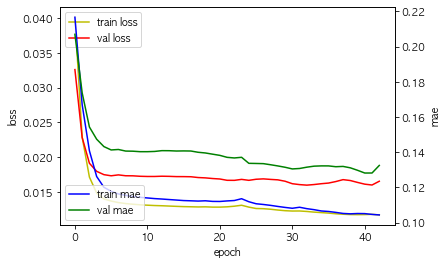

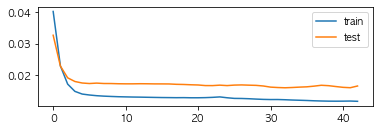

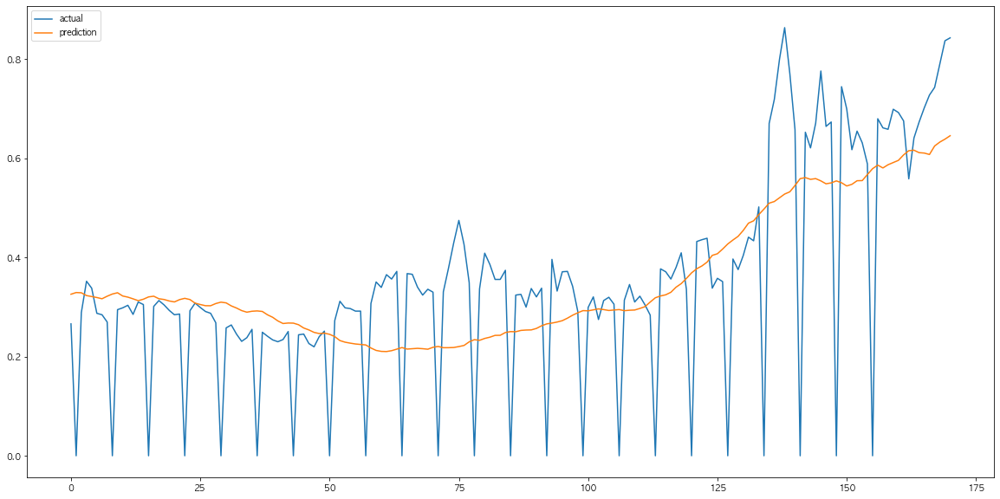

In [57]:
perfomance_plot_show(hist)
prediction_plot_show(test_y, pred)

In [58]:
reframed_df

,요일,배추_거래량(kg),배추_가격(원/kg),무_거래량(kg),무_가격(원/kg),양파_거래량(kg),양파_가격(원/kg),건고추_거래량(kg),건고추_가격(원/kg),마늘_거래량(kg),...,당근_가격(원/kg)_tg,파프리카_가격(원/kg)_tg,새송이_가격(원/kg)_tg,팽이버섯_가격(원/kg)_tg,토마토_가격(원/kg)_tg,청상추_가격(원/kg)_tg,백다다기_가격(원/kg)_tg,애호박_가격(원/kg)_tg,캠벨얼리_가격(원/kg)_tg,샤인마스캇_가격(원/kg)_tg
28,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,0.233867,0.623095,0.80125,0.462161,0.408138,0.259159,0.578391,0.547507,0.13476,0.000000
29,0.833333,0.015520,0.0658,0.020797,0.264706,0.024437,0.6405,0.000007,0.064389,0.013751,...,0.232800,0.681369,0.79300,0.492534,0.403647,0.317432,0.637325,0.589112,0.13264,0.000000
30,0.666667,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,0.266667,0.000000,0.79575,0.000000,0.000000,0.299059,0.656215,0.244320,0.00000,0.000000
31,0.500000,0.273068,0.0956,0.440354,0.280882,0.460735,0.6175,0.001690,0.026130,0.129684,...,0.237067,0.643081,0.86200,0.518097,0.420386,0.287050,0.733283,0.623930,0.13716,0.000000
32,1.000000,0.224029,0.0884,0.368802,0.310294,0.416530,0.6065,0.002690,0.025416,0.115556,...,0.232800,0.606402,0.84050,0.528474,0.393576,0.246984,0.767662,0.653290,0.10512,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1728,0.166667,0.195776,0.3122,0.319968,0.863971,0.239425,0.4530,0.004320,0.152316,0.086058,...,0.417333,0.704954,0.73175,0.644141,0.760343,0.249530,0.566868,0.505459,0.14480,0.273500
1729,0.000000,0.146494,0.3128,0.267873,0.771324,0.241746,0.4625,0.022654,0.078186,0.068607,...,0.472800,0.695612,0.74850,0.657555,0.761568,0.231212,0.566490,0.495279,0.14472,0.271100
1730,0.833333,0.145963,0.2952,0.228952,0.658088,0.317462,0.4680,0.012158,0.153656,0.076770,...,0.374667,0.704342,0.73550,0.662364,0.716113,0.208633,0.578957,0.456182,0.14764,0.265900
1731,0.666667,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.73650,0.651228,0.514562,0.225567,0.700227,0.479788,0.14268,0.267475


### CNN + LSTM 모델

In [59]:
# 다중 입력 단일 출력 CNN + LSTM 모델

# 하이퍼파라미터 전역변수
# device = torch.device("cuda:0")       # GPU 사용

# 입력/출력 품목/품종의 수
features_n = 43                         # 입력 품목/품종의 수
target_n = 21                           # 맞춰야하는 품목/품종의 수

BATCH_SIZE = 32                         # 배치사이즈
EPOCHS = 100                            # 총 eopochs
dropout = 0.2                           # 드롭아웃
# save_path = f'./best_model.h5'        # 모델 저장 경로
save_path = 'best_model.h5'             # 모델 저장 경로

# Optimizer 함수 최적화 함수 파라미터
# learning_rate
lr_list = [1e-5, 1e-4, 1e-3, 5e-4]      # 0.01 기준으로
# lr = lr_list[1]                       # 학습률 0.0005
lr = 30e-5                              # 학습률 0.0005

# Loss(cost) 함수 손실 함수 파라미터
# CNN + RNN 하이퍼 파라미터 
CONV_WIDTH = [3, 5]
filter_size = 32

In [60]:
seed_init(1031)

In [61]:
print(label_col_list)

['배추_가격(원/kg)_tg', '무_가격(원/kg)_tg', '양파_가격(원/kg)_tg', '건고추_가격(원/kg)_tg', '마늘_가격(원/kg)_tg', '대파_가격(원/kg)_tg', '얼갈이배추_가격(원/kg)_tg', '양배추_가격(원/kg)_tg', '깻잎_가격(원/kg)_tg', '시금치_가격(원/kg)_tg', '미나리_가격(원/kg)_tg', '당근_가격(원/kg)_tg', '파프리카_가격(원/kg)_tg', '새송이_가격(원/kg)_tg', '팽이버섯_가격(원/kg)_tg', '토마토_가격(원/kg)_tg', '청상추_가격(원/kg)_tg', '백다다기_가격(원/kg)_tg', '애호박_가격(원/kg)_tg', '캠벨얼리_가격(원/kg)_tg', '샤인마스캇_가격(원/kg)_tg']


배추_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 28, 32)            6912      
_________________________________________________________________
lstm (LSTM)                  (None, 28, 32)            8320      
_________________________________________________________________
lstm_1 (LSTM)                (None, 32)                8320      
_________________________________________________________________
dense (Dense)                (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa758f3ee0>]
loss_function: [<function huber at 0x7

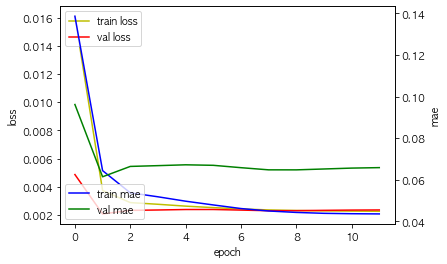

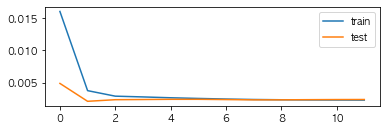

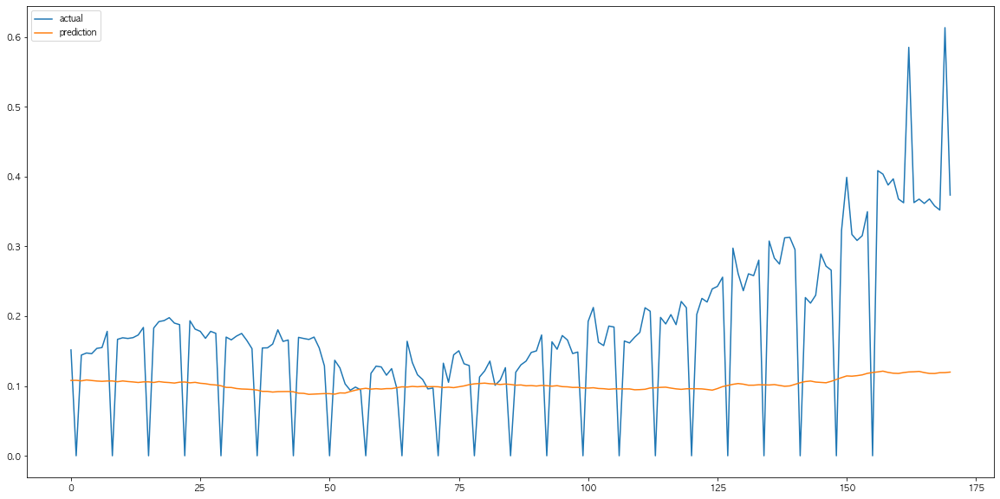

무_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_2 (LSTM)                (None, 28, 32)            8320      
_________________________________________________________________
lstm_3 (LSTM)                (None, 32)                8320      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6ae2dac0>]
loss_function: [<function huber at 0x

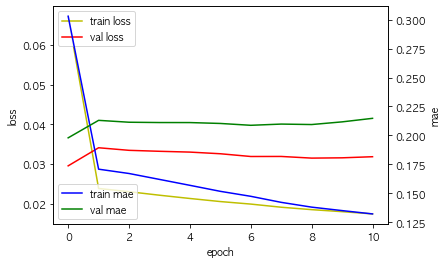

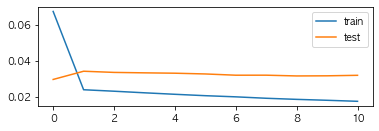

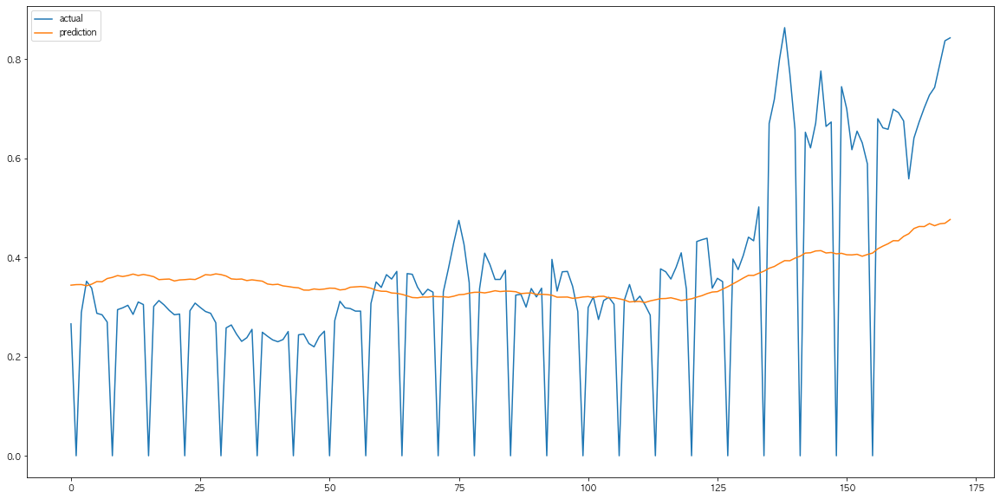

양파_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_2 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_4 (LSTM)                (None, 28, 32)            8320      
_________________________________________________________________
lstm_5 (LSTM)                (None, 32)                8320      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa61877a00>]
loss_function: [<function huber at 0

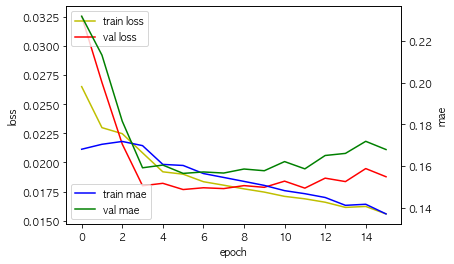

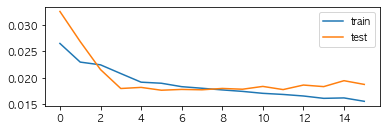

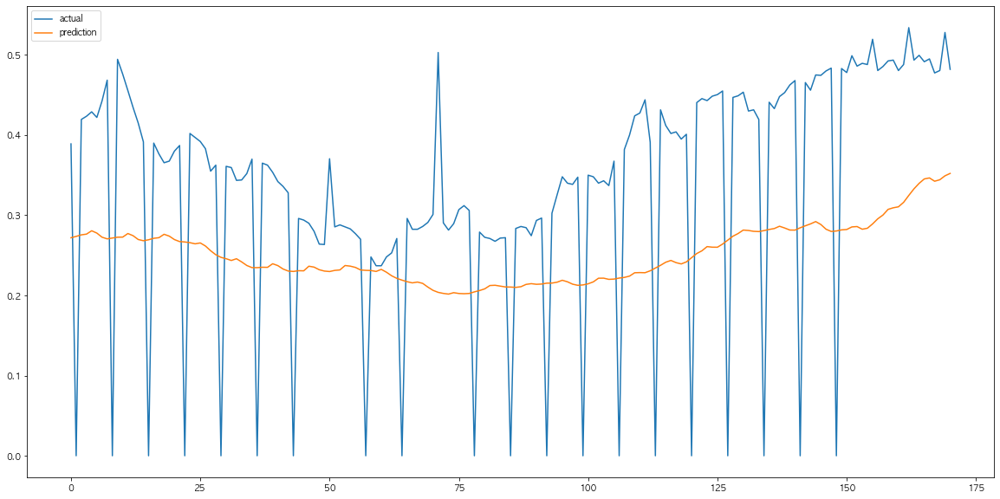

건고추_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_3 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_6 (LSTM)                (None, 28, 32)            8320      
_________________________________________________________________
lstm_7 (LSTM)                (None, 32)                8320      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa61c04a30>]
loss_function: [<function huber at 

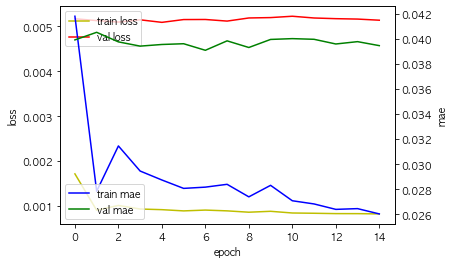

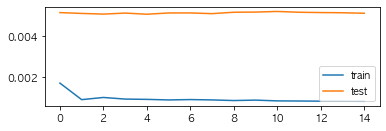

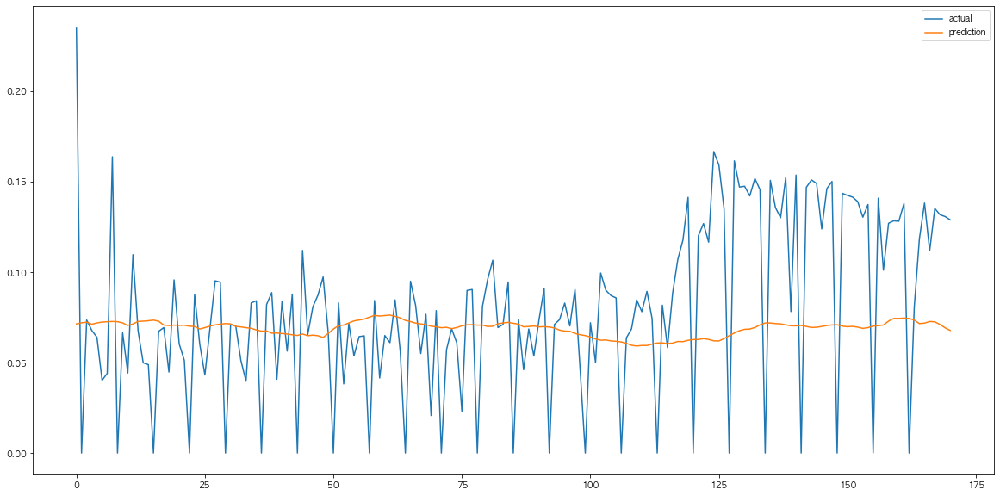

마늘_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_4 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_8 (LSTM)                (None, 28, 32)            8320      
_________________________________________________________________
lstm_9 (LSTM)                (None, 32)                8320      
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6b6c1c40>]
loss_function: [<function huber at 0

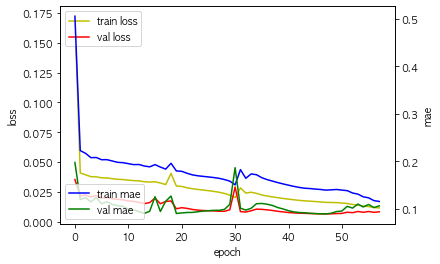

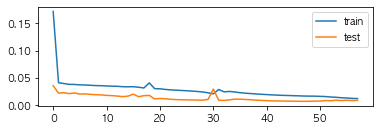

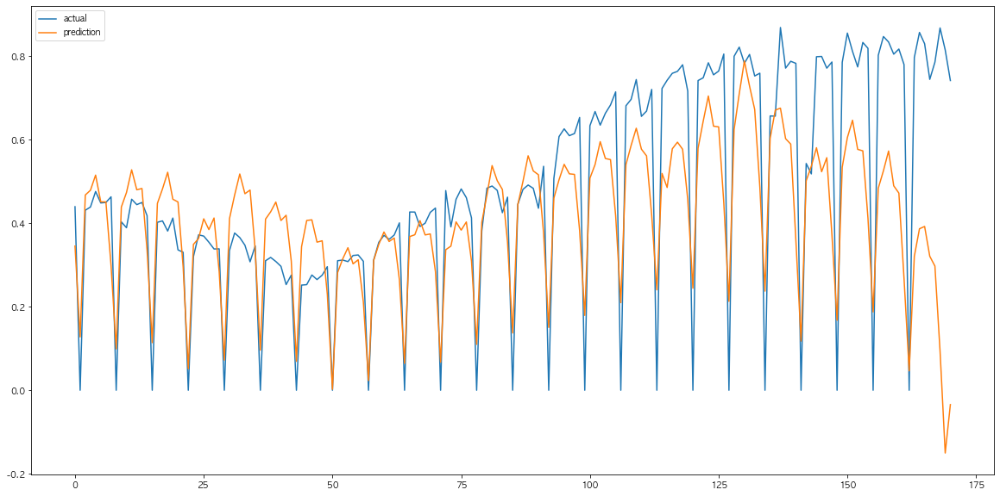

대파_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_5 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_10 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_11 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa7567c820>]
loss_function: [<function huber at 0

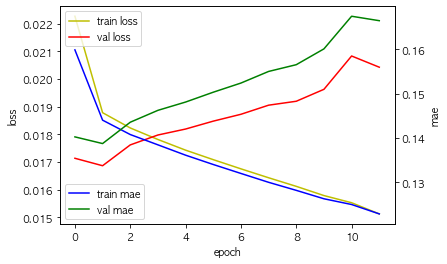

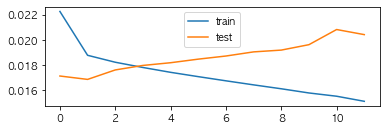

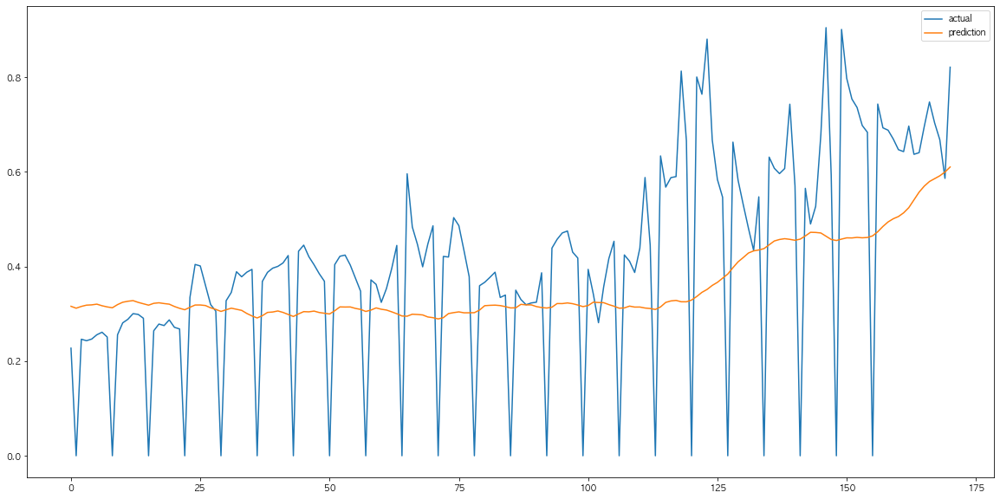

얼갈이배추_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_6 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_12 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_13 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6188d6d0>]
loss_function: [<function huber a

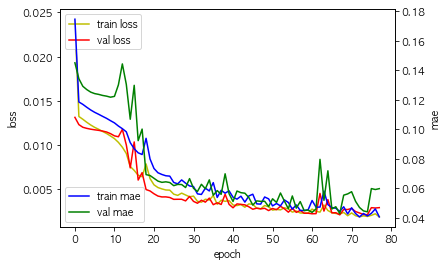

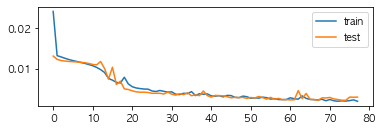

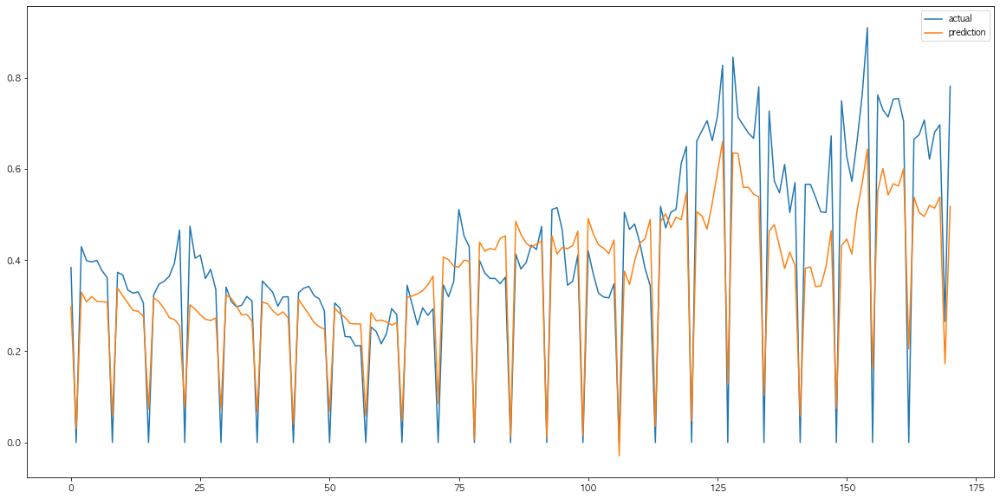

양배추_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_7 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_14 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_15 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6bc41cd0>]
loss_function: [<function huber at 

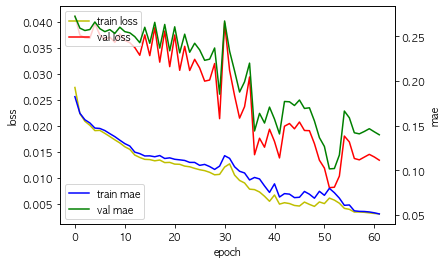

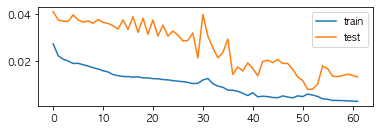

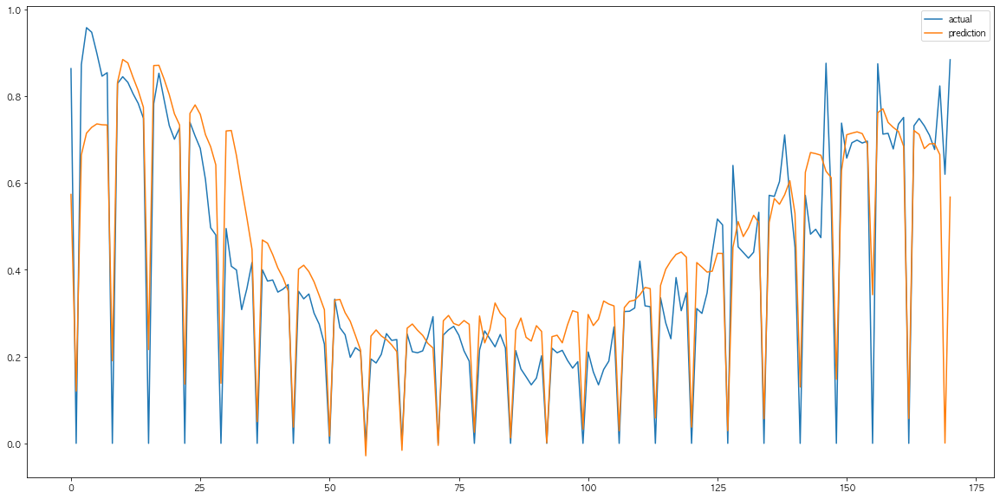

깻잎_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_8 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_16 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_17 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa5ade9580>]
loss_function: [<function huber at 0

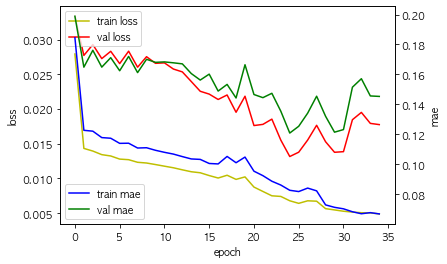

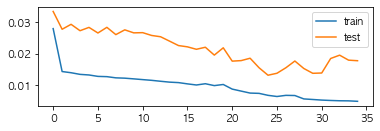

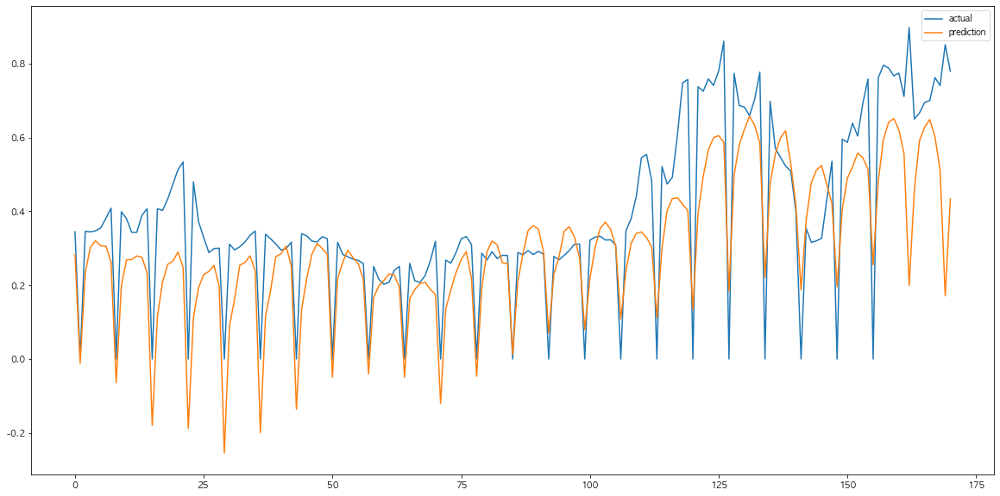

시금치_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_9 (Conv1D)            (None, 28, 32)            6912      
_________________________________________________________________
lstm_18 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_19 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa74cb7f40>]
loss_function: [<function huber at 

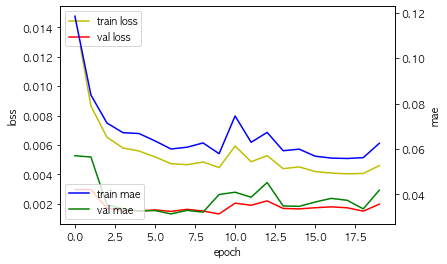

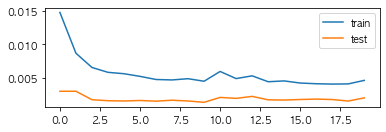

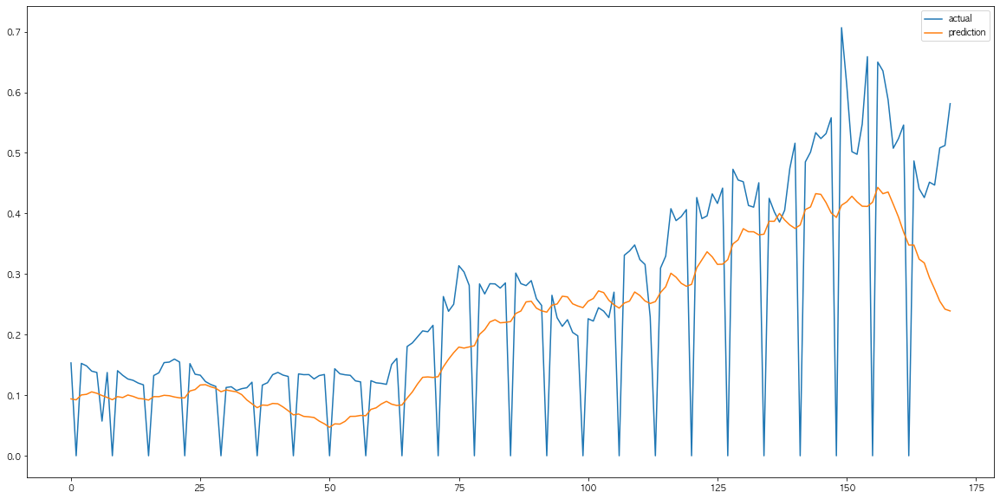

미나리_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_10 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_20 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_21 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa74cd11c0>]
loss_function: [<function huber at

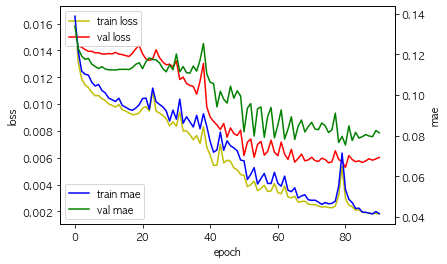

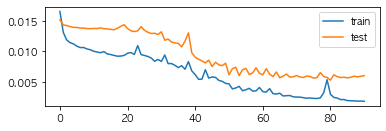

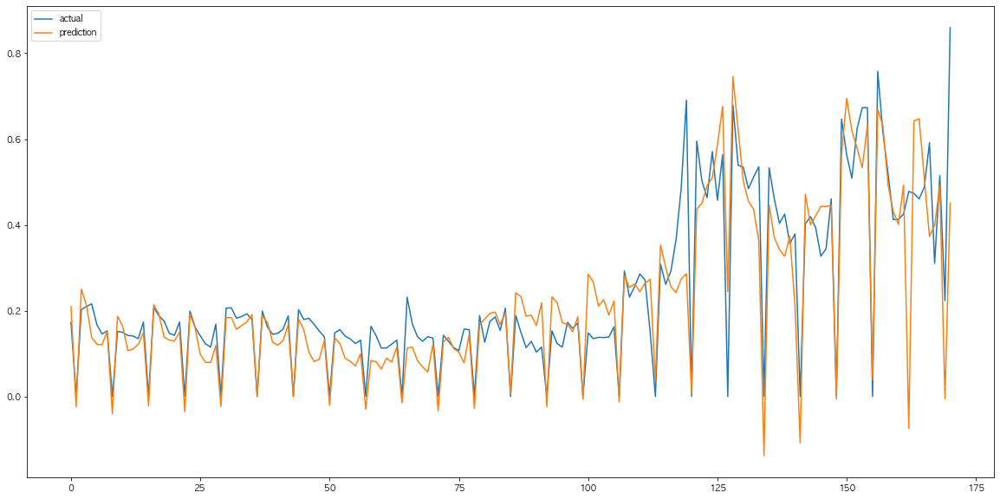

당근_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_11 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_22 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_23 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa5c3b9a90>]
loss_function: [<function huber at 

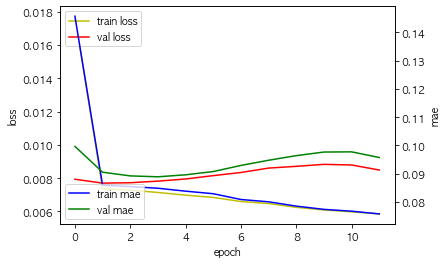

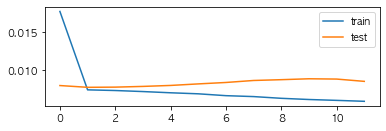

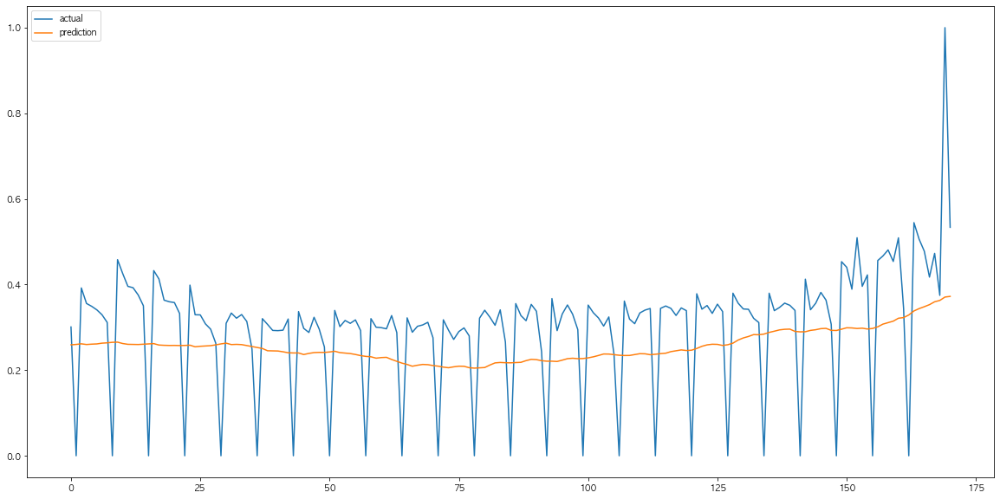

파프리카_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_12 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_24 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_25 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6a742610>]
loss_function: [<function huber a

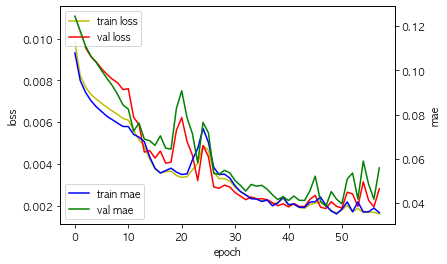

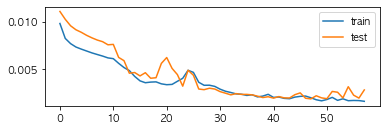

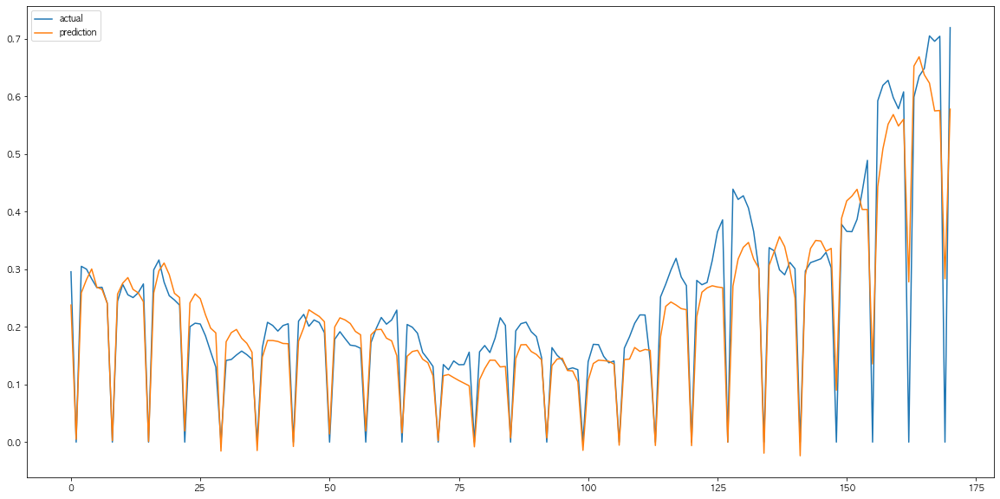

새송이_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_13 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_26 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_27 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa836fbd00>]
loss_function: [<function huber at

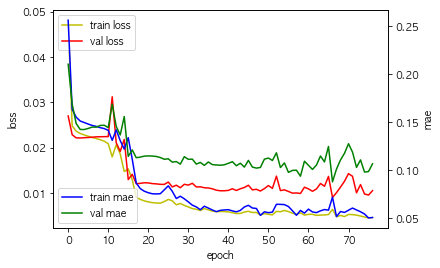

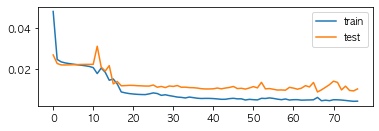

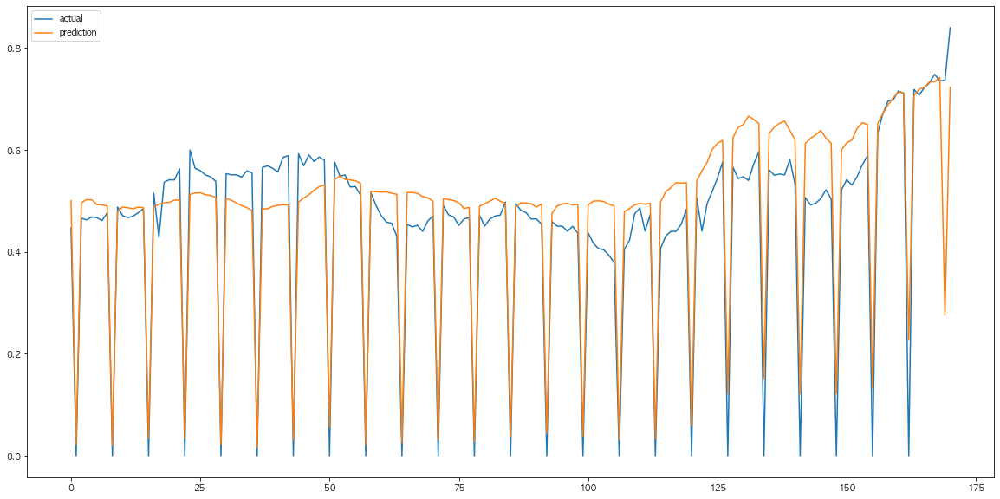

팽이버섯_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_14 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_28 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_29 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa633264f0>]
loss_function: [<function huber a

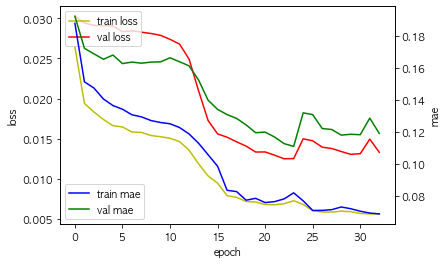

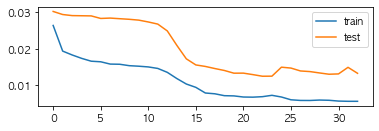

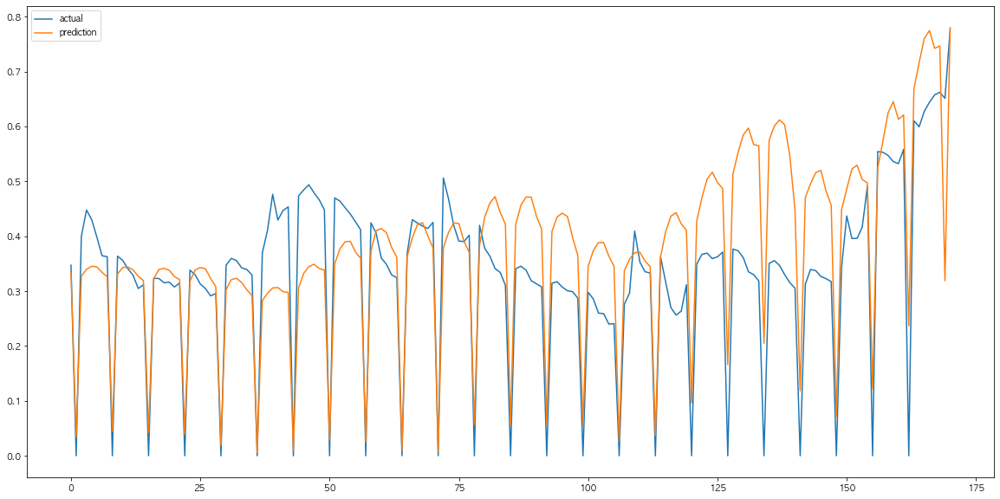

토마토_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_15 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_30 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_31 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6223c160>]
loss_function: [<function huber at

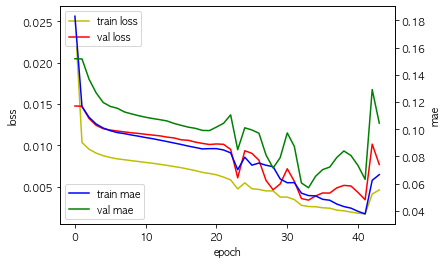

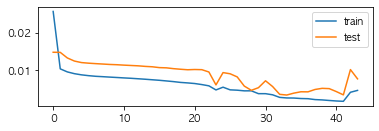

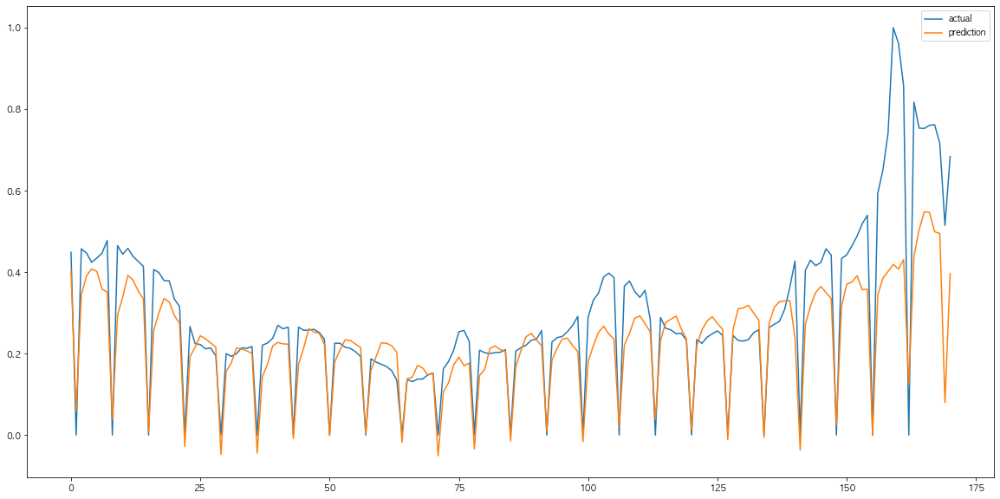

청상추_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_16 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_32 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_33 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_16 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa5d714df0>]
loss_function: [<function huber at

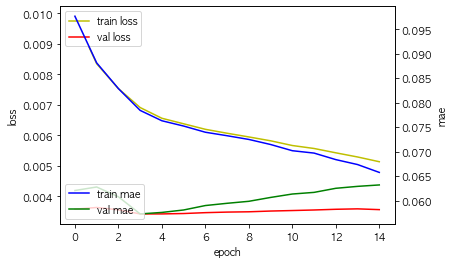

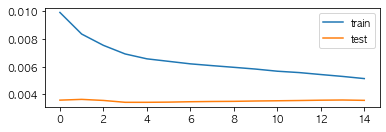

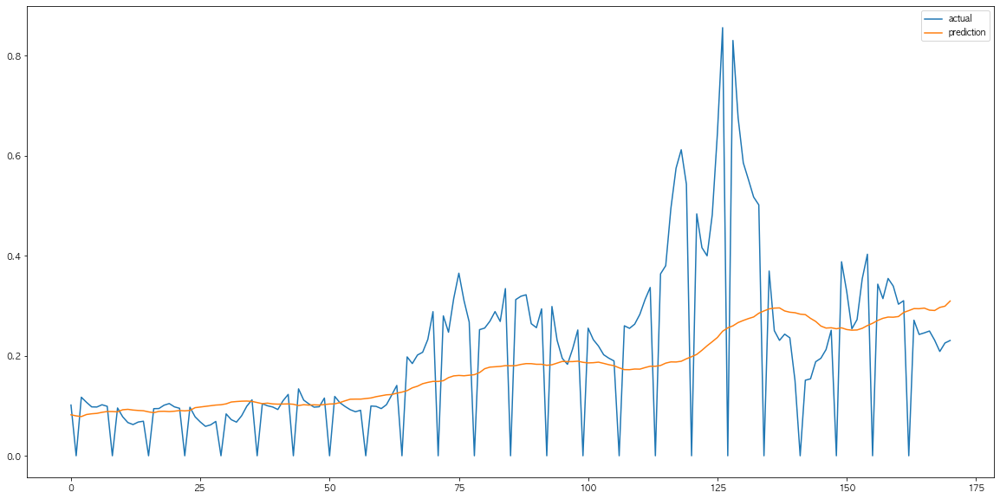

백다다기_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_17 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_34 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_35 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa67ca4cd0>]
loss_function: [<function huber a

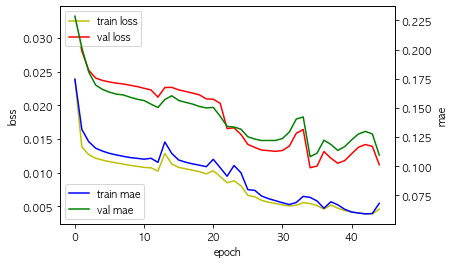

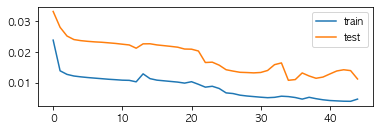

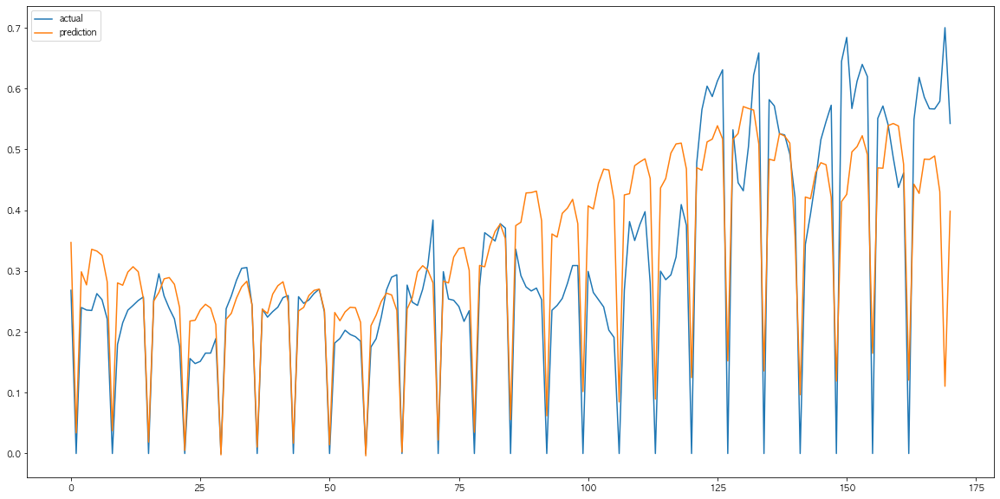

애호박_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_18 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_36 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_37 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa67c8f2e0>]
loss_function: [<function huber at

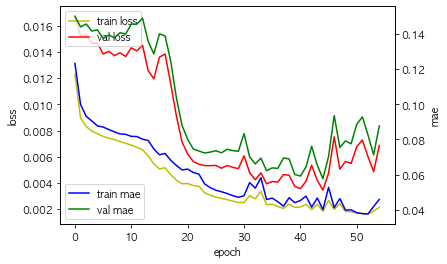

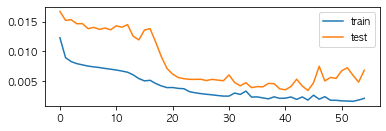

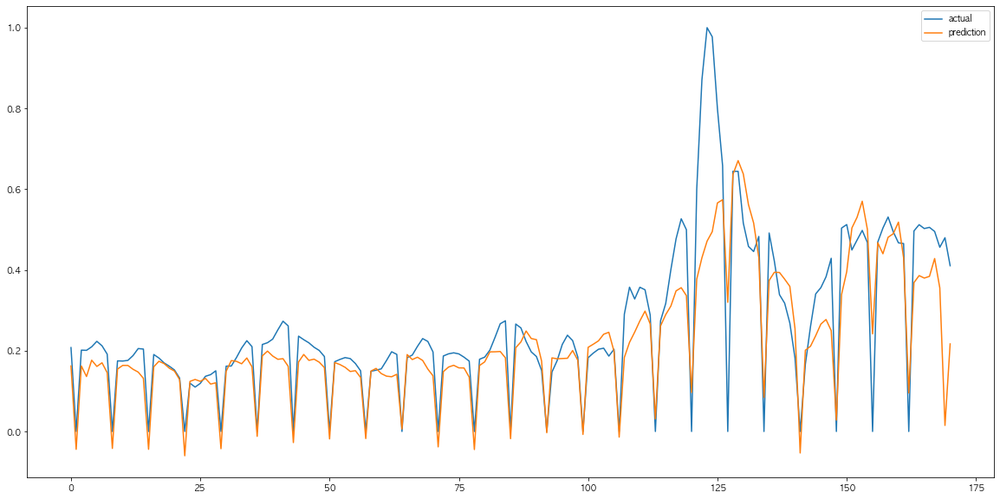

캠벨얼리_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_19 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_38 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_39 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa7578bc40>]
loss_function: [<function huber a

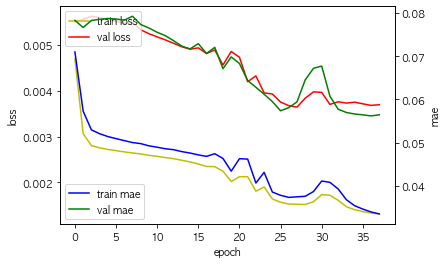

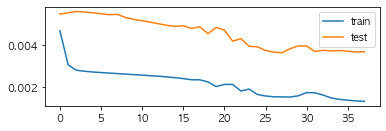

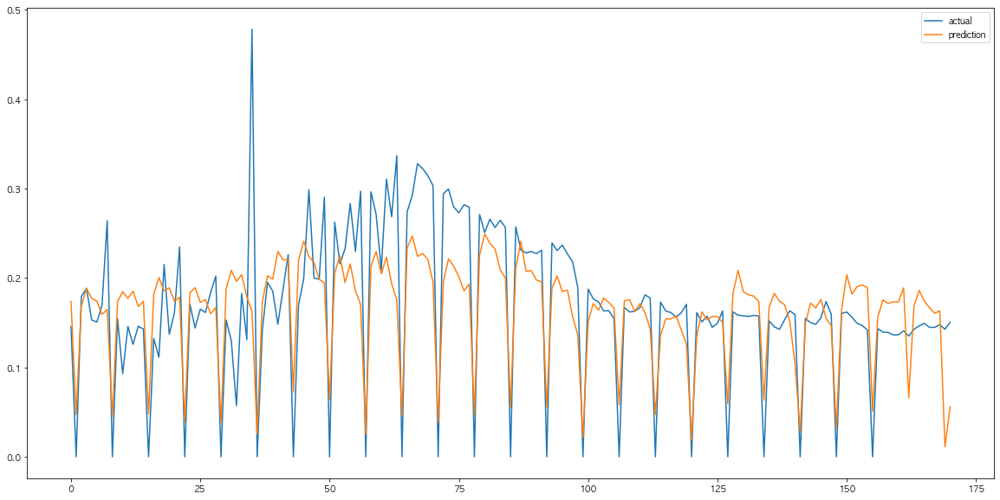

샤인마스캇_가격(원/kg)_tg 예측 모델 
(1364, 28, 43) (1364, 1)
(170, 28, 43) (170, 1)
(171, 28, 43) (171, 1)
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_20 (Conv1D)           (None, 28, 32)            6912      
_________________________________________________________________
lstm_40 (LSTM)               (None, 28, 32)            8320      
_________________________________________________________________
lstm_41 (LSTM)               (None, 32)                8320      
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 33        
Total params: 23,585
Trainable params: 23,585
Non-trainable params: 0
_________________________________________________________________
optimizer : Adam 	learning_rate:  0.0003
obtimizer_function: [<keras.optimizer_v2.adam.Adam object at 0x7ffa6337aa60>]
loss_function: [<function huber 

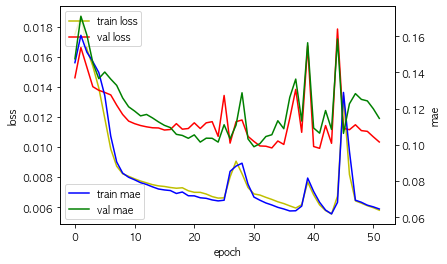

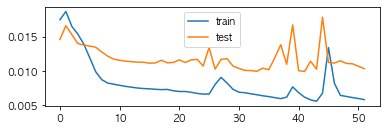

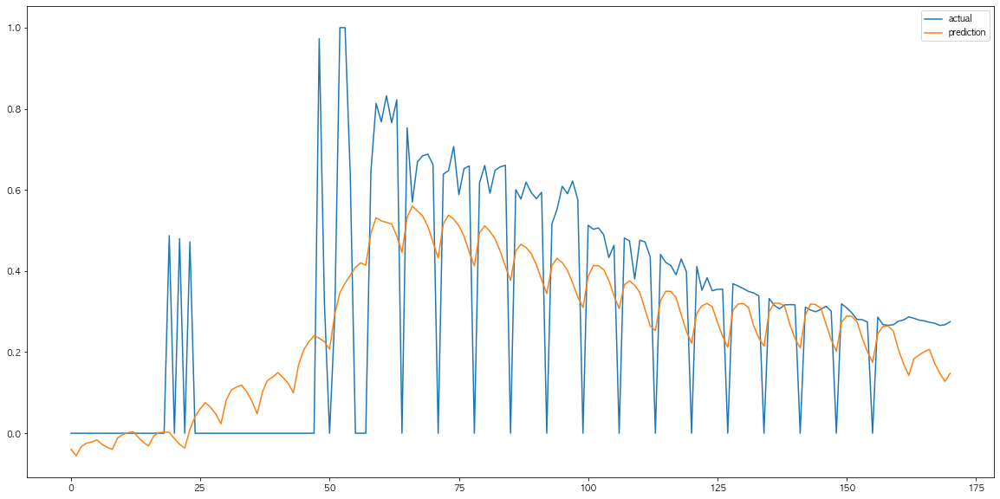

In [62]:
for col in label_col_list:
    print("="*100)
    print("{0} 예측 모델 ".format(col))
    print("="*100)
    # 입력값과 출력값으로 분리
    # train_X, train_y = train_df.iloc[:, :features_len * WINDOW_SIZE], train_df.loc[:,label_col_list[0]]
    # val_X, val_y = val_df.iloc[:, :features_len * WINDOW_SIZE], val_df.loc[:,label_col_list[0]]
    # test_X, test_y = test_df.iloc[:, :features_len * WINDOW_SIZE], test_df.loc[:,label_col_list[0]]
    train_X, train_y = train_df.iloc[:, :features_len * WINDOW_SIZE], train_df.loc[:,col]
    val_X, val_y = val_df.iloc[:, :features_len * WINDOW_SIZE], val_df.loc[:,col]
    test_X, test_y = test_df.iloc[:, :features_len * WINDOW_SIZE], test_df.loc[:,col]
    #=============================================================================================== label_col_list 변경해야함.
    # 범위, 타임스탬프, 컬럼
    train_X = train_X.values.reshape((train_X.shape[0], WINDOW_SIZE, features_len))
    val_X = val_X.values.reshape((val_X.shape[0], WINDOW_SIZE, features_len))
    test_X = test_X.values.reshape((test_X.shape[0], WINDOW_SIZE, features_len))

    train_y = train_y.values.reshape((train_y.shape[0], 1))
    val_y = val_y.values.reshape((val_y.shape[0], 1))
    test_y = test_y.values.reshape((test_y.shape[0], 1))
    # print(so_train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    print(train_X.shape, train_y.shape)
    print(val_X.shape, val_y.shape)
    print(test_X.shape, test_y.shape)

    # 모델 구성 CNN + LSTM
    conv_lstm2_model = keras.Sequential([
        keras.layers.Conv1D(filters=filter_size, kernel_size=(CONV_WIDTH[1], ),
                            strides=1, padding="causal", 
                            activation="relu", 
                            input_shape=[WINDOW_SIZE, features_n]), 
        keras.layers.LSTM(32, activation="relu", return_sequences=True),
        keras.layers.LSTM(32, activation="relu", return_sequences=False),
        # keras.layers.Dense(16, activation="relu"),
        keras.layers.Dense(1),
        # keras.layers.Lambda(lambda x: x * 200)
    ])
    conv_lstm2_model.summary()
    hist = model_complie_fit(conv_lstm2_model, train_X, train_y, val_X, val_y)
    # 저장한 데이터를 로드
    conv_lstm2_model.load_weights("best_model.h5")
    # conv_lstm_model = keras.models.load_weights("best_model.h5")
    pred = conv_lstm2_model.predict(test_X)
    val_performance_dict, performance_dict = model_perfomance_print(conv_lstm2_model, "CNN_LSTM2", val_X, val_y, test_X, test_y, False)
    score = r2_score(test_y, pred)
    # test_y.shape
    print("r2 score :", r2_score(test_y, pred))

    perfomance_plot_show(hist)
    # prediction_plot_show(test_y, pred)
    # prediction_plot_show(test_y, pred)
    # test_y_df = pd.DataFrame(test_y.reshape(test_y.shape[0]*test_y.shape[1], test_y.shape[2]))
    # pred_df=pd.DataFrame(arg_pred)

    # 예측 데이터 시각화 
    plt.figure(figsize=(20, 10))
    plt.plot(test_y, label='actual')
    plt.plot(pred, label='prediction')
    plt.legend()
    plt.show()

# 5. 결론

5.1 모델평가

LightGBM, CNN+LSTM, SVM을 모델링하고 성능테스트를 해보았습니다. 
이 중에서 SVM모델이  평균 R2-score값이 0.87로 가장 높게 측정되었습니다.

오랜 시간을 갖고 딥러닝에 파라미터 튜닝을 더 하거나 데이터 전처리를 더 잘할 경우 머신러닝 보다 더 뛰어날 수 
있을 수도 있다고 생각한다. 하지만 시간 대비 효용을 따져보았을 때, 딥러닝이 머신러닝보다 무조건 좋은것은 아닌것 같다.


5.2 실패

1. 웹크롤링으로 수입, 수출, 재배지, 생산량 등의 데이터를 가져와 사용 데이터를 만들려 했으나, 
공모전에서 사용하는 데이터와 합치는것이 제한되어 제외하게 되었다. 연단위, 월단위 데이터를 일별로 변환하는 것에 대한 회의적 의견.

2. 날씨 데이터를 만들어서 사용하려고 했으나, 컬럼 수가 너무 많아지면서 관리나 작업이 제한되어 제외하게 되었다.

3. 전체 로우 데이터의 파일 크기가 너무 컸다(약 23기가). 그래서 데이터 처리를 위해, 하둡에 대한 공부, 
AWS에 대한 공부와 고려를 하였고, 마지막에 일부씩 PICKLE를 사용하여 합치려고 했으나, 이것도 용량이 너무 컸다. 
그래서 마지막으로 데이터 정보를 손상시키는 것을 감안하고, 거래량은 sum, 거래가격은 mean으로 합쳤다. 하지만, 
이것도 주산지 컬럼이 너무 많아서 주산지를 제외하였다. 


5.3 느낀점

박시원: 이번 프로젝트를 통해 짧은 시간동안 계획을 세워 데이터를 분석 예측는 모델을 만들었습니다. 
    주제를 정하고 각자 맡은바를 공부하여 구현하는 과정으로 진행하였습니다. 프로젝트를 하면서 생각처럼 되지않아 잘못된 
    방향으로 가기도 하였습니다. 그때 팀원들과 같이 문제를 공유하고 해결 하였습니다. 이번 기회를 통해 많은 공부를 할 수 있었습니다.

손준수: 데이터 전처리 과정에서 큰 용량의 데이터 처리의 고민, 부족한 환경자원에 대한 고민, 다양한 머신러닝 모델과 딥러닝 
    모델들을 학습하고 설계, 튜닝하는 과정 등등을 경험하였습니다. 부족한 부분에서 오는 많은 아쉬움도 남지만 좋은 팀원들을 
    만나 소통하면서 직면한 문제를 하나 둘 해결하고 학습해 나가는 프로젝트를 완료하게 되어 좋았습니다.

송현욱: 대규모 데이터를 전처리 하는 것에 있어서 공부의 부족함을 느꼈습니다. 23기가 가량의 데이터를 처리할수 없어서 여러 
    수단을 팀원들과 고민할때, 하둡과 스파크에 대해 알게되었습니다. 이 부분에 대해서 더 배우고 싶다는 것을 느꼈고, 전처리를 
    하면서 막히는 부분이 여러곳에 있었지만 팀원들의 도움으로 잘 해결할 수 있어서 감사했습니다.

임태섭: 개인적으로 많이 부족함을 느꼈습니다. 동시에 집단지성의 힘을 다시 한번 느꼈습니다. 제가 막힌 문제에서 다른 조원이 
    조언을 주어 문제가 해결된 적이 많았습니다. 괜히 조를 구성하고 함께하는 것이 아님을 느끼게 되었습니다.  
    처음보는 내용이 많아 어려웠지만, 같이 스터디하면서 알아가면서 해결해서 발전되는 느낌이었습니다.


5.4 참조문헌

- LSTM 네트워크를 활용한 농산물 가격 예측 모델, 한국콘텐츠학회논문지 18vol. 18 No.11, 신성호, 이미경, 송사광, 한국과학기술연구원 연구데이터플랫폼센터, 한구과학기술정보연구원 연구데이터플랫폼센터, 과학기술연합대학원대학교 빅데이터과학과
- FTA 이행에 따른 시장개방과 농산물 수입에 영향을 미치는 요인분석, Journal of the Korea Academia-Industrial cooperation Society Vol. 18, No. 9 pp. 146-156, 2017, 지성태, 이수환, 한국농촌경제연구원
- 국내산과 수입산 농산물의 가격 전이 계수 비교: 공적분 검정을 중심으로, 농촌경제 제31권 제6호 17-37, 전상곤, 송주호, 한국농촌경제연구원 전문연구원, 한국농촌경제연구원 연구위원
- 농산물 수입 개방의 영향평가와 수입관리정책 방향, 한국농촌경제연구원 연구보고 R364/1997.12, 이재욱 연구위원, 최윤국 책임연구원
- 딥러닝을 이용한 주가 예측 모델, 숭실대학교 대학원 미디어학과 이지훈, 2016.12, 석사학위 논문
- 인공신경망 가격 예측 모델, 신유통 포커스 18-15호 정민제, 최영찬 서울대학교 박사과정, 서울대학교 교수
- 수입원재료 가격 상승의 식품물가 파급영향과 대응방향, 정책연구보고 P147.2011.6, 이용선 연구위원, 성명환 연구위원, 정학균 부연구위원, 전혜미 인턴연구원
- https://www.tensorflow.org/tutorials/quickstart/beginner?hl=ko 텐서플로우 사이트, 학습